# Introduction

This aim of this Notebook is that of developing an appropriate micro-segmentation for the customers of the German wholesale bank *Sparkasse*. In order to achieve the aforementioned, the Notebook shall follow a standard data analytics approach by assessing the dataset, pre-processing the data, applying necessarry transformations and developing clusters. Once the clusters will be created the Notebook shall be complemented with a visualisations of said clusters in order to determine what information they convey and its usefulness in addressing current market inefficienies.

## Import the DataSet  <a class="anchor" id="1"></a>

Within the first section, the data is imported.

In [1]:
#!pip install plotly
#!pip install joypy
#!pip install pyvis
#!pip install prince
#!pip install pyclustering
#!pip install clusteval
#!pip install kmodes
#!pip install gower
#!pip install scikit-learn-extra
#!pip install minisom
#!pip install fuzzy-c-means

In [2]:
# Remove the warnings

import warnings; warnings.simplefilter('ignore')

# Basic Packages

import pandas as pd
import numpy as np
from numpy import asarray
from numpy import save
import random

# Set a random state 

np.random.seed(9)

# Notebook Setup

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last"
pd.set_option('display.max_columns', None)

# Plotting Packages

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from matplotlib.widgets import SpanSelector
from bokeh.models import Div, RangeSlider, Spinner
from bokeh.plotting import figure, show
import plotly.express as px
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from joypy import joyplot
from pyvis.network import Network
from IPython.display import Image
import plotly.offline as pyo

# Set notebook mode to work in offline

pyo.init_notebook_mode()

# Packages for Transformations

import scipy.special
from scipy.stats import skew
import prince
from sklearn.preprocessing import PowerTransformer
from scipy import stats
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as UMAP
#import umap
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances


# Packages for Clustering

from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
from clusteval import clusteval
from kmodes.kmodes import KModes
from sklearn.cluster import AgglomerativeClustering 
import gower
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import DBSCAN
from minisom import MiniSom
from sklearn.cluster import Birch
import scipy.cluster.hierarchy as shc
from fcmeans import FCM
from sklearn.ensemble import RandomForestClassifier
from kmedoids import fasterpam

# Packages to measure performance

from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from scipy.spatial import distance as ssd
from pyclustering.cluster.kmedoids import kmedoids

In [3]:
# Import the dataset

df = pd.read_excel(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\Python Data\Python Practice_Data Big\PW_Data _new.xlsx')

In [4]:
# Quick view of the data

df

,Corporate Client Type,Individual Customer No. (New),Unit Number (Edited),Postalcode (Firm),Number of Individuals Included,Postalcode,Contact Person,Number of selected units in which single customer is contained,Legal Form Key,Industry key/WZ code (number),Industry key/WZ code (name),Customer Relationship Months,Duration of the business relationship,Consultant Key,Consultant Key,Expert Advisor 101,Expert Advisor 101 for Unit,Expert Advisory 103,Expert Advisor 103 for Unit,Sales,Branch,MaRisk key,BVR I Rating,VR-Rating,Risk Group,Revenues,P&L (Firm),P&L (Representatives),Active Volume (Firm),Active Volume,Bank Asset Volume (Approved),Bank Asset Volume (Utilization ),Active Volume Network,Liability Volume (Firm),Liabilities Volume,Bank Liabilities Volume,Liabilities Network,Active Condition Contribution,Passive Condition Contribution,Commission Income,Contribution Margin IB,DB II Unit,Performance Disruption,Number of Products,Number of Banking Products,Network Number of Products,Usage for unit membership (informative),Usage for Unit KK,Usage for Unit Credit Cards,Usage for unit loans (bank-owned),Usage for unit fixed-term deposits /savings,Usage for unit WP2Depot,Usage for Property Insurance,Usage for Property Insurance.1,Usage for Company Insurance,Usage for unit DZ,Usage for unit DZP,Usage for unit Union Fonds,Usage for unit building savings,Usage for unit mortgage banks,Usage for unit VR Leasing,Usage for unit TeamBank,Total Unit Usage,Deadline
0,1) Business Customers,68130531,E000002609,44263.0,2,44263.0,Ja,1,62,70200,L - Real estate activities,435,4) > 20 Jahre,82702,82702,61109.0,61109.0,0.0,0.0,Other Sales Areas,27,2,NaN,OHNE,OHNE,NaN,35075.84,NaN,5000.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2020-08-31
1,1) Business Customers,191208198,E000002609,44263.0,2,44263.0,NaN,1,62,70200,L - Real estate activities,163,3) 11 bis 20 Jahre,82702,82702,61109.0,61109.0,0.0,0.0,Other Sales Areas,27,2,10231.0,2d,10,NaN,35075.84,35075.84,5000.00,5000.00,5000.00,6671.90,0.0,0.00,0.00,0.00,0.0,377.07,0.00,140.10,517.17,NaN,0.0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2020-08-31
2,1) Business Customers,63097767,E000002639,58730.0,2,58730.0,Ja,1,211,85111,T - Households,347,4) > 20 Jahre,85402,85402,NaN,NaN,NaN,NaN,Other Sales Areas,54,2,10111.0,0e,10,NaN,7388.77,7388.77,12988.79,12988.79,12988.79,12988.79,0.0,748.17,748.17,748.17,0.0,177.71,12.30,46.60,236.61,NaN,0.0,2,2,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,2020-08-31
3,1) Business Customers,196769808,E000002639,58730.0,2,58730.0,NaN,2,2,50100,G - Wholesale and retail trade; repair of moto...,37,1) <= 5 Jahre,85402,85402,54006.0,NaN,0.0,NaN,Other Sales Areas,54,2,10116.0,1c,10,NaN,7388.77,NaN,12988.79,0.00,0.00,0.00,0.0,748.17,0.00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,2020-08-31
4,1) Business Customers,84043974,E000002640,59425.0,3,59425.0,Ja,1,2,55300,I - Accommodation and food service activities,285,4) > 20 Jahre,85101,85101,NaN,NaN,NaN,NaN,Other Sales Areas,51,2,20443.0,3b,20,NaN,191147.14,178332.68,4250.00,3500.00,3500.00,207.72,0.0,13659.72,12751.18,12277.28,473.9,400.78,30.32,437.13,868.23,NaN,0.0,7,5,2,1,1,1,0,1,0,0,1,0,0,0,1,0,0,0,0,5,2020-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32115,5) Freelancers,222104004,NaN,59063.0,0,59063.0,NaN,0,1,74123,"M - Professional, scientific and technical act...",461,4) > 20 Jahre,87011,87011,53003.0,53003.0,0.0,0.0,Other Sales Areas,70,2,10116.0,1b,10,NaN,54792.23,54792.23,2000.00,2000.00,2000.00,0.00,0.0,8326.37,8326.37,8326.37,0.0,0.48,25.68,154.15,180.31,NaN,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2020-08-31
32116,5) Freelancers,237017181,NaN,59077.0,0,59077.0,NaN,0,1,74115,"M - Professional, scientific and technical act..."

<br>

## Change Feature Names for Ease <a class="anchor" id="3"></a>

The first step is that of chagneing the names of the features in order to ensure greater readibility throughout the excercise.

In [5]:
# check the column names

df.columns

Index(['Corporate Client Type', 'Individual Customer No. (New)',
       'Unit Number (Edited)', 'Postalcode (Firm)',
       'Number of Individuals Included', 'Postalcode', 'Contact Person',
       'Number of selected units in which single customer is contained',
       'Legal Form Key', 'Industry key/WZ code (number)',
       'Industry key/WZ code (name)', 'Customer Relationship Months',
       'Duration of the business relationship', 'Consultant Key',
       'Consultant Key ', 'Expert Advisor 101', 'Expert Advisor 101 for Unit',
       'Expert Advisory 103', 'Expert Advisor 103 for Unit', 'Sales', 'Branch',
       'MaRisk key', 'BVR I Rating', 'VR-Rating', 'Risk Group', 'Revenues',
       'P&L (Firm)', 'P&L (Representatives)', 'Active Volume (Firm)',
       'Active Volume', 'Bank Asset Volume (Approved)',
       'Bank Asset Volume (Utilization )', 'Active Volume Network',
       'Liability Volume (Firm)', 'Liabilities Volume',
       'Bank Liabilities Volume', 'Liabilities Network',
 

Furthermore, it is significant to determine the presence of duplicate observations insofar these might introduce bias within the analysis

In [6]:
# check the duplicates within the df

df[df.duplicated()] 

,Corporate Client Type,Individual Customer No. (New),Unit Number (Edited),Postalcode (Firm),Number of Individuals Included,Postalcode,Contact Person,Number of selected units in which single customer is contained,Legal Form Key,Industry key/WZ code (number),Industry key/WZ code (name),Customer Relationship Months,Duration of the business relationship,Consultant Key,Consultant Key,Expert Advisor 101,Expert Advisor 101 for Unit,Expert Advisory 103,Expert Advisor 103 for Unit,Sales,Branch,MaRisk key,BVR I Rating,VR-Rating,Risk Group,Revenues,P&L (Firm),P&L (Representatives),Active Volume (Firm),Active Volume,Bank Asset Volume (Approved),Bank Asset Volume (Utilization ),Active Volume Network,Liability Volume (Firm),Liabilities Volume,Bank Liabilities Volume,Liabilities Network,Active Condition Contribution,Passive Condition Contribution,Commission Income,Contribution Margin IB,DB II Unit,Performance Disruption,Number of Products,Number of Banking Products,Network Number of Products,Usage for unit membership (informative),Usage for Unit KK,Usage for Unit Credit Cards,Usage for unit loans (bank-owned),Usage for unit fixed-term deposits /savings,Usage for unit WP2Depot,Usage for Property Insurance,Usage for Property Insurance.1,Usage for Company Insurance,Usage for unit DZ,Usage for unit DZP,Usage for unit Union Fonds,Usage for unit building savings,Usage for unit mortgage banks,Usage for unit VR Leasing,Usage for unit TeamBank,Total Unit Usage,Deadline


In [7]:
# we create a new dataframe and only include the relavent features


df1 = df[['Unit Number (Edited)',
           'Corporate Client Type',
           'Postalcode (Firm)',
           'Number of Individuals Included',
           'Legal Form Key',
           'Industry key/WZ code (number)',
           'Industry key/WZ code (name)',
           'Customer Relationship Months',
           'Duration of the business relationship',
           'Consultant Key',
           'Branch',
           'MaRisk key',
           'BVR I Rating',
           'VR-Rating',
           'Risk Group',
           'Revenues',
           'Active Volume (Firm)',
           'Active Volume',
           'Active Volume Network', 
           'Bank Asset Volume (Approved)',
           'Bank Asset Volume (Utilization )',
           'Liability Volume (Firm)',
           'Liabilities Volume',
           'Bank Liabilities Volume', 
           'Liabilities Network',
           'P&L (Firm)',
           'P&L (Representatives)',
           'Active Condition Contribution',
           'Passive Condition Contribution',
           'Commission Income',
           'Contribution Margin IB',
           'Performance Disruption',
           'Number of Products',
           'Number of Banking Products', 
           'Network Number of Products',
           'Usage for unit membership (informative)',
           'Usage for Unit KK',
           'Usage for Unit Credit Cards',
           'Usage for unit loans (bank-owned)',
           ' Usage for unit fixed-term deposits /savings',
           'Usage for unit WP2Depot',
           'Usage for Property Insurance',
           'Usage for Company Insurance',
           'Usage for unit DZ',
           'Usage for unit DZP',
           'Usage for unit Union Fonds',
           'Usage for unit building savings',
           'Usage for unit mortgage banks',
           'Usage for unit VR Leasing',
           'Usage for unit TeamBank']]


# then we can change column names to simplify and provide consistency

df1.rename(columns={  'Unit Number (Edited)': 'id',
                      'Corporate Client Type': 'client_type', 
                      'Postalcode (Firm)': 'post',
                      'Region': 'region', 
                      'City': 'city',
                      'Number of Individuals Included': 'representatives', 
                      'Legal Form Key': 'legal',
                      'Industry key/WZ code (number)': 'work_field',
                      'Industry key/WZ code (name)': 'work_name',
                      'Customer Relationship Months': 'customer_relation',
                      'Duration of the business relationship': 'customer_relation_months',
                      'Consultant Key': 'consultant',
                      'Branch': 'branch',
                      'MaRisk key': 'marisk', 
                      'VR-Rating': 'vr',
                      'Risk Group': 'risk_group',
                      'Revenues': 'revenue',
                      'Active Volume (Firm)': 'volume_firm',
                      'Active Volume': 'volume', 
                      'Active Volume Network': 'volume_network',
                      'Bank Asset Volume (Approved)': 'loans_approved',
                      'Bank Asset Volume (Utilization )': 'loans_utilized', 
                      'Liability Volume (Firm)': 'liabilities_firm' ,
                      'Liabilities Volume': 'liabilities',
                      'Bank Liabilities Volume': 'bank_liabilities',
                      'Liabilities Network': 'other_liabilities',
                      'P&L (Firm)': 'pl_firm',
                      'P&L (Representatives)': 'pl',
                      'Bank Liabilities Volume': 'bank_liabilities',
                      'Active Condition Contribution': 'active_cc',
                      'Passive Condition Contribution': 'passive_cc',
                      'Commission Income': 'commission_income',
                      'Contribution Margin IB': 'cmib',
                      'Performance Disruption': 'disruption',
                      'Number of Products': 'products',
                      'Number of Banking Products': 'banking_products', 
                      'Network Number of Products': 'other_products',
                      'Usage for unit membership (informative)': 'p_membership',
                      'Usage for Unit KK': 'p_KK',
                      'Usage for Unit Credit Cards': 'p_creditcard', 
                      'Usage for unit loans (bank-owned)': 'p_bankloans',
                      ' Usage for unit fixed-term deposits /savings': 'p_fixeddeposits',
                      'Usage for unit WP2Depot': 'p_WP2Depot', 
                      'Usage for Property Insurance': 'p_propertyinsurance',
                      'Usage for Company Insurance': 'p_companyinsurance',
                      'Usage for unit DZ': 'p_DZ',
                      'Usage for unit DZP': 'p_DZP', 
                      'Usage for unit Union Fonds': 'p_unionfunds',
                      'Usage for unit building savings': 'p_buildingsavings',
                      'Usage for unit mortgage banks': 'p_mortgage', 
                      'Usage for unit VR Leasing': 'p_VRleasing',
                      'Usage for unit TeamBank': 'p_teambank',
                      'BVR I Rating': 'bvr'
                       }, 
           inplace=True)

<br>

## Number of Missing Values <a class="anchor" id="4"></a>

Once the feature names are replaced, basic explanatory analysis can be conducted. A basic EDA process revoles around the identification of the features' distirbutions and inherent characteristics. Therefore, it is important to assess for NaN, missing values and zero values. <br>

In [8]:
# quick overview of the distirbution of the numerical variables

df1[['revenue', 
    'volume_firm', 
    'volume',
    'volume_network',
    'loans_approved',
    'loans_utilized',     
    'liabilities',
    'liabilities_firm',     
    'bank_liabilities',
    'other_liabilities',
    'pl_firm',
    'pl',
    'active_cc',
    'passive_cc',
    'commission_income',
    'cmib',
    'disruption',
    'products',
    'banking_products',
    'other_products']].describe().T

,count,mean,std,min,25%,50%,75%,max
revenue,2178.0,6.759396e+07,2.454116e+09,10.00,286000.0000,883500.000,3.463750e+06,1.143020e+11
volume_firm,32120.0,5.968748e+07,6.550084e+08,0.00,200.0000,50994.260,4.624275e+05,7.577186e+09
volume,32120.0,6.863807e+05,3.761875e+07,0.00,0.0000,0.000,3.000000e+04,3.400000e+09
volume_network,32120.0,2.742045e+03,2.647913e+05,0.00,0.0000,0.000,0.000000e+00,4.418837e+07
loans_approved,32120.0,6.836387e+05,3.761713e+07,0.00,0.0000,0.000,2.843373e+04,3.400000e+09
loans_utilized,32120.0,1.525877e+05,1.216402e+06,0.00,0.0000,0.000,5.176698e+03,7.049000e+07
liabilities,32120.0,1.436754e+05,6.260588e+06,0.00,0.0000,3320.230,2.970836e+04,1.093566e+09
liabilities_firm,32120.0,5.299798e+06,2.517820e+07,0.00,3171.9300,29969.550,2.137165e+05,1.093566e+09
bank_liabilities,32120.0,1.405803e+05,6.258721e+06,0.00,0.0000,2481.475,2.598583e+04,1.093566e+09
other_liabilities,32120.0,3.095156e+03,3.461302e+04,0.00,0.0000,0.000,0.000000e+00,3.878053e+06


In [9]:
# we check the number of missing values per column

df1.isna().sum()

id                          11031
client_type                     0
post                           73
representatives                 0
legal                           0
work_field                      0
work_name                       0
customer_relation               0
customer_relation_months        0
consultant                      0
branch                          0
marisk                          0
bvr                          7048
vr                              0
risk_group                      0
revenue                     29942
volume_firm                     0
volume                          0
volume_network                  0
loans_approved                  0
loans_utilized                  0
liabilities_firm                0
liabilities                     0
bank_liabilities                0
other_liabilities               0
pl_firm                         0
pl                          11332
active_cc                   12588
passive_cc                   5883
commission_inc

In [10]:
# we check the percentage of missing values per column

for i in df1:
    p = (df1[i].isna().sum()) / (len(df1[i]))*100
    print('Missing values for ' + i + ': ' + str(p))

Missing values for id: 34.34308841843088
Missing values for client_type: 0.0
Missing values for post: 0.22727272727272727
Missing values for representatives: 0.0
Missing values for legal: 0.0
Missing values for work_field: 0.0
Missing values for work_name: 0.0
Missing values for customer_relation: 0.0
Missing values for customer_relation_months: 0.0
Missing values for consultant: 0.0
Missing values for branch: 0.0
Missing values for marisk: 0.0
Missing values for bvr: 21.94271481942715
Missing values for vr: 0.0
Missing values for risk_group: 0.0
Missing values for revenue: 93.21917808219177
Missing values for volume_firm: 0.0
Missing values for volume: 0.0
Missing values for volume_network: 0.0
Missing values for loans_approved: 0.0
Missing values for loans_utilized: 0.0
Missing values for liabilities_firm: 0.0
Missing values for liabilities: 0.0
Missing values for bank_liabilities: 0.0
Missing values for other_liabilities: 0.0
Missing values for pl_firm: 0.0
Missing values for pl: 35

The data presents multiple features with NaN. For summary purposes the missing values are described below: <br><br>
    - **Unit Number (Edited)**: 34.3% <br>
    - **BVR I Rating**: 21.9%                         
    - **Revenues**: 93.2%                             
    - **Credit Turnover (AKA: PL)**: 35.2%                      
    - **Active Condition Contribution**: 39.1%       
    - **Passive Condition Contribution**: 18.3%      
    - **Commission Income**: 11.3%                  
    - **Contribution Margin IB**: 11.3%             
    - **Performance Disruption**: 11.3%             
    
Given the identification numbers won't be needed, the feature can be dropped at a later stage. Furthermore, the presence of mulitple risk features also entails that BVR can be removed. Since only 7.8% of revenues are listed, this feature must be removed. Lastly, Credit Turnover, Active Condition Contribution, Passive Condition Contribution, Commission Income, Contribution Margin IB and Performance Disruption will have to be addresssed at a later stage.

<br>

## Zero Values  <a class="anchor" id="5"></a>

The next step is that of identifying whether the dataset depicts a high number of zero values.

In [11]:
# we check the percentage of zero values per column

for i in df1:
    p = (len(df[df1[i] == 0]) / (len(df1[i]))*100)
    print('Zero values for ' + i + ': ' + str(p))

Zero values for id: 0.0
Zero values for client_type: 0.0
Zero values for post: 0.015566625155666251
Zero values for representatives: 34.34308841843088
Zero values for legal: 0.0
Zero values for work_field: 2.6681195516811957
Zero values for work_name: 0.0
Zero values for customer_relation: 0.2054794520547945
Zero values for customer_relation_months: 0.0
Zero values for consultant: 0.024906600249066
Zero values for branch: 0.8468244084682441
Zero values for marisk: 0.0
Zero values for bvr: 0.0
Zero values for vr: 0.0
Zero values for risk_group: 0.0
Zero values for revenue: 0.0
Zero values for volume_firm: 24.90348692403487
Zero values for volume: 51.89601494396015
Zero values for volume_network: 99.0068493150685
Zero values for loans_approved: 52.16687422166875
Zero values for loans_utilized: 65.39850560398506
Zero values for liabilities_firm: 6.864881693648817
Zero values for liabilities: 27.795765877957656
Zero values for bank_liabilities: 29.903486924034866
Zero values for other_liab

Most of the features in this case are categorical variables. Therefore we select a subset of the dataframe to only include numerical features. Once that is the case we can count the percentage of values which are equal to zero per column.

In [12]:
# create a new dataframe

columns_zero = df1[['revenue',
       'volume_firm', 'volume', 'volume_network', 'loans_approved',
       'loans_utilized', 'liabilities_firm', 'liabilities', 'bank_liabilities',
       'other_liabilities', 'pl_firm', 'pl', 'active_cc', 'passive_cc',
       'commission_income', 'cmib', 'disruption']]



In [13]:
# we re-check the percentage of zero values per column

for i in columns_zero:
    p = (len(columns_zero[columns_zero[i] == 0]) / (len(columns_zero[i]))*100)
    if p>20:
        print('Zero values for ' + i + ': ' + str(p))

Zero values for volume_firm: 24.90348692403487
Zero values for volume: 51.89601494396015
Zero values for volume_network: 99.0068493150685
Zero values for loans_approved: 52.16687422166875
Zero values for loans_utilized: 65.39850560398506
Zero values for liabilities: 27.795765877957656
Zero values for bank_liabilities: 29.903486924034866
Zero values for other_liabilities: 90.37359900373599
Zero values for disruption: 76.91780821917808


<br>

The most important features portraying a high number of zeros are the following:<br>
    - **volume_firm** <br>
    - **volume **<br>
    - **volume_network**<br>
    - **loans_approved**<br>
    - **loans_utilized**<br>
    - **liabilities**<br>
    - **bank_liabilities**<br>
    - **other_liabilities**<br>
    - **disruption**. <br><br>
    
When conducting an assessment, it was identified the main reason behind this characteristic. Specifically, this is due to the presence of *groups*. To elucidate, the dataset reports the observations for individual companies and thus every row represents a different unit. The issue at hand is that the companies might fall under a bigger *groups* (i.e. conglomerates) and might thus be *representatives* of that group. This same fact is depicted by the presence of two features for id. The former id number  might be the same for several observations while the latter identifies the the unique representatives int the dataset.

Furthemore, the financial variables report the KPIs for the single unit (e.g. volume) and the ones for the group (e.g. volume_firm). Consequentially, a volume_group of 3,000 has to be spread throughout the volumes of the representatives of that group. Therefore, it might be the case that many representatives' volumes are 0.<br> <br> 

This particular issue might create skewness within the dataset but should be manageable. On the other hand, if the financial observations of the groups are 0 this is harder to deal with. This reasoning derives from the fact that a 0 value in this case would be comparable to a NaN value for both the firm and the representatives since the client(s) in this case would not be actually utilizing the products of the bank. <br> <br> 

In order to solve the issue it is necessarry to eliminate all non-utilizable data and then further find an appropriate means of tranforming the dataset in order to avoid high skewness and highly unequal distributions of values.

To solve the issue, it is important to first check whether the concentration of group zero values predominantly affects one single client type. This might be due to the fact that smaller businesses might fail to report accurate financial KPIs on a yearly basis.

In [14]:
print('\n')
print('Number of non-utilizable values per client type: \n')

print('Business Customers: ' + 
      str(len(df1[((df1['volume_firm'].isna()) 
                   | (df1['volume_firm']==0.00)
                   | (df1['liabilities_firm'].isna()) 
                   | (df1['liabilities_firm']==0.00) 
                   | (df1['pl_firm'].isna()) 
                   | (df1['pl_firm']==0.00)) 
                  & (df1['client_type']=='1) Business Customers')]) 
          / len(df1[df1['client_type']=='1) Business Customers']) * 100))

print('Commercial Customers: ' + 
      str(len(df1[((df1['volume_firm'].isna())
                   | (df1['volume_firm']==0.00)
                   | (df1['liabilities_firm'].isna()) 
                   | (df1['liabilities_firm']==0.00) 
                   | (df1['pl_firm'].isna()) | (df1['pl_firm']==0.00)) 
                  & (df1['client_type']=='2) Commercial Customers')]) 
          / len(df1[df1['client_type']=='2) Commercial Customers']) * 100))

print('Medium-Sized Companies: ' + 
      str(len(df1[((df1['volume_firm'].isna()) 
                   | (df1['volume_firm']==0.00)
                   | (df1['liabilities_firm'].isna()) 
                   | (df1['liabilities_firm']==0.00) 
                   | (df1['pl_firm'].isna()) | (df1['pl_firm']==0.00)) 
                  & (df1['client_type']=='3) Medium-Sized Companies')]) 
          / len(df1[df1['client_type']=='3) Medium-Sized Companies']) * 100))

print('Uppser Middle-Sized Companies: ' + 
      str(len(df1[((df1['volume_firm'].isna()) 
                   | (df1['volume_firm']==0.00)
                   | (df1['liabilities_firm'].isna()) 
                   | (df1['liabilities_firm']==0.00) 
                   | (df1['pl_firm'].isna()) | (df1['pl_firm']==0.00)) 
                  & (df1['client_type']=='4) Upper Middle-Sized Companies')]) 
          / len(df1[df1['client_type']=='4) Upper Middle-Sized Companies']) * 100))

print('Freelancers: ' + 
      str(len(df1[((df1['volume_firm'].isna()) 
                   | (df1['volume_firm']==0.00)
                   | (df1['liabilities_firm'].isna()) 
                   | (df1['liabilities_firm']==0.00) 
                   | (df1['pl_firm'].isna()) | (df1['pl_firm']==0.00)) 
                  & (df1['client_type']=='5) Freelancers')]) 
          / len(df1[df1['client_type']=='5) Freelancers']) * 100))

print('\n')



Number of non-utilizable values per client type: 

Business Customers: 68.14191220685508
Commercial Customers: 27.167406835296386
Medium-Sized Companies: 15.96909207984546
Uppser Middle-Sized Companies: 8.589341692789969
Freelancers: 28.60457408021213




All client types appear to have a high presence of zero values, consequentially we cannot merely drop one client type. On the other hand we cannot only use Uppser Middle-Sized Companies because the observations are too little. For greater clarity of the dataset it is important to also determine the various skewness scores of the featrues

In [15]:
print('Skewness for Volume: ' + str(skew(df['Active Volume'])))
print('Skewness for Group Volume: ' + str(skew(df['Active Volume (Firm)'])))
print('Skewness for Liabilities: ' + str(skew(df['Liabilities Volume'])))
print('Skewness for Group Liability: ' + str(skew(df['Liability Volume (Firm)'])))
print('Skewness for P&L: ' + str(skew(df['P&L (Representatives)'].dropna())))
print('Skewness for Group P&L: ' + str(skew(df['P&L (Firm)'])))

Skewness for Volume: 88.04332260629414
Skewness for Group Volume: 11.269243760958464
Skewness for Liabilities: 166.54881877423162
Skewness for Group Liability: 7.4151031044519575
Skewness for P&L: 57.650086984914594
Skewness for Group P&L: 71.92966404003113


The next step is that of plotting the financial features to identify the distributions of the values.

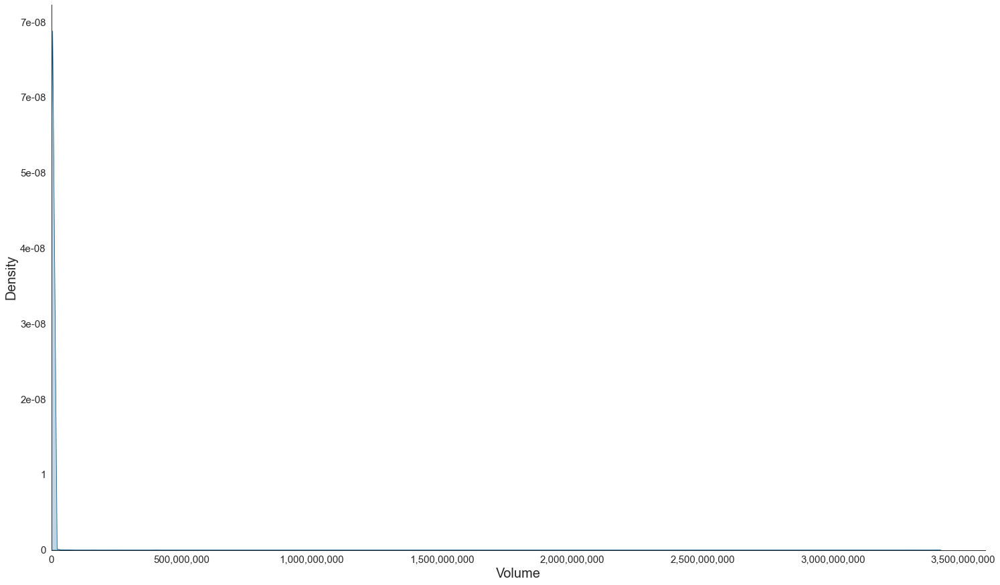

In [17]:
# Plot the distribution of volume

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))

#create the kdeplot and set the font
j= sns.kdeplot(df1['volume'], shade = True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Representatives\' Volume', fontsize = 25, pad = 17)
ax.set_xlabel('Volume', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)

ax.set_xlim(left=0)

j.set_yticklabels(labels=[0, 1, 0.00000002, 0.00000003, 0.00000004, 
                          0.00000005, 0.00000007, 0.00000007], size = 15)
j.set_xticklabels(labels=['0', '500,000,000', '1,000,000,000', '1,500,000,000', '2,000,000,000', '2,500,000,000',
                          '3,000,000,000', '3,500,000,000'], size = 15)

# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

plt.savefig('Volume_representative.png', dmi=1200)

sns.despine()

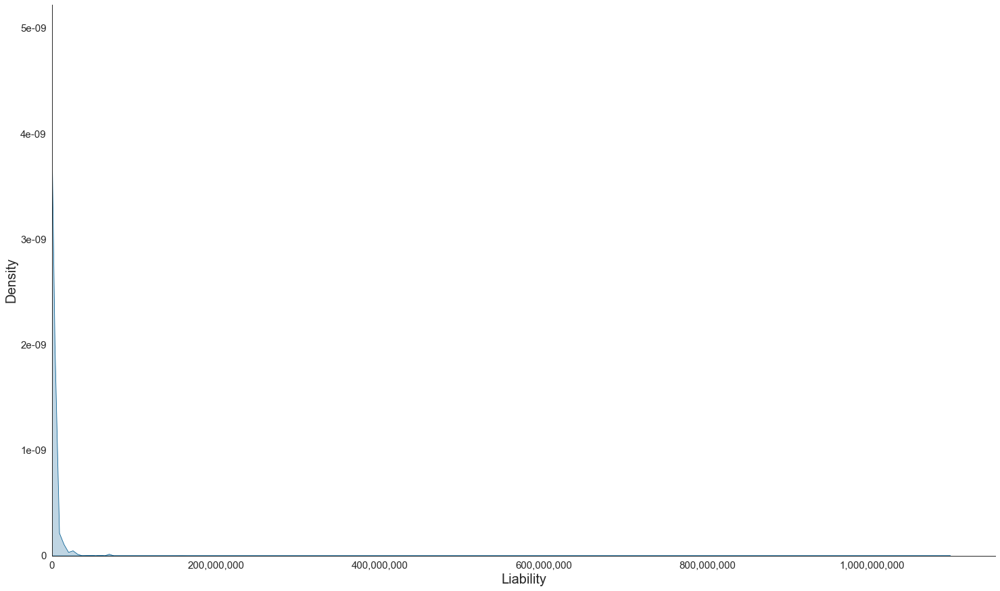

In [18]:
# Plot the distribution of liabilities

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))

#create the kdeplot and set the font
j= sns.kdeplot(df1['liabilities'], shade = True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Representatives\' Liabilities', fontsize = 25, pad = 17)
ax.set_xlabel('Liability', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)

ax.set_xlim(left=0)

j.set_yticklabels(labels=[0, 0.000000001, 0.000000002, 
                          0.000000003, 0.000000004, 0.000000005], size = 15)
j.set_xticklabels(labels=['0', '200,000,000', '400,000,000', '600,000,000', '800,000,000',
                          '1,000,000,000'], size = 15)

# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

plt.savefig('Liability_representative.png', dmi=1200)

sns.despine()

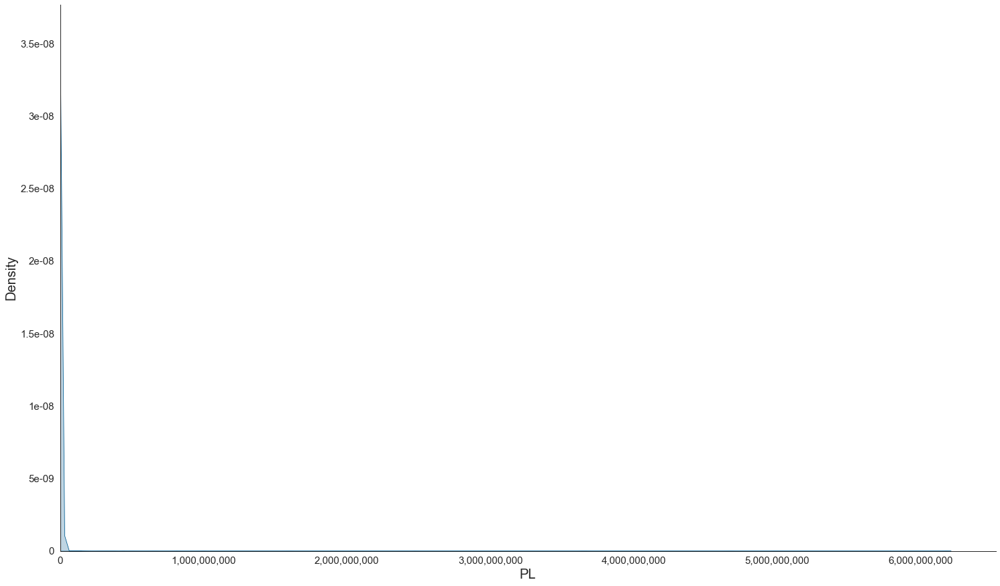

In [19]:
# Plot the distribution of PL

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))

#create the kdeplot and set the font
j= sns.kdeplot(df1['pl'], shade = True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Representatives\' PL', fontsize = 25, pad = 17)
ax.set_xlabel('PL', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)

ax.set_xlim(left=0)

j.set_yticklabels(labels=[0, 0.000000005, 0.000000010, 0.000000015, 0.000000020, 
                          0.000000025, 0.000000030, 0.000000035], size = 15)
j.set_xticklabels(labels=['0', '1,000,000,000', '2,000,000,000', '3,000,000,000', '4,000,000,000',
                          '5,000,000,000', '6,000,000,000'], size = 15)

# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

plt.savefig('PL_representative.png', dmi=1200)

sns.despine()

All features are highly skewed to the right and depict a few obervations on the other extreme of the spectrum. These are outliers within the dataset.

Therefore it is important to determine how to subset the dataset by utilising a business intelligent approach. A potential solution might be in the grouping of the representatives under groups and observation as one.

In [20]:
df1['client_type'].value_counts()

1) Business Customers              8315
4) Upper Middle-Sized Companies    6380
3) Medium-Sized Companies          6212
5) Freelancers                     6034
2) Commercial Customers            5179
Name: client_type, dtype: int64

In [21]:
print('The total number of observations which can be utilized are: ' + 
      str(32120-((8315 * .6814191220685508) + (5179 * .27167406835296386) + 
                 (6212 * .1596909207984546) + (6380 * .08589341692789969) + (6034 * .2860457408021213))))

The total number of observations which can be utilized are: 21781.0


As of right now, prior to the grouping, the following is the distirbution of non-utilizable data.

Total observations per **category**:<br>

1) Business Customers: 8315 <br>
2) Commercial Customers: 5179 <br>
3) Medium-Sized Companies: 6212 <br>
4) Upper Middle-Sized Companies: 6380 <br>
5) Freelancers: 6034 <br>

<br>
<br>

Number of 0 values or NaN per category for **volume_firm**:<br>

1) Business Customers: 5017 <br>
2) Commercial Customers: 860 <br>
3) Medium-Sized Companies: 566 <br>
4) Upper Middle-Sized Companies: 186 <br>
5) Freelancers: 1370 <br>

<br>
<br>

Number of 0 values or NaN per category for **liabilities_firm**:<br>

1) Business Customers: 858  <br>
2) Commercial Customers: 402  <br>
3) Medium-Sized Companies: 342  <br>
4) Upper Middle-Sized Companies: 283 <br>
5) Freelancers: 320 <br>

<br>
<br>

Number of 0 values or NaN per category for **pl_firm**:<br>

1) Business Customers: 2205  <br>
2) Commercial Customers: 502  <br>
3) Medium-Sized Companies: 225 <br>
4) Upper Middle-Sized Companies: 194 <br>
5) Freelancers: 744 <br>


## Number of Groups <a class="anchor" id="6"></a>

Since the client segmentation approach did not produce a viable means of segmenting the dataset, it is important to consider the grouping.

<br> 
<br>
To do so it is important to first consider the value id, since the feature id or 'Unit Number (Edited)' has missing values. The notebook must first determine whether they are single representatives without a group or whether they belong to a group but the id was not reported.
In other words it is important to check whether the missing values in the 'Unit Number (Edited)' column are supposed to be replaced with another Unit Number value or whether they can be replaced with a newly generated value.
<br> <br>
To do so, the steps shall be the following:<br>
    1) create a mask with columns that are supposed to be the same within the same company (Post Code, Volume (Group), Liability (Group), etc.) <br>
    2) Count the number of values <br>
    3) Count the number of Unit Number (Edited) <br>
    4) Compare the two numbers because if they are equal than there is an equal number of unique IDs as number of observations.


In [22]:
random_series = df1[["post",
                     "volume_firm",
                     "liabilities_firm",
                     "pl_firm"]].duplicated(keep=False)

random_series.value_counts()

True     21287
False    10833
dtype: int64

In [23]:
mix = df1[random_series]
len(mix)

21287

As a consequence, we can create new random values for the ones that are missing.

In [24]:
df1['id'].nunique()

6280

In [25]:
df1['id'].isna().sum()

id_num = (df1['id'].isna().cumsum() + 1).astype(int)

df1['id'] = df1['id'].fillna('E' + id_num.astype(str))

df1['id'].nunique()


17311

This is just temporary dataset but there 17311 unique variables for the IDs which can be used in case of grouping. The next step is checking whether this information matches the number of representatives per unit.

In [26]:
# Here we see the unique values for the number of representatives of the firms

df1['representatives'].value_counts()

0      11031
2       6664
3       4992
4       2468
5       1355
823      823
6        792
7        490
8        336
11       231
10       230
227      227
15       180
9        171
17       170
145      145
12       144
125      125
122      122
121      121
101      101
16        96
13        91
41        82
81        81
77        77
18        72
36        72
34        68
20        60
56        56
14        56
27        54
50        50
22        44
21        42
19        38
33        33
32        32
26        26
25        25
24        24
23        23
Name: representatives, dtype: int64

In [27]:
# We now create two lists; one for the index and one for the values
# This will help determine how many different groups exist

l1 = df1['representatives'].value_counts().index.tolist()
l2 = df1['representatives'].value_counts().tolist()

# we then create a list to see whether the observations add up to the total of the df
final = 0
for i in range(0, len(l2)):
    final = final + l2[i]

# we remove the first element given that these are single representatives (0)
del l1[0]
del l2[0]

# we divide the number in the index by the value count to see how many groups we have
n_groups = [y/x for x, y in zip((l1), (l2))]


# we create a new list and measure the length
final_group = 0
for i in range(0, len(n_groups)):
    final_group = final_group + n_groups[i]


In [28]:
print('\n')
print(' We would have a total of ' 
      + str(int(final_group)) 
      + ' observations. \n The number is still relatively high, entailing that we could potentially perform clustering on this dataset.')
print('\n')



 We would have a total of 6280 observations. 
 The number is still relatively high, entailing that we could potentially perform clustering on this dataset.




On top of that we would have approximately 11031 values without a group. Therefore the total final dataset would be 6280 + 11031 = 17311.  <br>
This number checks out with the previous result. Once again, this is a high number of observations.

<br>
Consequentially we need to determine whether grouping is feasible. To do so we select a value with a high value count for Unit Number (Edited). This would give a group with many representatives and it would allow to determine how efficient grouping would be.

In [29]:
df1['id'].value_counts()

E000012540    823
E000012548    227
E000004563    145
E000012755    125
E000009237    122
             ... 
E6726           1
E6727           1
E6728           1
E6729           1
E11032          1
Name: id, Length: 17311, dtype: int64

In [30]:
# we select a value that appears multiple times

value = df1[df1['id'] == 'E000004563']

In [31]:
value[['client_type', 'legal', 'work_field', 
       'customer_relation', 'risk_group', 'vr', 
       'volume', 'liabilities', 'banking_products']].head(10)

,client_type,legal,work_field,customer_relation,risk_group,vr,volume,liabilities,banking_products
21286,4) Upper Middle-Sized Companies,30,74115,435,10,1e,81000.0,1614240.30,4
21287,4) Upper Middle-Sized Companies,30,74110,150,10,1b,0.0,137122.99,1
26660,5) Freelancers,1,74115,206,OHNE,1c,0.0,1211625.76,1
26661,5) Freelancers,1,74115,201,OHNE,1e,0.0,0.00,1
26662,5) Freelancers,1,74115,201,OHNE,1c,0.0,0.00,1
26663,5) Freelancers,1,74115,200,OHNE,1c,0.0,0.00,1
26664,5) Freelancers,1,74110,466,10,1b,178000.0,1228118.01,5
26665,5) Freelancers,1,74115,190,OHNE,1c,0.0,0.00,0
26666,5) Freelancers,1,74110,185,OHNE,1e,0.0,10255.97,1
26667,5) Freelancers,1,74110,169,OHNE,1c,0.0,1479.27,1


In [32]:
# find the data type and the unique values for every data feature

for i in value.columns[:]:
    data = value[i].value_counts()
    # print the column name, the values and the type
    print("Feature Name: ", i,"\n","Data Type: " ,value[i].dtypes,"\n", "Potential outcomes and count: \n", data,"\n")

Feature Name:  id 
 Data Type:  object 
 Potential outcomes and count: 
 E000004563    145
Name: id, dtype: int64 

Feature Name:  client_type 
 Data Type:  object 
 Potential outcomes and count: 
 5) Freelancers                     143
4) Upper Middle-Sized Companies      2
Name: client_type, dtype: int64 

Feature Name:  post 
 Data Type:  float64 
 Potential outcomes and count: 
 44267.0    145
Name: post, dtype: int64 

Feature Name:  representatives 
 Data Type:  int64 
 Potential outcomes and count: 
 145    145
Name: representatives, dtype: int64 

Feature Name:  legal 
 Data Type:  int64 
 Potential outcomes and count: 
 1     143
30      2
Name: legal, dtype: int64 

Feature Name:  work_field 
 Data Type:  int64 
 Potential outcomes and count: 
 74110    105
74112     19
74115     12
74100      8
93053      1
Name: work_field, dtype: int64 

Feature Name:  work_name 
 Data Type:  object 
 Potential outcomes and count: 
 M - Professional, scientific and technical activities    

<br>

In [33]:
value = df1[df1['id'] == 'E000008088']

In [34]:
value[['volume_firm', 'volume', 'loans_approved',
       'loans_utilized']]

,volume_firm,volume,loans_approved,loans_utilized
9280,5000.0,0.0,0.0,0.00
9281,5000.0,0.0,0.0,0.00
9282,5000.0,0.0,0.0,0.00
9283,5000.0,5000.0,5000.0,640.76
9284,5000.0,0.0,0.0,0.00


To summarise the findings.


**Grouping**:<br>
    - When grouped we have 6280 entities (with multiple reps) and 11031 unique observations <br>
    - We notice that most of the features are different, making grouping very hard<br>
    - In this case it would be preferable to maintain the values as unique in order to avoid issues<br>
    - Given that risks and P&L statements vary we cannot group<br>
<br> 
<br>

**Things that change within the representatives of a single group**: <br>
    - Customer Relationship Months <br>
    - Duration of the business relationship <br>
    - Expert Advisor <br>
    - BVR I Rating	<br>
    - VR-Rating	<br>
    - Risk Group<br>
    - P&L (Reps) <br>
    - Liabilities (Reps) <br>
    - Passive Condition Contirbution<br>
    - Contribution Margin IB<br>
    - Number of Products	<br>
    - Number of Banking Products<br>
    - Number of selected units in which single customer is contained	<br>
    - Legal Form Key<br>
    - Consultant Key<br>
    - Branch<br>
    
    
As a result this method must be disregarded.

<br>

## Original Data Summary <a class="anchor" id="2"></a>

<br>
For now we can provide a brief summary of the data in order to determine the next steps and other feabile methods to tackle the issue at hand. 
<br>

**Corporate Clients**: <br>
    - The feature describes the 5 types of clients. <br>
    - The customer types and their respective distributions are the following: <br>
    <ol>
  <li>Business Customers: 25.8%</li>
  <li>Upper Middle-Sized Companies: 19.8%</li>
  <li>Medium-Sized Companies: 19.3%</li>
  <li>Freelancers: 18.7%</li>
  <li>Commercial Customers: 16.1%</li>
</ol> 
<br>
<br>

**Individual Customer Number**: <br>
    - This acts like a unique identifier for the individual *representatives* <br>
<br>
<br>  

**Postalcode**:<br>
    - These are the geographical location of the firm <br>
    - There are only 73 missing observations, 0.2% of the total<br>
    - States (i.e. regions) can be retrieved from https://www.europacco.com/en/find-zip/de?country=de&search_string={}<br>
    - Cities can be retrieved from https://www.worldpostalcodes.org/l1/en/de/germany/profile/postalcode/{}<br>
<br>
<br>
 
**Contact Person**: <br>
    - Binary variable stating whether the firm in question is the main contact point for the group <br>
<br>
<br>

**Number of Individuals Included**: <br>
    - The total number of *representatives* included in the group <br>
<br>
<br>

**Number of selected units in which single customer is contained**: <br>
    - Measurement that should not be included according to Zeb. <br>
    - Total of 32120 observations<br>
    - There are 11031 firms that act as standalones and do not have other representatives (33% approx)<br>
    - There are 21089 firms that have 2 or more representatives<br>
<br>
<br>
    
**Legal Form Key**:
    - ID of the legal team dealing with the firm at hand <br>
    - There are 66 keys. Currently key 2 holds 11,000 results, making it highly skewed <br>
    - Legal Key might be useful to identify legal needs. Representatives have different keys due to different legal requirements<br>
<br>
<br>
    
**Industry codes / Industry names**: <br>
    - We currently have a segmentation of 22 industry types <br>
    - The industry names are 22 <br>
    - If we use the industry codes we can reach a number of 765 job categories. Nonetheless, we have 311 missing indices <br>
    -  The codes are NACE codes, therefore if we slice them the categories become more broad<br>
<br>
<br>

**Customer Relationship Months / Duration of the Business Relationship**:<br>
    - These are datapoints detailing the amount of time the firms have been in contact with the corporate bank <br>
<br>
<br>

**Consultant Key**: <br>
    - I was not given a description of the feature, however, I believe this is just the ID of the relationship manager that oversees the business activities of the firm<br>
    - This needs to be excluded because this might capture the existing Relationship Manager clustering<br>
<br>
<br>

**Expert Advisor 101 and 103**: <br>
    - These features are very hard to define without existing kowledge, moreover, there are too many missing values<br>
<br>
<br>

**Sales**: <br>
    - This defines what type of sales activities the firm is conducting <br>
    - Everyhting falls under 'Other Sales', making the feature non-utilizable <br>
<br>
<br>

**Branch**: <br>
    - The allocation of the firms in the according to the existing branches of the corporate bank <br>
    - There are 40 branches at the moment <br>
<br>
<br>

**Risk Levels**: <br>
    - Types of Risk Indicators are: 'MaRisk key', 'BVR I Rating', 'VR-Rating', 'Risk Group'<br>
    - BVR I Rating is the harder to interpret and the only one with missing values (7048)<br>
    - 'MaRisk key', 'VR-Rating', 'Risk Group' are all similiar in terms of indicators but still have different values for the same firm <br>
    - NB: Representatives have different risk levels than groups in all categories <br>
    - VR-Rating is clearly the best insofar the most normally distributed. The others are highly disproportionate <br>
<br>
<br>

**Revenues**: <br>
    - This represents the revenues of the firm <br>
    - There are a lot of missing values for this feature <br>
    - There is no company name, making scraping impossible<br>
<br>
<br>
    
**Active & Transaction Volume**:<br>
    - Transaction is the Group volume <br>
    - Active is the *representative* Volume <br>
    - Transaction Volume (Group Level) has 7999 observations which are 0 and has a skewness score of 11<br>
    - For Active Volume (Representatives) there are approximately 16669 observations which have a 0 values. This is given by the fact that some totals are divided between representatives and some reps have a value of 0. This has a skewness score of 88 <br>
<br>
<br>    

**Asset Volume Utilization / Approved**: <br>
    - I was not provided with a definition for the features but after doing extensive research I discovered that it is common for banks to track the amount of loans that are utlized and approved <br>
    - Firms go in overdraft when utilization exceeds approval <br>
<br>
<br>

**Liabilities**: <br>
    -  In Liability we have a feature which captures the 'group value' and features that show how this is shared amongst the representaties <br>
    - Liability Volume (Firm) defines the groups' spending <br>
    - Liabilities Volume, on the other hand, shows the segmentation amongst the representatives <br>
    - Liabilities Volume is the sum of Bank Liabilities Volume and Liabilities Network. The latter name is misleading because it represents the liabilities that are not part of banking <br>
    - Based on the data division, the research must either use Liabilities Volume + Liabilities Network or use (Liabilities Volume) <br>
    - The observtions are also highly skewed due to the presence of zero values. Representatives have a score of 167, while group liabilities has a score of 7 <br>
<br>
<br>

**P&L**:<br>
     - In P&L we have 3870 observations with 0 value. Out of these 2803 are from singular entities <br>
     - This means that not all 0s are derived from the merging of groups <br>
     - There are 19314 rows where the values for P&L firm and company are unique and the unit number is the same. This entails that the representatives have different Credit Turnover statements than the overall companies <br>
    - For P&L we have the same group/ rep. segmentation. This entails that each representative has a different credit turnover statement. This means that merging the reps under one entity might not provide accurate information <br>
    - The skewness for the representatives is 58, while that of the group is 72 <br>
<br> 
<br>

**Contribution Margin IB**:<br>
    - CM is a summation of Active Condition Contribution, Passive Condition Contribution, Commission Income, and Performance Disruption <br>
    - Active/ Passive Contribution and Perfromance Disruption are still unclear as terms and I was not able to retrieve a definition from Zeb<br>
    - For DB II Unit we do not have any values <br>
    - The CMIB category (encompassing Active, Passive, Commission and Performance) has quite a few missing values. Namely, Active 12588, Passive 5883, Commission 3642, Performance 3642 and Contribution Margin 3642. <br>
    - When we create a summation, of the variables, we replace nan with 0 and we check the differences, we can see that the missing values are in reality only 4476 (roughly 14% of the dataset) <br>
<br> 
<br>

**DB Unit II**: <br>
    - There is no definition but given that all values are zero the feature can be excluded  <br>
<br>
<br>
       
**Number of Products**: <br>
    - Number of Products is a sum of Banking Products and Network Number of Products. The latter means the products that the clients use which are not credit dependent. An example is consultations. <br>
    - We either use one variable or the other two single variables   <br>
<br>
<br>

**Products**:<br>
    - Unit membership (informative): 24547 users <br>
    - KK: 29700 users<br>
    - Credit Cards: 11724 users<br>
    - Bank-owned loans: 16660 users<br>
    - Fixed term deposits: 13353 users<br>
    - WP2Depot: 4827 users<br>
    - Property Insurance: 959 users<br>
    - Property Insurance 1: 1878 users<br>
    - Company Insurance: 370 users<br>
    - DZ: 342 users<br>
    - DZP: No users<br>
    - Union Fonds: 3922 users<br>
    - Building Savings: 3162 users<br>
    - Mortgage (banks): 139 users<br>
    - VR Leasing: 721 users<br>
    - TeamBank: 40 users<br>
<br>
<br>

**Deadline**: <br>
    - Date of the assessment <br>
    - The date is the same for all features<br>
<br>
<br>
 
**Misspecified Volume**: <br>
    - we have few observations (approx. 320) where active volume does not match the total assets approved <br>
<br>
<br>

**Overdrafts**:<br>
    - Potential excess are 1212 (i.e. where the utilized is greater than approved) <br>
    - This is not speccified anywhere else <br>
<br>
<br>

**Terms that are very unclear and that will be dropped**:<br>
    - Active Volume Network <br>
    - Total Unit Usage <br>
    
    
<br> 
<br>


<br>

## DataSet Selection  <a class="anchor" id="8"></a>

Since grouping is not a possibility and selecting/ excluding client types is not ideal, it is advisable to perform another transformation. 
<br>
Given the distirbution of the the data, I believe it is optimal to select only the points that are not NaN or 0 for the financial measuremnts for the firms. Once we have these observations, we know that we have meaningful data which can be utilised to perform a clustering model.

In [35]:
df1 = df1[(
    (((~df1['volume_firm'].isna()) & (df1['volume_firm']!=0.00) & (~df1['liabilities_firm'].isna()) & (df1['liabilities_firm']!=0.00) & (~df1['pl_firm'].isna()) & (df1['pl_firm']!=0.00)) & (df1['client_type']=='1) Business Customers'))
    | (((~df1['volume_firm'].isna()) & (df1['volume_firm']!=0.00) & (~df1['liabilities_firm'].isna()) & (df1['liabilities_firm']!=0.00) & (~df1['pl_firm'].isna()) & (df1['pl_firm']!=0.00)) & (df1['client_type']=='2) Commercial Customers')) 
     | (((~df1['volume_firm'].isna()) & (df1['volume_firm']!=0.00) & (~df1['liabilities_firm'].isna()) & (df1['liabilities_firm']!=0.00) & (~df1['pl_firm'].isna()) & (df1['pl_firm']!=0.00)) & (df1['client_type']=='3) Medium-Sized Companies')) 
       | (((~df1['volume_firm'].isna()) & (df1['volume_firm']!=0.00) & (~df1['liabilities_firm'].isna()) & (df1['liabilities_firm']!=0.00) & (~df1['pl_firm'].isna()) & (df1['pl_firm']!=0.00)) & (df1['client_type']=='4) Upper Middle-Sized Companies')) 
         | (((~df1['volume_firm'].isna()) & (df1['volume_firm']!=0.00) & (~df1['liabilities_firm'].isna()) & (df1['liabilities_firm']!=0.00) & (~df1['pl_firm'].isna()) & (df1['pl_firm']!=0.00)) & (df1['client_type']=='5) Freelancers'))
)]

Following the definition of a new dataset it is possible to conduct Explanatory Data Analysis, EDA hereafter, to identify the skewness of the data.

## Explanatory Data Analysis  <a class="anchor" id="9"></a>

The main EDA will revolve around the analysis of the financial variables (i.e. volume, liabilities, pl, etc.), insofar these variables should theoretically be most significant for a firm operating in the financial realm.
<br>
<br>

**Volume_Firm** (i.e. the volume of the group)

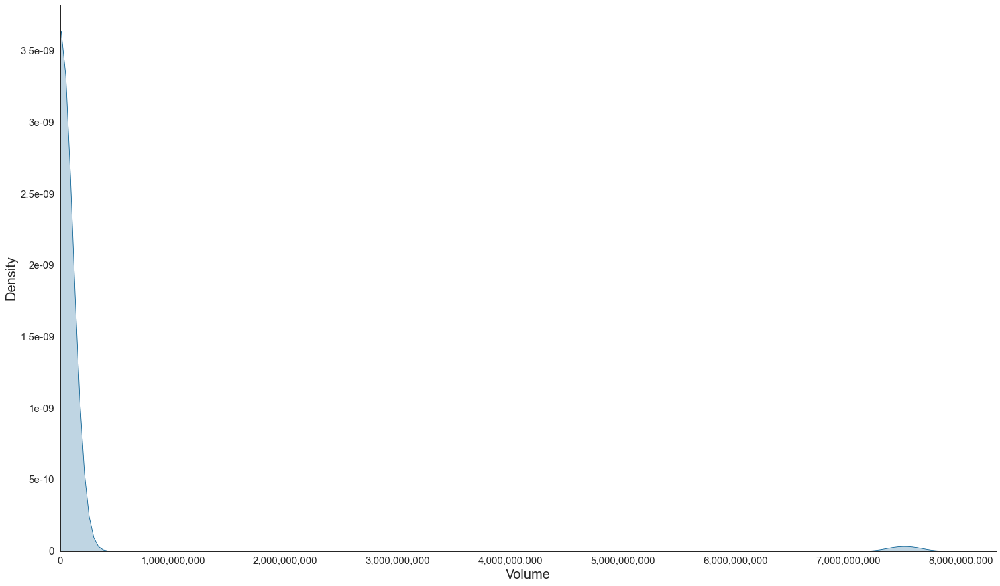

In [36]:
# Plot the distribution of volume

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))

#create the kdeplot and set the font
j= sns.kdeplot(df1['volume_firm'], shade = True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' Volume', fontsize = 25, pad = 17)
ax.set_xlabel('Volume', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)

ax.set_xlim(left=0)

j.set_yticklabels(labels=[0, 0.0000000005, 0.0000000010, 0.0000000015, 0.0000000020, 
                          0.0000000025, 0.0000000030, 0.0000000035], size = 15)
j.set_xticklabels(labels=['0', '1,000,000,000', '2,000,000,000', '3,000,000,000', '4,000,000,000',
                          '5,000,000,000', '6,000,000,000', '7,000,000,000', '8,000,000,000'], size = 15)
# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Volume_zero.png', dmi=1200)

sns.despine()

As depicted above, the volume of the groups tend to be highly skewed with the majority being centered around the 0 mark. Consequentially, it is important to apply an appropriate transformation to normalize the data <br> <br>

**Volume** (i.e. the volume of the representatives)

In [37]:
print('Currently the volume of the representatives has a skewness measurement of ' + str(df1['volume'].skew()))

Currently the volume of the representatives has a skewness measurement of 72.52225198146505


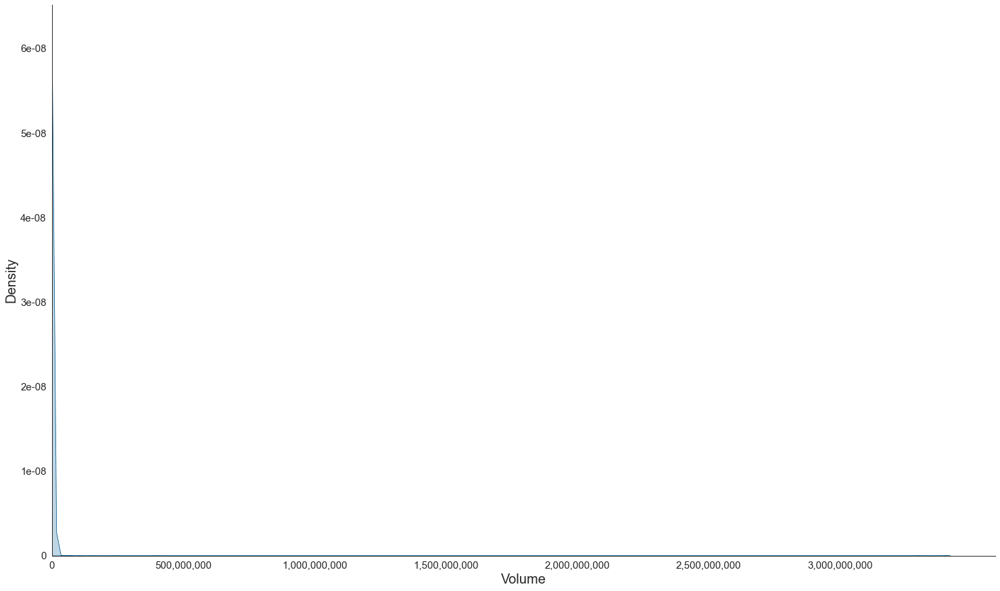

In [38]:
# Plot the distribution of Volume 

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['volume'], shade = True,  color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Firm-Level Volume', fontsize = 25, pad = 17)
ax.set_xlabel('Volume', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)
j.set_yticklabels(labels=[0, 0.00000001, 0.00000002, 0.00000003, 0.00000004, 
                          0.00000005, 0.00000006, 0.00000007], size = 15)
j.set_xticklabels(labels=['0', '500,000,000', '1,000,000,000', '1,500,000,000', '2,000,000,000',
                          '2,500,000,000', '3,000,000,000'], size = 15)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

Naturally, the representatives' volume also tends to be highly skewed and thus will require future transformations. <br> <br>

**Liabilities_Firm**

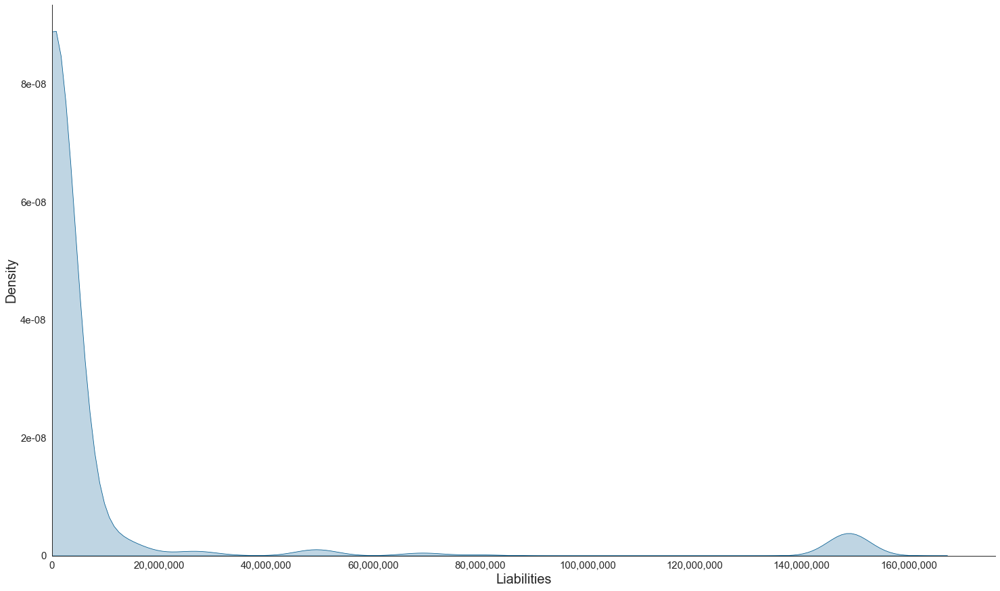

In [39]:
# Plot the distribution of Liabilities

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j=sns.kdeplot(df1['liabilities_firm'],  shade= True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' Liabilities', fontsize = 30, pad = 17)
ax.set_xlabel('Liabilities', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)
j.set_yticklabels(labels=[0, 0.00000002, 0.00000004, 0.00000006, 0.00000008, 
                          0.00000009], size = 15)
j.set_xticklabels(labels=['0', '20,000,000', '40,000,000', '60,000,000', '80,000,000',
                          '100,000,000', '120,000,000', '140,000,000', '160,000,000'], size = 15)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Liability_zero.png', dmi=1200)

sns.despine()

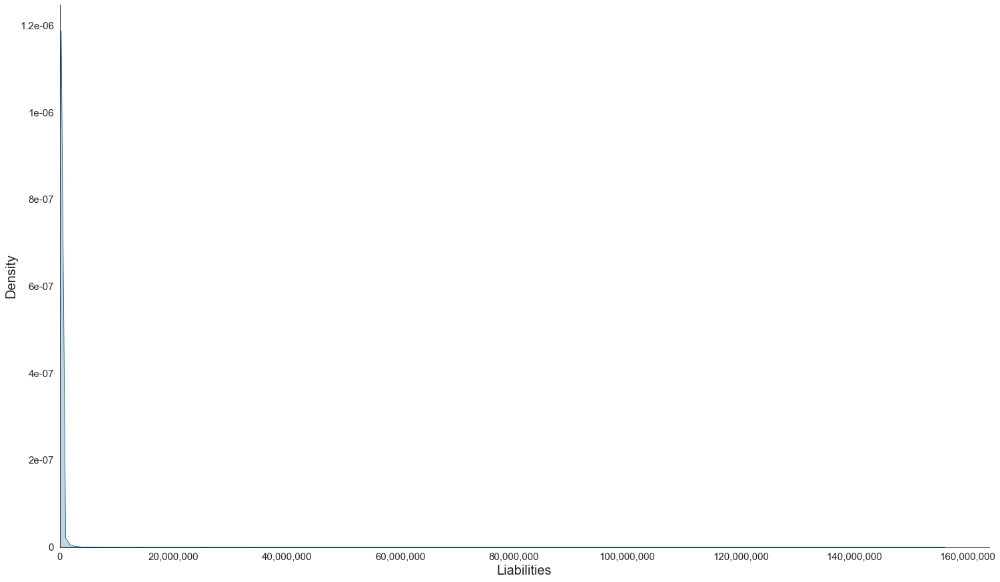

In [40]:
# Plot the distribution of Rep. Liabilities

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['liabilities'], shade = True,  color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Firm-Level Liability', fontsize = 25, pad = 17)
ax.set_xlabel('Liabilities', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)


j.set_yticklabels(labels=[0, 0.0000002, 0.0000004, 0.0000006, 0.0000008, 
                          0.0000010, 0.0000012, 0.0000014], size = 15)
j.set_xticklabels(labels=['0', '20,000,000', '40,000,000', '60,000,000', '80,000,000',
                          '100,000,000', '120,000,000', '140,000,000', '160,000,000'], size = 15)


# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

As with volume, liabilities are also rather skwewed. Naturally, the group distribution is less skewed than that of the representatives, nonetheless, both features cannot be utilised as-is. <br> <br>

**PL_Firm**

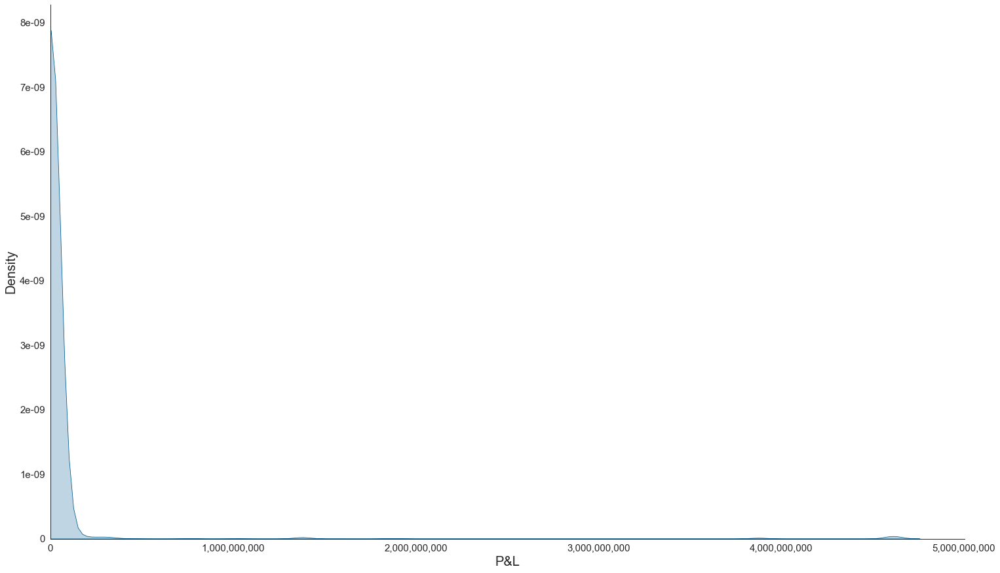

In [41]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['pl_firm'], shade=True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' P&L', fontsize = 30, pad = 17)
ax.set_xlabel('P&L', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)
j.set_yticklabels(labels=[0, 0.000000001, 0.000000002, 0.000000003, 0.000000004, 
                          0.000000005, 0.000000006, 0.000000007, 0.000000008], size = 15)
j.set_xticklabels(labels=['0', '1,000,000,000', '2,000,000,000', '3,000,000,000', 
                          '4,000,000,000', '5,000,000,000'], size = 15)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

plt.savefig('PL_zero.png', dmi=1200)

sns.despine()


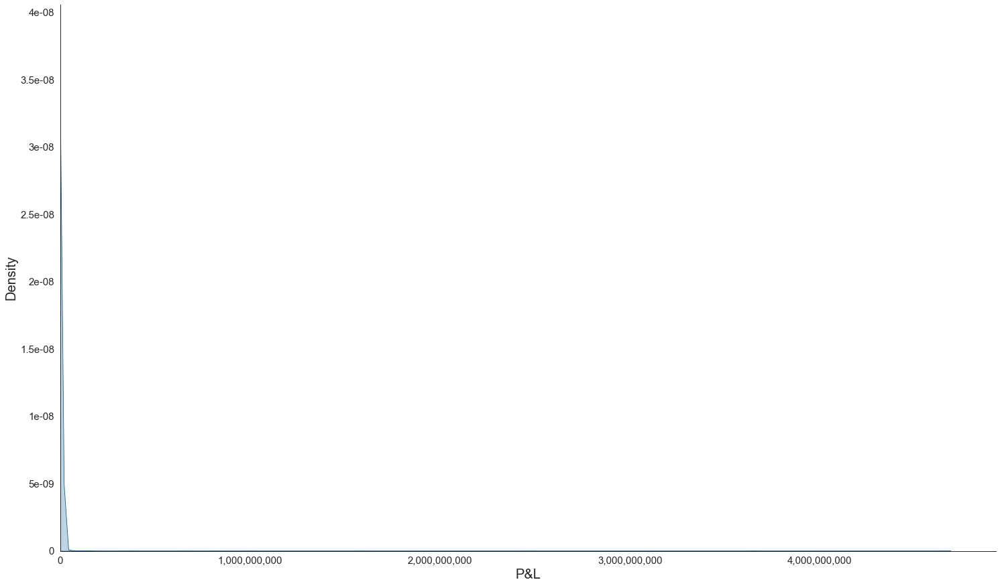

In [42]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['pl'], shade = True,  color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Firm-Level Liability', fontsize = 25, pad = 17)
ax.set_xlabel('P&L', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)

j.set_yticklabels(labels=[0, 0.000000005, 0.000000010, 0.000000015, 0.000000020, 
                          0.000000025, 0.000000030, 0.000000035, 0.000000040], size = 15)
j.set_xticklabels(labels=['0', '1,000,000,000', '2,000,000,000', '3,000,000,000', '4,000,000,000',], size = 15)



# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

Even the last two features (i.e. PL and group PL) are highly skewed and require normalisation. <br> <br>

<br>
The following finanial feature is volume_network.

In [43]:
# check the number of observations for which the volume of the group is greater than 0

df1[df1['volume_network']>0]

,id,client_type,post,representatives,legal,work_field,work_name,customer_relation,customer_relation_months,consultant,branch,marisk,bvr,vr,risk_group,revenue,volume_firm,volume,volume_network,loans_approved,loans_utilized,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,active_cc,passive_cc,commission_income,cmib,disruption,products,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank
61,E000002969,1) Business Customers,44143.0,2,2,45441,F - Construction,435,4) > 20 Jahre,82701,27,2,10121.0,2a,10,NaN,25661.36,25661.36,3661.36,22000.00,2084.53,5046.78,5031.56,3188.77,1842.79,58833.35,58833.35,446.37,3.94,760.02,1210.33,0.00,5,2,3,1,1,0,0,1,0,0,0,0,0,0,1,0,0,0
641,E000006869,1) Business Customers,44289.0,2,2,29100,C - Manufacturing,395,4) > 20 Jahre,80101,1,2,10231.0,2e,10,NaN,8045.25,8045.25,3045.25,5000.00,1747.07,501.48,12.22,12.22,0.00,45841.87,41088.05,1132.49,0.04,47.40,311.28,0.00,5,4,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,1
699,E000007403,1) Business Customers,44534.0,2,2,85100,Q - Human health and social work activities,115,2) 06 bis 10 Jahre,81860,18,2,10226.0,1e,10,NaN,270.62,270.62,270.62,0.00,38.80,48.96,48.96,0.00,48.96,2402.99,2402.99,0.06,0.72,47.40,48.18,0.00,3,1,2,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
823,E000009334,1) Business Customers,44269.0,2,2,36300,C - Manufacturing,175,3) 11 bis 20 Jahre,80101,1,2,10436.0,2c,10,NaN,3220.27,3220.27,3220.27,0.00,0.00,17997.85,318.64,318.64,0.00,97179.00,30621.03,1.36,2.34,95.40,99.10,0.00,2,1,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
928,E000010272,1) Business Customers,50259.0,2,211,92620,T - Households,467,4) > 20 Jahre,85406,54,2,10115.0,1a,10,NaN,13032.72,13032.72,2265.41,10767.31,1267.61,27870.98,27870.98,5354.46,22516.52,53602.77,53602.77,110.48,10.57,47.40,168.45,0.00,9,5,4,1,1,1,1,1,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31091,E10004,5) Freelancers,59069.0,0,1,67100,K.66 - Activities auxiliary to financial servi...,384,4) > 20 Jahre,81903,19,2,10226.0,2a,10,NaN,114408.58,114408.58,106408.58,8000.00,1346.14,277042.22,277042.22,42320.79,234721.43,334664.15,334664.15,20.97,43.31,831.37,895.65,0.00,33,7,26,1,1,0,0,1,1,1,0,0,0,1,0,1,0,0
31119,E10032,5) Freelancers,22769.0,0,1,92315,"R - Arts, entertainment and recreation",225,3) 11 bis 20 Jahre,88460,84,2,10436.0,2c,10,NaN,108.00,108.00,8.00,100.00,0.00,534.57,534.57,534.57,0.00,28792.85,28792.85,3.67,3.86,98.40,105.93,0.00,2,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
31455,E10368,5) Freelancers,44139.0,0,1,52310,G - Wholesale and retail trade; repair of moto...,124,3) 11 bis 20 Jahre,83001,30,2,20442.0,3c,20,2125000.0,199456.84,199456.84,27638.17,171818.67,162789.99,10398.03,10398.03,549.29,9848.74,2125000.00,1697386.15,6717.74,4.83,756.25,7486.26,11.77,11,7,4,1,1,1,1,0,0,0,0,0,0,1,1,0,0,0
31824,E10737,5) Freelancers,44135.0,0,1,74871,N - Administrative and support service activities,48,1) <= 5 Jahre,82034,20,2,10436.0,2d,10,NaN,28617.97,28617.97,28617.97,0.00,0.00,466.49,466.49,466.49,0.00,85454.20,85454.20,2.76,10.80,47.40,60.96,0.00,4,3,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1


<br>
Given that only 1% of the values are non-zero, the feature can be excluded. As a result the Notebook will now focus on the assessment of more qualitative features to detrmine their resepctive distributions.
<br>

##  Customer Relation <a class="anchor" id="11"></a>

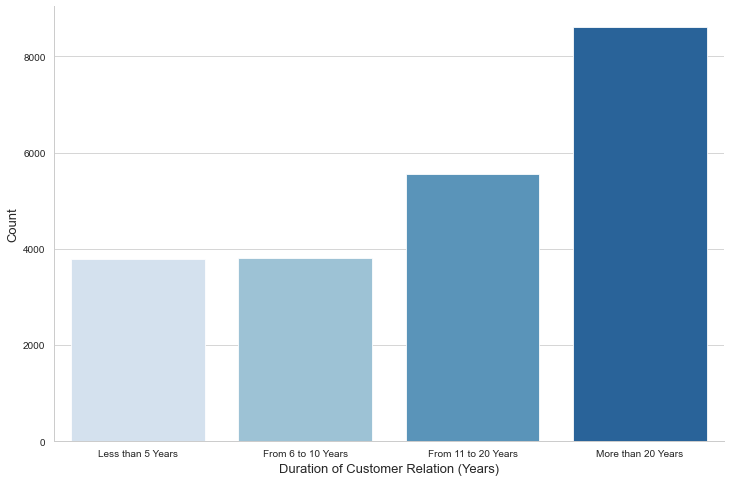

In [44]:
# we tranform the data into a category type to allow for graphing

df1['customer_relation_months']= df1['customer_relation_months'].astype('category')

# set the order for future visualisations
df1['customer_relation_months'].cat.reorder_categories(['1) <= 5 Jahre','2) 06 bis 10 Jahre',
                                                 '3) 11 bis 20 Jahre', '4) > 20 Jahre'], inplace=True)

# Plot the distribution 

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Blues")

fig, ax = plt.subplots(figsize=(12,8))

# Develop the Count Plot 

j = sns.countplot(data=df1, x='customer_relation_months', ax = ax, palette= 'Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Customer Relation (Years)', fontsize = 30, pad = 17)
ax.set_xlabel('Duration of Customer Relation (Years)', fontsize = 13)
ax.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0, 2000, 4000, 6000, 8000], size = 10)
j.set_xticklabels(labels=['Less than 5 Years', 'From 6 to 10 Years',
                          'From 11 to 20 Years', 'More than 20 Years'], size = 10)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Customer.png', dmi=1200)

sns.despine()

When it comes to Customer Relation, the latter group appears to be the most densely populated with a disproportionate density compared to the others. This feature is a grouping of the numerical feature customer relationhsip. As a consequence, a potential redistribution of the bins might allow a more equally distributed feature. If the feature is left in its current state, this might impact the clustering, insofar the algoritm might assume that there is little difference between the observations.  <br>

##  Risk Measurements <a class="anchor" id="12"></a>

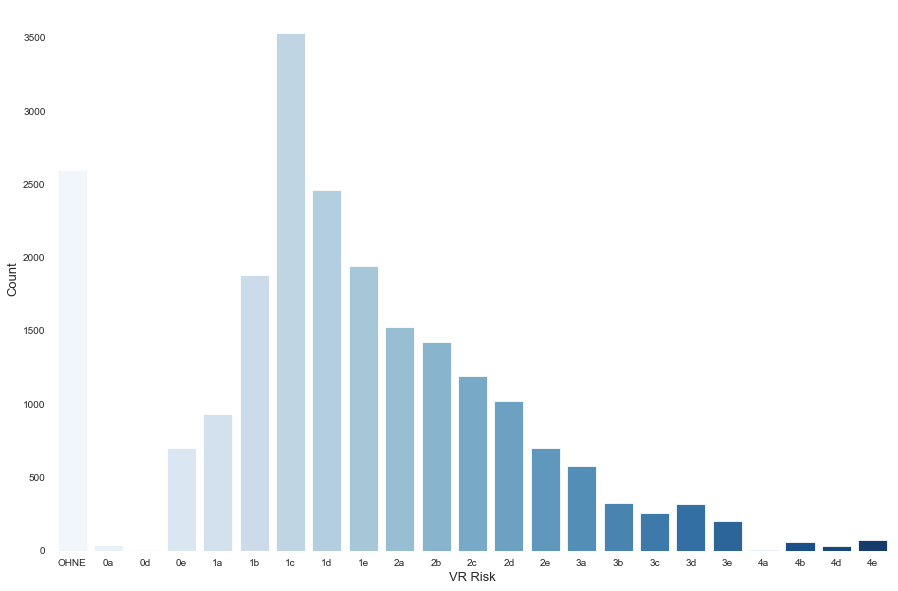

In [45]:
# we categorise the feature vr

df1['vr']= df1['vr'].astype('category')

# set the order for future visualisations

df1['vr'].cat.reorder_categories([' OHNE','0a','0d','0e','1a', '1b', '1c', '1d', '1e', '2a', '2b', '2c', 
                                         '2d', '2e','3a', '3b', '3c', '3d', '3e', '4a','4b', '4d', '4e'], inplace=True)


# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("white")

fig= plt.subplots(figsize=(15,10))

# we develop the countplot
j = sns.countplot(data=df1, x='vr', palette='Blues')

sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of VR Risk', fontsize = 30, pad = 17)
j.set_xlabel('VR Risk', fontsize = 13)
j.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0,500,1000,1500,2000,2500,3000,3500], size=10)
j.set_xticklabels(labels=['OHNE','0a','0d','0e','1a', '1b', '1c', '1d', '1e', '2a', '2b', '2c',
                          '2d', '2e','3a', '3b', '3c', '3d', '3e', '4a','4b', '4d', '4e'], size = 10)

sns.despine(bottom = True, left = True)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('VR.png', dmi=1200)


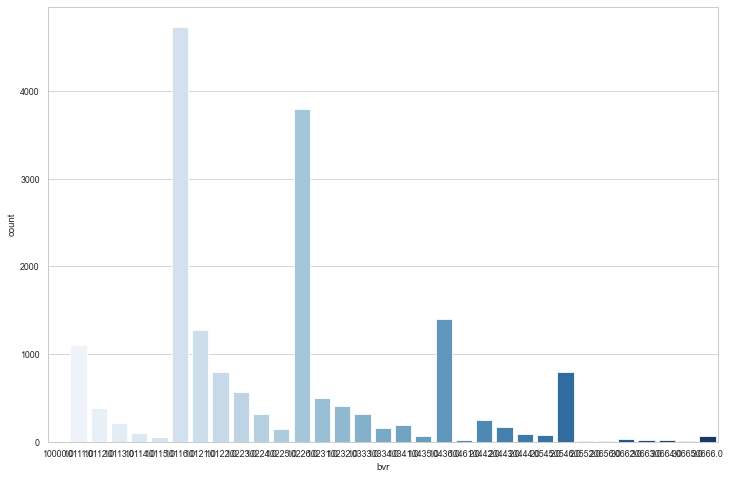

In [46]:
# Plot the distribution of BVR-Risk

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("BrBG_r")

# specify the size
plt.subplots(figsize=(12,8))

# develop the count plot
sns.countplot(data=df1, x='bvr', palette='Blues')

sns.set(font_scale = 1)

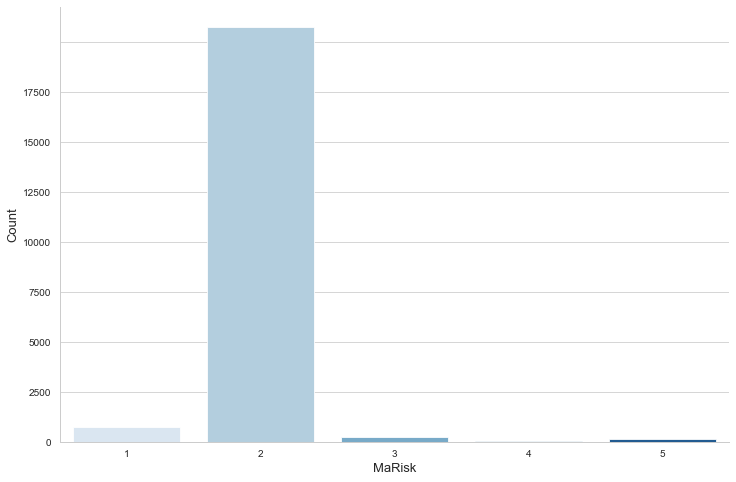

In [47]:
# Plot the distribution of MaRisk

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Blues")

fig, ax = plt.subplots(figsize=(12,8))

# develop the countplot
j = sns.countplot(data=df1, x='marisk', ax=ax, palette= 'Blues')

sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of MaRisk', fontsize = 30, pad = 17)
ax.set_xlabel('MaRisk', fontsize = 13)
ax.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0, 2500, 5000, 7500, 10000, 12500, 15000, 17500], size = 10)
j.set_xticklabels(labels=[1,2,3,4,5], size = 10)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Marisk.png', dmi=1200)

sns.despine()

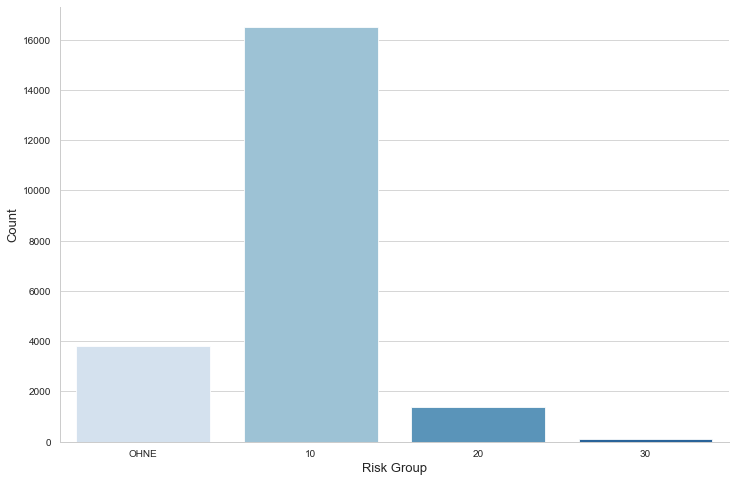

In [48]:
# we transform risk group into a category 

df1['risk_group']= df1['risk_group'].astype('category')

# set the order for future visualisations

df1['risk_group'].cat.reorder_categories([' OHNE','10','20','30'], inplace=True)


# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Blues")

fig, ax = plt.subplots(figsize=(12,8))

# develop the countplot
j = sns.countplot(data=df1, x='risk_group', ax=ax, palette= 'Blues')

sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Risk Group', fontsize = 30, pad = 17)
ax.set_xlabel('Risk Group', fontsize = 13)
ax.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0, 2000, 4000, 6000, 8000, 10000, 12000, 14000, 16000], size = 10)
j.set_xticklabels(labels=['OHNE','10','20','30'], size = 10)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Risk_group.png', dmi=1200)

sns.despine()

The risk measurements all suffer from the same issue. The features are not equally distributed. Moreover, it is noticeable that VR risk captures the best distribution and its bins can be redesigned.

## Corporate Clients <a class="anchor" id="13"></a>

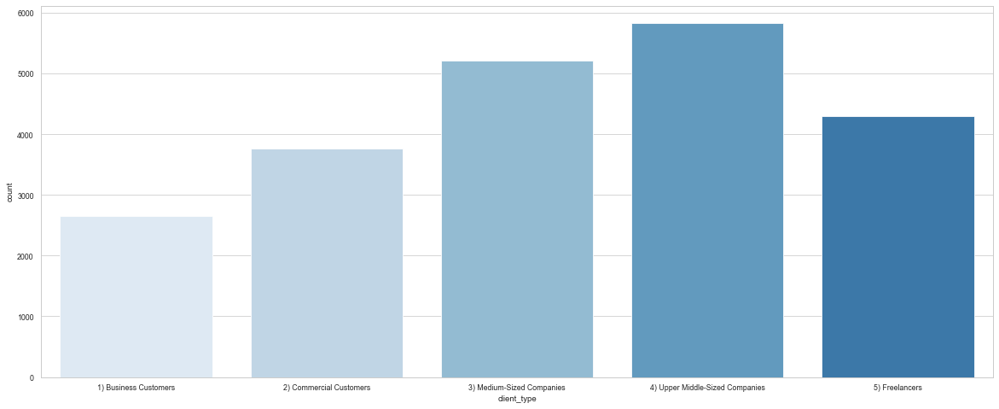

In [49]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Blues")

plt.subplots(figsize=(20,8))

#develop the countplot
sns.countplot(data=df1, x='client_type')


sns.set(font_scale = 1)

The corporate clients have a relatively equal distribution of observations, unlike risk and cutomer relationship <br>

## Products <a class="anchor" id="products"></a>

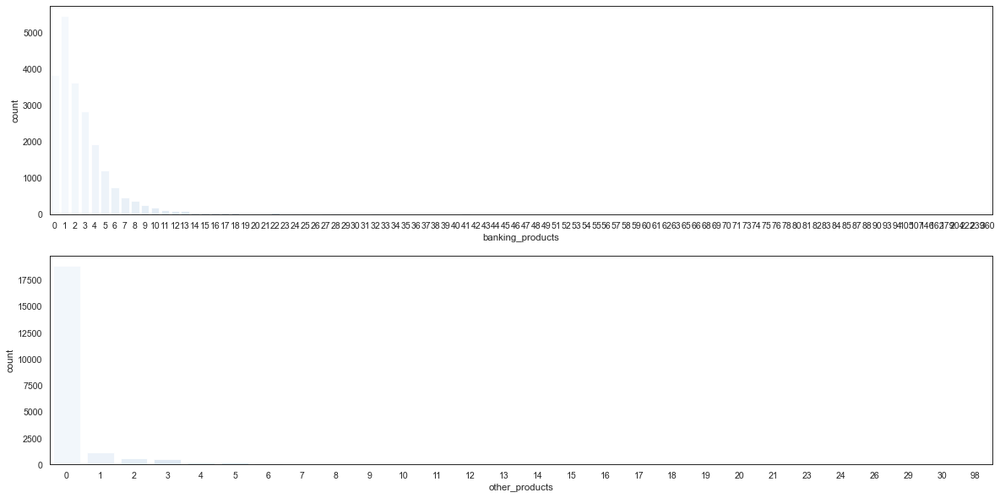

In [50]:
# select the features for products

colu = ['banking_products', 'other_products']

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

plt.figure(figsize=(20,10))

# plot a subplot for each column to visualise the counts per features

for i, col in enumerate(colu):
    ax = plt.subplot(2,1, i+1)
    sns.countplot((df1[col]), palette='Blues', ax = ax)
plt.show()

The adoption of products is also highly skewed, both for banking products and non banking products. Potential outliers in the volume plots might be adopting a disproportionate amount of products compares to their peers. <br>

## Work Field <a class="anchor" id="work"></a>

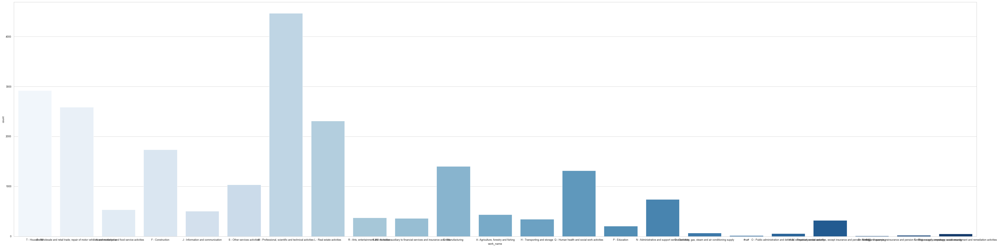

In [51]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("BrBG_r")

plt.subplots(figsize=(60,15))

#develop the countplot
sns.countplot(data=df1, x='work_name', palette='Blues')


sns.set(font_scale = 1)

Most firms tend to operate in the scientific field. Other high results are represented by trade, real estate and housing. <br>

Summary of the Distributions:<br>
    - Active Volume Firm and Representatives: <br>
    - Both volumes follow a similiar distribution<br>
    - Both are right skewed <br>
    - Firms have less concentration of zeros and higher max values<br><br>
    - Liability Firm and Representatives:<br>
    - Liabilities have same quantity and level of max numbers at Firm and Reps level<br>
    - Both are right skewed <br>
    - Representatives have a higher concentration of zeros <br><br>
    - P&L Firm and Representatives:<br>
    - P&L at the Firm level has a vastly greater range of values <br>
    - P&L concentration of zero values is rather similiar <br>
    - Both are right skewed <br><br>
    - Products: <br>
    - There is a skewed distirbution in product adoption. Most firms use few products.<br><br>
    - Work Field:<br>
    - Most firms operate in the scientific, trade and real estate fields <br><br>
    
<br>
<br>


## Save Dataset

In [52]:
#df1.to_csv('visual_df.csv')

## Data Transformation

Following the development of the EDA, the Notebook can now focus on pre-processing the data to ensure its fitness for later modelling application. As specified before, the first issue which requires tackling is the presence of NaN.

### Contribution Margin <a class="anchor" id="10"></a>

The following features need addressing: <br>
-**Active CC** <br>
-**Passive CC** <br>
-**Commission Income** <br>
-**CMIB** <br>

When assessing the dataset it is noticeable that the features are related. Specifically, CMIB is composed as follows : <br>
CMIB = active_cc + passive_cc + commission_income

In [53]:
# subset to cmib features to depict their relation

df1[['cmib', 'commission_income', 'passive_cc', 'active_cc']]

,cmib,commission_income,passive_cc,active_cc
2,236.61,46.60,12.30,177.71
3,NaN,NaN,NaN,NaN
4,868.23,437.13,30.32,400.78
5,36.37,31.60,0.66,4.11
6,77.82,68.40,0.82,8.60
...,...,...,...,...
32108,219.05,56.38,NaN,162.67
32114,514.69,274.45,56.86,183.38
32115,180.31,154.15,25.68,0.48
32116,412.34,135.79,276.55,0.00


The dataframe above corroborates what initially hypothesised. Therefore, the application of a function which fills the NaN with their correct values can be applied to solve the initially posed problem <br>

In [54]:
# select the subset of data that we can work with

df1 = df1[(~df1['active_cc'].isna()) | (~df1['passive_cc'].isna()) | (~df1['commission_income'].isna()) | (~df1['cmib'].isna())]

In [55]:
# fill the missing values for active_cc

df1['new_active_cc'] = df1.apply(
    lambda row: row['cmib'] - (row['commission_income'] +  row['passive_cc']) if np.isnan(row['active_cc']) else row['active_cc'],
    axis=1
)

# fill the missing values for passive_cc

df1['new_passive_cc'] = df1.apply(
    lambda row: row['cmib'] - (row['commission_income'] +  row['active_cc']) if np.isnan(row['passive_cc']) else row['passive_cc'],
    axis=1
)

# fill the missing values for commission_income

df1['new_commission_income'] = df1.apply(
    lambda row: row['cmib'] - (row['passive_cc'] +  row['active_cc']) if np.isnan(row['commission_income']) else row['commission_income'],
    axis=1
)


# fill the missing values for cmib

df1['new_cmib'] = df1.apply(
    lambda row: row['commission_income'] + row['passive_cc'] +  row['active_cc'] if np.isnan(row['cmib']) else row['cmib'],
    axis=1
)

In [56]:
# observe the values that are still 0 and create a df to see whether all cmib values are equal to commission_income

x = df1[(df1['new_active_cc'].isna()) | (df1['new_passive_cc'].isna()) | (df1['new_commission_income'].isna()) | (df1['new_cmib'].isna())]

In [57]:
# since the values are the sane we can replace all orignal NaNs with zero

x[x['new_cmib'] == x['new_commission_income']]

,id,client_type,post,representatives,legal,work_field,work_name,customer_relation,customer_relation_months,consultant,branch,marisk,bvr,vr,risk_group,revenue,volume_firm,volume,volume_network,loans_approved,loans_utilized,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,active_cc,passive_cc,commission_income,cmib,disruption,products,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,new_active_cc,new_passive_cc,new_commission_income,new_cmib
251,E000004366,1) Business Customers,59439.0,4,2,52491,G - Wholesale and retail trade; repair of moto...,203,3) 11 bis 20 Jahre,26012,998,5,30666.0,4e,30,NaN,4916.40,1600.0,0.0,1600.0,0.0,2831.39,0.00,0.00,0.00,10181.16,NaN,NaN,NaN,0.00,0.00,0.0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,0.00,0.00
261,E000004418,1) Business Customers,58640.0,2,2,92610,"R - Arts, entertainment and recreation",201,3) 11 bis 20 Jahre,86335,63,2,NaN,OHNE,OHNE,NaN,2500.00,0.0,0.0,0.0,0.0,14251.11,8786.52,0.00,8786.52,2236.67,NaN,NaN,NaN,24.27,24.27,0.0,2,0,2,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,NaN,NaN,24.27,24.27
304,E000004660,1) Business Customers,44141.0,2,2,55300,I - Accommodation and food service activities,165,3) 11 bis 20 Jahre,26008,998,5,30666.0,4b,30,NaN,1995.00,1995.0,0.0,1995.0,0.0,1171.77,0.00,0.00,0.00,21590.50,NaN,NaN,NaN,39.92,39.92,0.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,39.92,39.92
447,E000005294,1) Business Customers,59757.0,4,2,50303,G - Wholesale and retail trade; repair of moto...,297,4) > 20 Jahre,80101,1,2,NaN,OHNE,OHNE,NaN,1789.52,0.0,0.0,0.0,0.0,16254.50,1958.69,0.00,1958.69,73691.11,NaN,NaN,NaN,2.87,2.87,0.0,3,0,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,NaN,NaN,2.87,2.87
729,E000007746,1) Business Customers,58640.0,2,2,92610,"R - Arts, entertainment and recreation",201,3) 11 bis 20 Jahre,86335,63,2,NaN,OHNE,OHNE,NaN,2600.00,0.0,0.0,0.0,0.0,29823.66,8786.52,0.00,8786.52,172004.66,NaN,NaN,NaN,24.27,24.27,0.0,2,0,2,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,NaN,NaN,24.27,24.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29159,E000083538,5) Freelancers,59069.0,2,1,67202,K.66 - Activities auxiliary to financial servi...,281,4) > 20 Jahre,87502,75,2,NaN,2c,OHNE,NaN,31672.50,29872.5,29872.5,0.0,0.0,9057.24,4252.42,0.00,4252.42,22539.26,NaN,NaN,NaN,0.00,0.00,0.0,2,0,2,1,1,0,0,1,0,0,0,0,0,0,1,0,0,0,NaN,NaN,0.00,0.00
29413,E000093611,5) Freelancers,59427.0,3,1,74123,"M - Professional, scientific and technical act...",111,2) 06 bis 10 Jahre,86202,62,2,NaN,OHNE,OHNE,NaN,178551.15,0.0,0.0,0.0,0.0,257108.67,174917.25,174917.25,0.00,54285.35,NaN,NaN,NaN,211.81,211.81,0.0,1,1,0,1,1,0,1,0,1,0,0,0,0,1,1,0,0,0,NaN,NaN,211.81,211.81
29553,E000095327,5) Freelancers,59427.0,5,1,74123,"M - Professional, scientific and technical act...",111,2) 06 bis 10 Jahre,86202,62,2,NaN,OHNE,OHNE,NaN,303047.28,0.0,0.0,0.0,0.0,335034.79,174917.25,174917.25,0.00,202910.70,NaN,NaN,NaN,211.81,211.81,0.0,1,1,0,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,NaN,NaN,211.81,211.81
29554,E000095341,5) Freelancers,59425.0,3,1,93053,S - Other services activities,408,4) > 20 Jahre,85105,51,2,10116.0,1b,10,NaN,11000.00,0.0,0.0,0.0,0.0,328266.42,0.00,0.00,0.00,325853.57,80516.82,NaN,NaN,0.00,0.00,0.0,0,0,0,1,1,1,0,1,1,1,0,0,0,1,0,0,0,0,NaN,NaN,0.00,0.00


In [58]:
# change the values

df1['new_active_cc'].fillna(0, inplace =True)

df1['new_passive_cc'].fillna(0, inplace =True)

In [59]:
# now we can select the new features and create a new dataframe

df1 = df1.drop(columns = ['active_cc','passive_cc','commission_income','cmib'])

In [60]:
# reset the index and further drop the previous index column

df1.reset_index(inplace=True)
df1.drop(columns = ['index'], inplace =True)

Since the features are now correctly transformed, they can be plotted to determine their distirbutions.

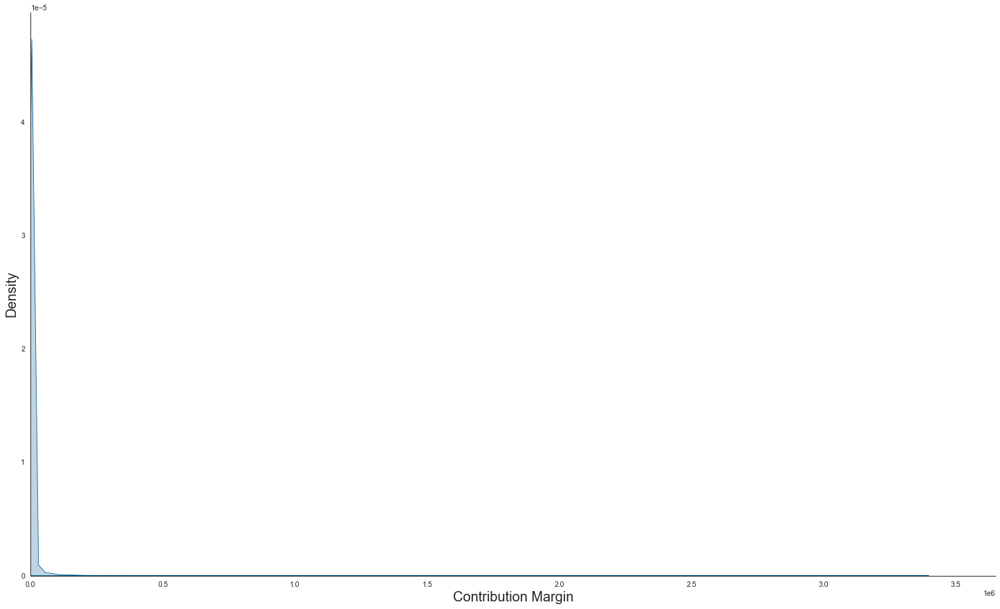

In [61]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['new_cmib'], shade=True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' P&L', fontsize = 30, pad = 17)
ax.set_xlabel('Contribution Margin', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()


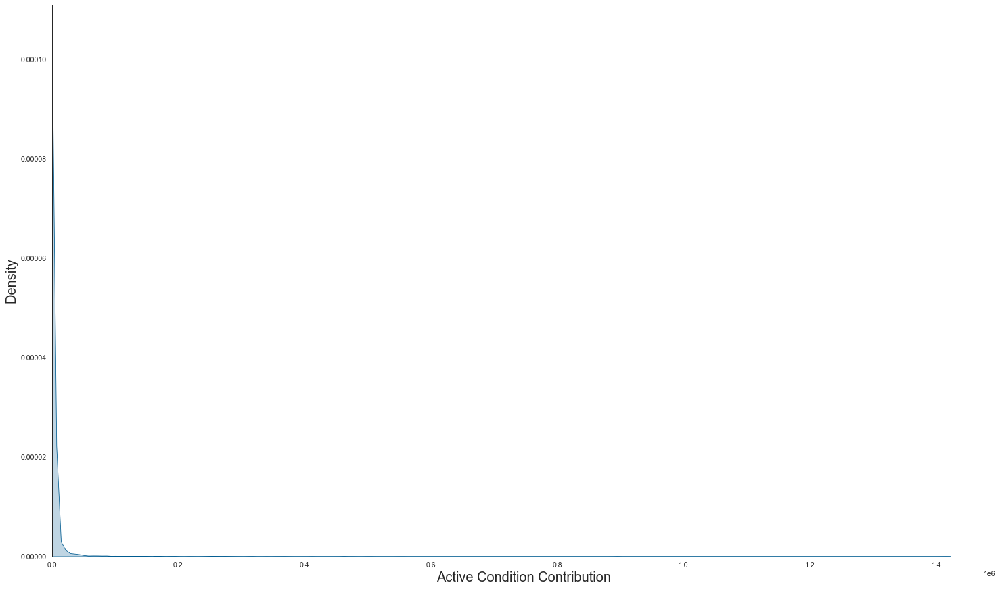

In [62]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['new_active_cc'], shade=True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' P&L', fontsize = 30, pad = 17)
ax.set_xlabel('Active Condition Contribution', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()


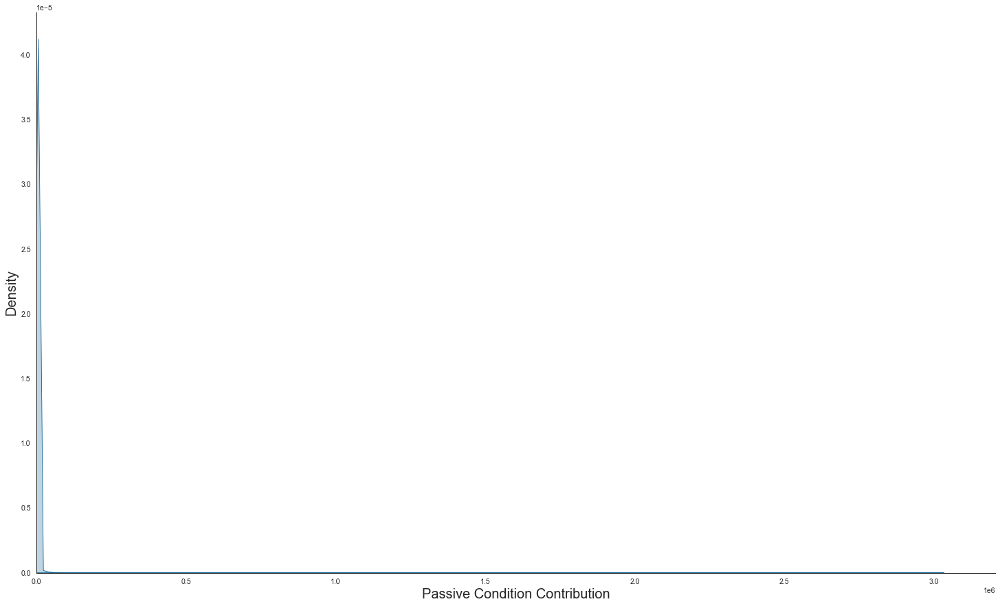

In [63]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['new_passive_cc'], shade=True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' P&L', fontsize = 30, pad = 17)
ax.set_xlabel('Passive Condition Contribution', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()


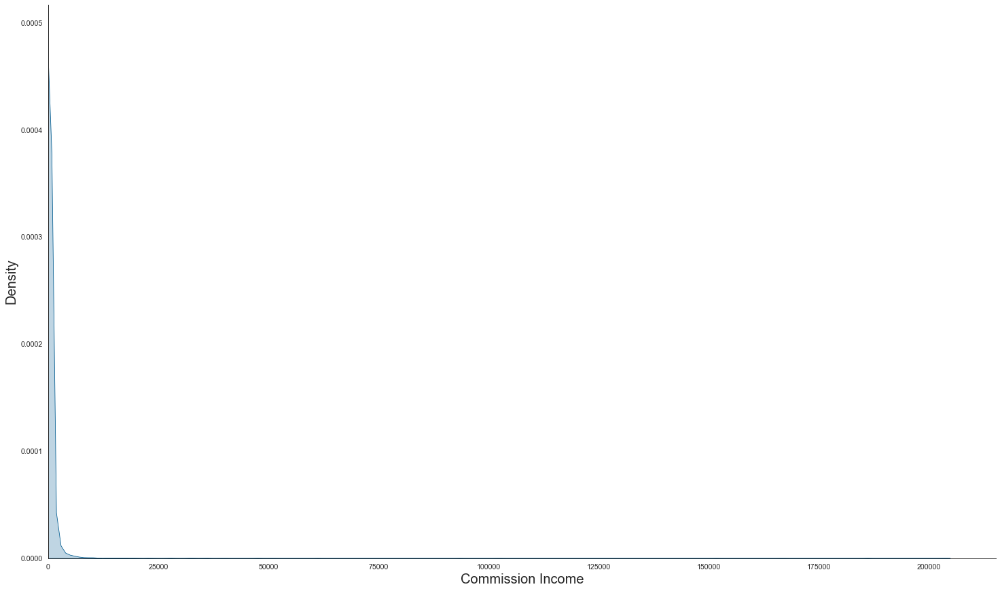

In [64]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

# set the size of the plot
fig, ax = plt.subplots(figsize=(25,15))


#create the kdeplot and set the font
j= sns.kdeplot(df1['new_commission_income'], shade=True, color='#005b90', ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of the Groups\' P&L', fontsize = 30, pad = 17)
ax.set_xlabel('Commission Income', fontsize = 20)
ax.set_ylabel('Density', fontsize = 20)
ax.set_xlim(left=0)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()


Similiar to the other financial features, they portray Ward distirbutions.

##  Other Needed Changes  <a class="anchor" id="16"></a>

<br> <br>
Based on the results of the prior EDA, the following issues need addressing: <br><br>
     - **delete id**: it is no longer needed for the purpose of the research <br>
     - **delete consultant**: keeping such a feature would create bias within the research given that consultants are the Relationship Managers currently assigned to the clients <br>
     - **delete revenue**: the features does have enough information and it cannot be scraped <br> 
     - **select needed features and delete duplicates**: (work_field & work_name), (customer_relation & customer_relation_months), (marisk, bvr, vr, risk_group) all need to be addressed <br>
     - **alter variables**: post & work. These features can either be scraped or sliced <br>
     - **change variables to integers**: client_type, work_name, customer_relation_months, vr, risk & group. These features can be changed to integers merely for making the data easier to transform and use at later stages <br>
     <br> <br>
Once these factors will be addressed the following issues can be tackled:
     - **encode the variables**: mall numeric categories should be correctly encoded <br>
     - **address skewness**: A potential solution might be that of creating two different dataframes. One with only zero values and another with non zero values<br> <br>
     
Once the skewness is tackled, the following steps will be to: <br><br>
    - **transform the variables**: transform both financial and non-financial features to ensure normalisation and standardisation <br>
    <br> <br>

## Feature Deletion

As a result of step one, the unnecessary features shall be deleted.

In [65]:
# foremost we can drop the following features

df1.drop(columns= ['consultant', 'revenue'], inplace = True)

## Duplicates   <a class="anchor" id="17"></a>

Next the notebook shall tackle the issue with the duplicates.

**Work_Sector**
<br> <br>


In [66]:
# we check the two features

df1[['work_field','work_name']]

,work_field,work_name
0,85111,T - Households
1,55300,I - Accommodation and food service activities
2,85100,T - Households
3,93053,T - Households
4,0,T - Households
...,...,...
18988,85142,Q - Human health and social work activities
18989,31300,C - Manufacturing
18990,74123,"M - Professional, scientific and technical act..."
18991,74115,"M - Professional, scientific and technical act..."


First we select work field, given that is carries more information (since it is a NACE code). Subsequently we can reduce the data granulairty of the feature by slicing it. This ensures greater generalisability.

<br> 
The work fields shall be sliced at index 4, this shall provide a decent level of data specificity.
<br>

In [67]:
# we create a feature called work with part of the string

df1['work'] = df1['work_field'].astype(str).str[:4]

In [68]:
df1['work'].value_counts()

7411    1346
7020     932
9305     814
7412     666
0        549
        ... 
1753       1
1302       1
1930       1
1754       1
9252       1
Name: work, Length: 434, dtype: int64

By only selecting the first four values of the code, we create a less specific feature. Specifically, removing a value generalises the work sector. To elucidate, if 5 digits are 'realtor', 4 digits would become 'estate agent', 3 digits would become 'real estate' and so on. This is because slicing the number aggregates more observations operating in the same field. This logic was derived from the NACE rulebook.<br>

<br>

**Customer_Relation**
<br> <br>


In [69]:
# we check the features

df1[['customer_relation_months','customer_relation']]

,customer_relation_months,customer_relation
0,4) > 20 Jahre,347
1,4) > 20 Jahre,285
2,4) > 20 Jahre,274
3,1) <= 5 Jahre,60
4,4) > 20 Jahre,353
...,...,...
18988,4) > 20 Jahre,244
18989,4) > 20 Jahre,512
18990,4) > 20 Jahre,461
18991,4) > 20 Jahre,474


In [70]:
# we assess the distirbution of the features

df1['customer_relation_months'].value_counts()

4) > 20 Jahre         7892
3) 11 bis 20 Jahre    4623
2) 06 bis 10 Jahre    3276
1) <= 5 Jahre         3202
Name: customer_relation_months, dtype: int64

As priorly stated, the binned segmentation is unequally distributed (i.e. the last category, >20 Jahre was more dense then the previous three). As a result opting for the numerical feature might be a better approach to further re-bin it with more equally distributed groups.  <br>

In [71]:
# we create a variable that shows the number of years of relation
# this is based on the belief that months are not going to impact the relation and that years are more important

df1['relationship'] = round(df1['customer_relation']/12, 0)

In [72]:
# we group/ segment the variable relationship ensuring an even distribution of counts amongst the observations 

df1.loc[df1['relationship'].between(0,2, inclusive =True), 'year'] = '0-2'
df1.loc[df1['relationship'].between(3, 4, inclusive =True), 'year'] = '3-4'
df1.loc[df1['relationship'].between(5,6, inclusive =True), 'year'] = '5-6'
df1.loc[df1['relationship'].between(7,8, inclusive =True), 'year'] = '7-8'
df1.loc[df1['relationship'].between(9,10, inclusive =True), 'year'] = '9-10'
df1.loc[df1['relationship'].between(11,12, inclusive =True), 'year'] = '11-12'
df1.loc[df1['relationship'].between(13,15, inclusive =True), 'year'] = '13-15'
df1.loc[df1['relationship'].between(16,18, inclusive =True), 'year'] = '16-18'
df1.loc[df1['relationship'].between(19,21, inclusive =True), 'year'] = '19-21'
df1.loc[df1['relationship'].between(22,24, inclusive =True), 'year'] = '22-24'
df1.loc[df1['relationship'].between(25,27, inclusive =True), 'year'] = '25-27'
df1.loc[df1['relationship'].between(28,31, inclusive =True), 'year'] = '28-31'
df1.loc[df1['relationship'].between(32,35, inclusive =True), 'year'] = '32-35'
df1.loc[df1['relationship'].between(36,36, inclusive =True), 'year'] = '36'
df1.loc[df1['relationship'].between(37,80, inclusive =True), 'year'] = 'more than 37'

In [73]:
# we re-order the groups

df1['year']= df1['year'].astype('category')

# set the order for future visualisations

df1['year'].cat.reorder_categories(['0-2','3-4','5-6', '7-8', '9-10', '11-12', '13-15', '16-18', 
                                    '19-21', '22-24', '25-27', '28-31', '32-35', '36', 'more than 37'], 
                                   inplace=True)

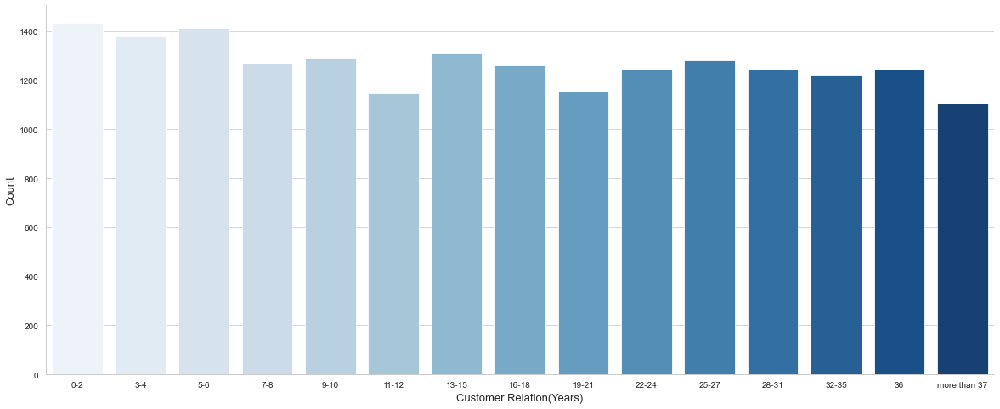

In [74]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("BrBG_r")

fig = plt.subplots(figsize=(20,8))

j = sns.countplot(data = df1, x = 'year', palette='Blues')


sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of New Customer Relation', fontsize = 30, pad = 17)
j.set_xlabel('Customer Relation(Years)', fontsize = 13)
j.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0,200,400,600,800,1000,1200,1400], size=10)
j.set_xticklabels(labels=['0-2','3-4', '5-6', '7-8', '9-10', '11-12', '13-15', '16-18', 
                          '19-21', '22-24', '25-27', '28-31', '32-35', '36', 'more than 37'], size = 10)


# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('New_customer.png', dmi=1200)

sns.despine()

As can be seen the feature is now more equally distributed amogst the bins. This application was optimal insofar the business meaning of the feature is not lost but the observations appear more diverse for the clustering algorithm

<br>

**Risk_Categories**
<br> <br>

Given that risk_group, bvr and marisk portray highly unequally distributed graphs, they can be disregarded as indicators. As a result vr can be adopted, but it would also benefit from the redistribution of its bins, just like with  relationship.

We proceed to creating a dictionary forthe feature to making grouping simpler. The dictionary shall take the following format:

OHNE: 0 <br>
0a: 1 <br>
0d: 2<br>
0e: 3<br>
1a: 4<br>
1b: 5<br>
1c: 6<br>
1d: 7<br>
1e: 8<br>
2a: 9<br>
2b: 10<br>
2c: 11<br>
2d: 12<br>
2e: 13<br>
3a: 14<br>
3b: 15<br>
3c: 16<br>
3d: 17<br>
3e: 18<br>
4b: 19<br>
4d: 20<br>
4e: 21

In [75]:
# we create a dictionary and replace the values of vr with numerical values

df1['vr'].replace({' OHNE': 0,
                   '0a': 1,
                   '0d': 2,
                   '0e': 3,
                   '1a': 4,
                   '1b': 5,
                   '1c': 6,
                   '1d': 7,
                   '1e': 8,
                   '2a': 9,
                   '2b': 10,
                   '2c': 11,
                   '2d': 12,
                   '2e': 13,
                   '3a': 14,
                   '3b': 15,
                   '3c': 16,
                   '3d': 17,
                   '3e': 18,
                   '4a': 19,
                   '4b': 20,
                   '4d': 21,
                   '4e': 22}, inplace=True)

In [76]:
# we group the vr risk levels to ensure a more even distirbution

df1.loc[df1['vr'].between(0,5, inclusive =True), 'risk'] = '0-5'
df1.loc[df1['vr'].between(6, 6, inclusive =True), 'risk'] = '6'
df1.loc[df1['vr'].between(7,8, inclusive =True), 'risk'] = '7-8'
df1.loc[df1['vr'].between(9,11, inclusive =True), 'risk'] = '9-11'
df1.loc[df1['vr'].between(12,22, inclusive =True), 'risk'] = '12-22'

In [77]:
# we re-order the groups

df1['risk']= df1['risk'].astype('category')

# we set the order for future visualisations

df1['risk'].cat.reorder_categories(['0-5','6','7-8', '9-11', '12-22'], 
                                   inplace=True)

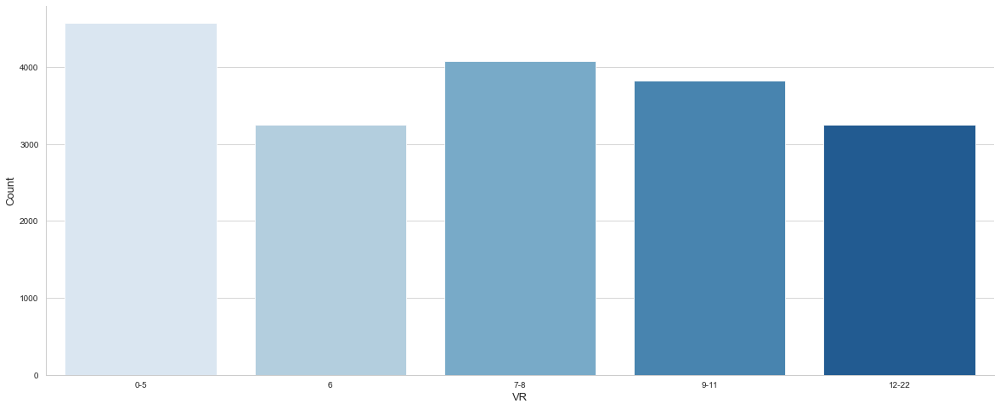

In [78]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
#sns.set_palette("Blues")

fig, ax = plt.subplots(figsize=(20,8))

# we develop a count plot
j = sns.countplot(data=df1, x='risk', ax=ax, palette='Blues')

sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of New Risk', fontsize = 30, pad = 17)
ax.set_xlabel('VR', fontsize = 13)
ax.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0, 1000, 2000, 3000, 4000, 5000, 6000], size = 10)
j.set_xticklabels(labels=['0-5','6','7-8', '9-11', '12-22'], size = 10)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('New_vr.png', dmi=1200)

sns.despine()

As can be seen, risk is now more evenly distirbuted. This allows to have the following risk levels:<br>
    - Low: 0-5<br>
    - Low-Medium: 6<br>
    - Medium: 7-8<br>
    - Medium-High: 9-11<br>
    - High: 12-22. <br> <br>
By applying such a remodelling technique, the feature maintains its original value but its observations appear more evenly distributed.

Given that risk has been newly defined, it can now be adopted to check inherent relationships with other financial features. <br><br>

In [79]:
# we select the relevant features from the dataframe

target = ['volume', 'liabilities', 'risk']
df_targets = df1[target]

# we calculate the 75th percentile to remove any outliers 

v = df1['volume'].to_list()

np.percentile(v, 75)

# we calculate the 75th percentile to remove any outliers 

l = df1['liabilities'].to_list()

np.percentile(l, 75)

# we remove the outliers from the dataframes

df_volume = df_targets[df_targets['volume'] < 100000]
df_liabilities = df_targets[df_targets['liabilities'] < 60000]

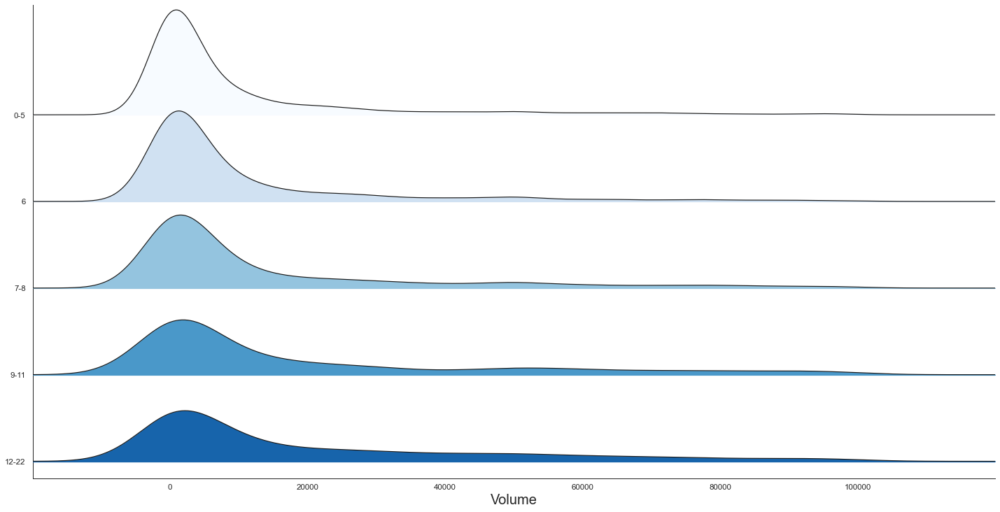

In [80]:
# we plot the distirbution of volume per risk

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot
fig, ax = plt.subplots(figsize=(20,10))

#create the distplot and set the font
j= joyplot(df_volume, by = 'risk', column = 'volume',  colormap=matplotlib.cm.Blues, ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Volume Distribution per Risk Category', fontsize = 30, pad = 17)
plt.xlabel('Volume', fontsize = 20)
plt.ylabel('Types of Risk', fontsize = 20)

ax.grid(True, alpha = 0.9)


# Adjust the distance between each subplot
#plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()

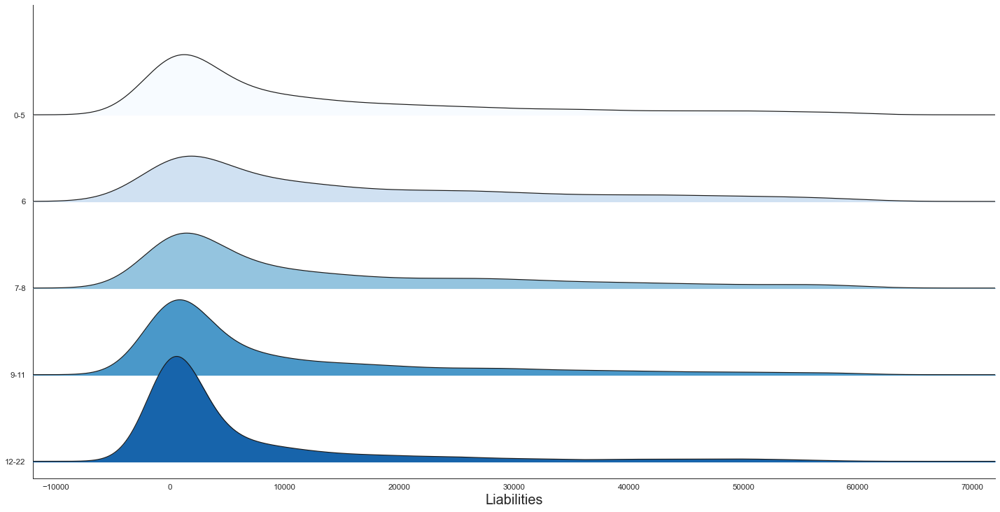

In [81]:
# we plot the distirbution of volume per risk

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot
fig, ax = plt.subplots(figsize=(20,10))

#create the distplot and set the font
j= joyplot(df_liabilities, by = 'risk', column = 'liabilities', colormap=matplotlib.cm.Blues, ax = ax)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Liability Distribution per Risk Category', fontsize = 30, pad = 17)
plt.xlabel('Liabilities', fontsize = 20)
plt.ylabel('Types of Risk', fontsize = 20)

ax.grid(True, alpha = 0.9)


# Adjust the distance between each subplot
#plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('PL_zero.png', dmi=1200)

sns.despine()

##  Other Features  <a class="anchor" id="18"></a>

<br>

**Post**
<br>
<br>
Since the feature work has already been altered, postcodes can now be dealth with. For this feature there is a requirement to alter the level of data granularity in a process akin to that of work. Initially scraping was applied, just like with the NACE codes, however, the results proved inefficient. The scraping technique adopted is available within another Notebook in the Github repository Dissertation.
<br><br>
Slicing was preferred for the same logic as with the feature work. Specifically, slicing to easily adjust specificity by reducing the number of values within the codes.<br> <br>

In [82]:
# Slicing the postcode allows to have a broader area
# Therefore by taking only 2 numbers we decide to set the specificity as something comparable to regional level

df1['postcode'] = df1['post'].astype(str).str[:2]

In [83]:
# we check the distirbution

df1['postcode'].value_counts()

44    9383
59    6147
58    2243
45     279
48     229
      ... 
19       1
84       1
95       1
37       1
73       1
Name: postcode, Length: 81, dtype: int64

<br>

**Representatives**
<br> <br>

The feature acts as a means of classifying how big a company is without using financial data. To elucidate, the more representatives a company has, the bigger its size. Consequentially this implies that a firm with more representatives also has more working capital and potentially more financially healthy. <br><br>
Once again, we can adopt an approach similiar to what adopted before on relationship and we can categorise the companies into groups rather than leaving the variable as a purely numeric feature.
<br><br>
In other words to transform this feature, the notebook shall create a new binning, as was done with the variables year and risk. 
<br> <br>

In [84]:
# check the values that the feature representatives can take

df1['representatives'].value_counts()

2      4719
0      3701
3      3638
4      1832
5       997
6       591
823     575
7       375
8       256
10      189
11      188
227     164
9       139
17      132
145     125
15      111
12      100
121      88
101      87
81       78
13       68
34       67
16       65
77       61
20       57
18       54
27       52
56       50
50       49
41       49
21       40
14       39
22       37
19       35
36       32
32       31
33       26
26       26
25       23
24       22
23       11
122       7
125       7
Name: representatives, dtype: int64

In [85]:
# we create a variable that groups the representatives ensuring an even distirbution

df1.loc[df1['representatives'].between(0,1, inclusive =True), 'size'] = '1'
df1.loc[df1['representatives'].between(2, 2, inclusive =True), 'size'] = '2'
df1.loc[df1['representatives'].between(3,3, inclusive =True), 'size'] = '3'
df1.loc[df1['representatives'].between(4,6, inclusive =True), 'size'] = '4-6'
df1.loc[df1['representatives'].between(7,900, inclusive =True), 'size'] = 'more than 7'

In [86]:
# we re-order the categories

df1['size']= df1['size'].astype('category')

# set the order for future visualisations

df1['size'].cat.reorder_categories(['1','2','3', '4-6', 'more than 7'], 
                                   inplace=True)

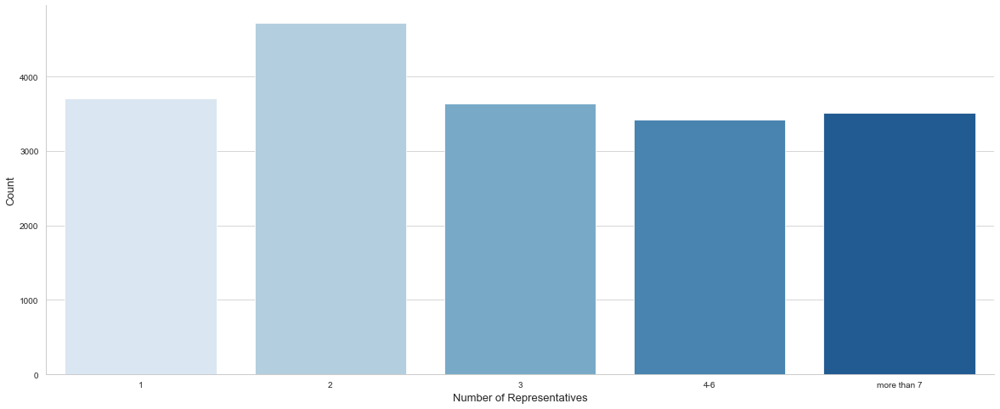

In [87]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
#sns.set_palette("Blues")

fig, ax = plt.subplots(figsize=(20,8))

# develop the countplot 

j = sns.countplot(data=df1, x='size', ax=ax, palette='Blues')

sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot
#ax.set_title('Distribution of Firm Size', fontsize = 30, pad = 17)
ax.set_xlabel('Number of Representatives', fontsize = 13)
ax.set_ylabel('Count', fontsize = 13)
j.set_yticklabels(labels=[0, 1000, 2000, 3000, 4000, 5000], size = 10)
j.set_xticklabels(labels=['1','2','3', '4-6', 'more than 7'], size = 10)

# Adjust the distance between each subplot
plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Size.png', dmi=1200)

sns.despine()


As can be seen, the new variable size efficiently segments the companies based on "how big they are". The first three groups depict relatively small companies, the fourth group (i.e. 4-6) depicts a medium sized company and the fifth group (i.e. more than 7) groups all large companies. <br> <br>

## Multiple Correspondence Analysis (MCA) <a class="anchor" id="18.998"></a>

We then develop a MCA graph. This serves the same purpose of PCA but for categorical features. Specifically, its use can identify the relationhsip between the categorical features within the dataset. <br>

In [94]:
# select all the categorical variables

other_cols = ["client_type", "work_name",  "year", "risk",  "size"]

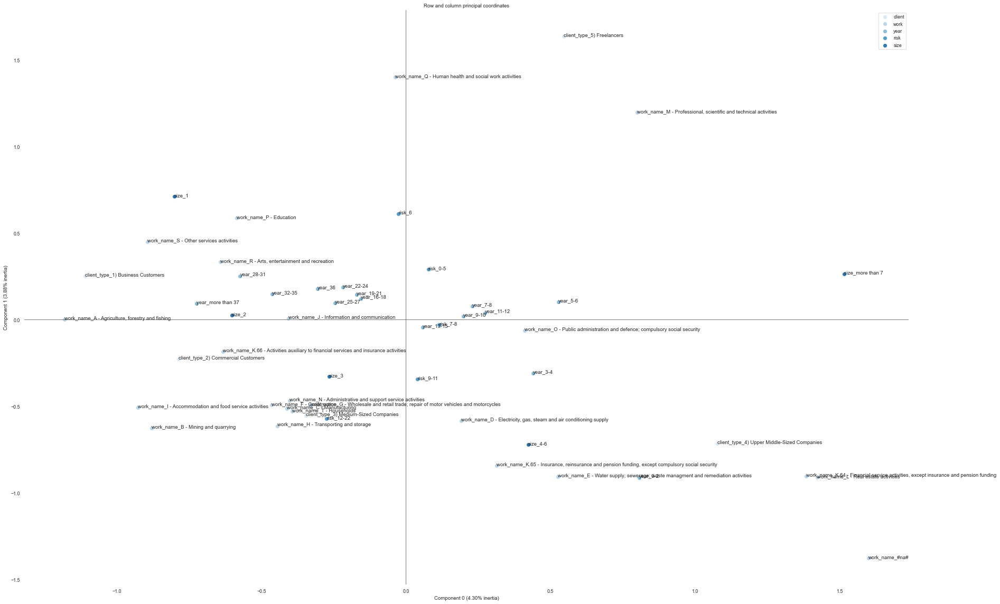

In [95]:
# plot the Multiple Correspondence Analysis

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette('Blues')


fig, ax = plt.subplots(figsize=(30,20))

# we define the MCA and its components

mc = prince.MCA(n_components=2).fit(df1[other_cols]) # we fit the MCA to the categorical columns

# we plot the MCA on a 2d graphical plane

mc.plot_coordinates(X=df1[other_cols], 
                    ax=ax,
                    show_row_points=False,
                    show_row_labels=False,
                    show_column_points=True,
                    column_points_size=40,
                    show_column_labels=True,
                   )


sns.set(font_scale = 1)

sns.despine(top=True, left=True, bottom=True)

## Categorical Transformation   <a class="anchor" id="19"></a>

Now we can adopt dictionaries to transform the values of the categorical features into numbers. This holds no other purpose than to ease the management of the data throughout the data modelling steps. <br>

In [96]:
# check the distribution of client types

df1['client_type'].value_counts()

3) Medium-Sized Companies          4673
4) Upper Middle-Sized Companies    4670
5) Freelancers                     3737
2) Commercial Customers            3455
1) Business Customers              2458
Name: client_type, dtype: int64

The first dictionary is that for Customer types. The dictionary follows the numerical order via which the types were introduced within the dataset. The dictionary is the following
<br><br>
Business Customers: 1 <br>
Commercial Customers: 2 <br>
Medium-Sized Companies: 3 <br>
Upper Middle-Sized Companies: 4 <br>
Freelancers : 5<br>

In [97]:
# we redefine client type according to the dictionary created

df1['client_type'].replace({'1) Business Customers': 1,
                             '2) Commercial Customers': 2,
                             '3) Medium-Sized Companies': 3,
                             '4) Upper Middle-Sized Companies': 4,
                             '5) Freelancers' : 5,}, inplace=True)

The same process is applied to risk_group:

OHNE: 0, <br>
10: 10,<br>
20: 20,<br>
30: 30

In [98]:
# we re-define the levels of riskadopting numerical variables

df1['risk_group'].replace({' OHNE': 0,
                           '10': 10,
                           '20': 20,
                           '30': 30}, inplace=True)

## Econding  <a class="anchor" id="20"></a>

<br>
We now use the Label Encoder in order to ensure that all numeric variables are correctly encoded within the dataset. The Label Encoder allows to ensure that the features are regarded as categories but are expressed as numerical values. Furhtermore, the Label Encoder allows to maintain the original relationship between the featues og the dataset, something not allowed by an Ordinal Encoder
<br> <br>

In [99]:
# create an ordered list

df1['client_type'].unique()

Client_type = [1, 2, 3, 4, 5]

In [100]:
# create an ordered list

df1['legal'].unique()

Legal = sorted(df1['legal'].unique(),reverse=False)

In [101]:
# create an ordered list

df1['branch'].unique()

Branch = sorted(df1['branch'].unique(),reverse=False)

In [102]:
# create an ordered list

df1['vr'].unique()

VR = sorted(df1['vr'].unique(),reverse=False)

In [103]:
# create an ordered list

df1['products'].unique()

Products = sorted(df1['products'].unique(),reverse=False)

In [104]:
# create an ordered list

df1['banking_products'].unique()

Banking_products = sorted(df1['banking_products'].unique(),reverse=False)

In [105]:
# create an ordered list

df1['other_products'].unique()

Other_products = sorted(df1['other_products'].unique(),reverse=False)

In [106]:
# create an ordered list

df1['p_membership'].unique()

P_membership = [0, 1] 

In [107]:
# create an ordered list

df1['p_KK'].unique()

P_KK = [0, 1]

In [108]:
# create an ordered list

df1['p_creditcard'].unique()

P_creditcard = [0, 1]

In [109]:
# create an ordered list

df1['p_bankloans'].unique()

P_bankloans = [0, 1]

In [110]:
# create an ordered list

df1['p_fixeddeposits'].unique()

P_fixeddeposits = [0, 1]  

In [111]:
# create an ordered list

df1['p_WP2Depot'].unique()

PWP2Depot = [0, 1]    

In [112]:
# create an ordered list

df1['p_propertyinsurance'].unique()

P_propertyinsurance = [0, 1]

In [113]:
# create an ordered list

df1['p_companyinsurance'].unique()

P_companyinsurance = [0, 1]

In [114]:
# create an ordered list

df1['p_DZ'].unique()

P_DZ = [0, 1]  

In [115]:
# create an ordered list

df1['p_DZP'].unique()

P_DZP = [0, 1]

In [116]:
# create an ordered list

df1['p_unionfunds'].unique()

P_unionfunds = [0, 1]

In [117]:
# create an ordered list

df1['p_buildingsavings'].unique()

P_buildingsavings = [0, 1]  

In [118]:
# create an ordered list

df1['p_mortgage'].unique()

P_mortgage = [0, 1]

In [119]:
# create an ordered list

df1['p_VRleasing'].unique()

P_VRleasing = [0, 1]

In [120]:
# create an ordered list

df1['p_teambank'].unique()

P_teambank = [0, 1]  

In [121]:
# create an ordered list

df1['postcode'].unique()

Postal = sorted(df1['postcode'].unique(),reverse=False)

In [122]:
# create an ordered list

df1['work'].unique()

Work = sorted(df1['work'].unique(),reverse=False)

In [123]:
# create an ordered list

df1['size'].unique()

Size = sorted(df1['size'].unique(),reverse=False)

In [124]:
# create an ordered list

df1['year'].unique()

Year = ['0-2', '3-4', '5-6', '7-8', '9-10','11-12',
        '13-15', '16-18', '19-21', '22-24', '25-27',
        '28-31', '32-35', '36', 'more than 37']

In [125]:
# create an ordered list

df1['risk'].unique()

Risk = ['0-5', '6', '7-8', '9-11', '12-22']

In [126]:
# adopt the ordinal encoder algorithm to define the cateogories of each categorical variables within the dataset

ordinal = OrdinalEncoder(categories=[Client_type,
                                     Legal,
                                     Branch,
                                     VR,
                                     Products,
                                     Banking_products,
                                     Other_products,
                                     P_membership,
                                     P_KK,
                                     P_creditcard,
                                     P_bankloans,
                                     P_fixeddeposits,
                                     PWP2Depot,
                                     P_propertyinsurance,
                                     P_companyinsurance,
                                     P_DZ,
                                     P_DZP,
                                     P_unionfunds,
                                     P_buildingsavings,
                                     P_mortgage,
                                     P_VRleasing,
                                     P_teambank,
                                     Work,
                                     Year,
                                     Risk,
                                     Postal,
                                     Size])


# transform the dataset utilizing the ordered lists which have been previously created

df1[['client_type','legal','branch', 'vr',
               'products', 'banking_products',
               'other_products','p_membership', 'p_KK',
               'p_creditcard', 'p_bankloans',
               'p_fixeddeposits', 'p_WP2Depot',
               'p_propertyinsurance', 'p_companyinsurance',
               'p_DZ', 'p_DZP', 'p_unionfunds', 'p_buildingsavings',
               'p_mortgage', 'p_VRleasing',
               'p_teambank','work','year', 
               'risk','postcode', 'size']] =ordinal.fit_transform(df1[['client_type','legal',
                                                                                 'branch', 'vr','products', 
                                                                                 'banking_products','other_products',
                                                                                 'p_membership', 'p_KK',
                                                                                 'p_creditcard', 'p_bankloans',
                                                                                 'p_fixeddeposits', 'p_WP2Depot',
                                                                                 'p_propertyinsurance', 'p_companyinsurance',
                                                                                 'p_DZ', 'p_DZP', 'p_unionfunds', 
                                                                                 'p_buildingsavings','p_mortgage', 
                                                                                 'p_VRleasing','p_teambank',
                                                                                 'work','year','risk','postcode', 'size']])

<br>
Now that the encoding is done, all our the variables have been transformed to numerical variables and can be accounted for within clustering. We can thus utilize this dataset from now on to determine collinearity, run tests and ultimately to conduct the clustering.
<br> <br>

## Final Dataset   <a class="anchor" id="21"></a>

<br>
Prior to dealing with skewness, the dataset shall be subsetted to merely include the variables of interest from our current dataset. By creating a new dataset it is possible to leave some features aside and re-use them afterwards in case there is the necessity
<br>

<br>

For that matter we first drop the variables which we have been replaced by newly generated features. These are the following: <br>
- post <br>
- representatives <br>
- work_field <br>
- work_name <br>
- customer_relation <br>
- customer_relation_months <br>
- relationsip. <br>

Once that is done we can proceed by removing 'duplicated' variables. Therefore, we remove the following features: <br>
- marisk <br>
- bvr <br>
- vr <br>
- risk_group. <br>

Lastly, we can remove features that won't help us with the clustering due to their nature. As a consequence, we can remove the following: <br>
- volume_network <br>
- disruption <br>.

<br>

**Final DataSet**
<br>

Accordingly we specify the new dataset and save it for later use. <br>

In [127]:
# we select the final variables to create a final dataset

final_df = df1[['client_type', 'legal', 'branch',
                'volume_firm', 'volume', 'loans_approved', 'loans_utilized',
                'liabilities_firm', 'liabilities', 'bank_liabilities',
                'other_liabilities', 'pl_firm', 'pl', 'banking_products',
                'other_products', 'p_membership', 'p_KK', 'p_creditcard', 'p_bankloans',
                'p_fixeddeposits', 'p_WP2Depot', 'p_propertyinsurance',
                'p_companyinsurance', 'p_DZ', 'p_DZP', 'p_unionfunds',
                'p_buildingsavings', 'p_mortgage', 'p_VRleasing', 'p_teambank',
                'new_active_cc', 'new_passive_cc', 'new_commission_income', 'new_cmib',
                'work','year', 'risk', 'postcode', 'size']]

<br>

The next stpes is determining the presence of NaNs once again.

In [128]:
final_df.isna().sum()

client_type                 0
legal                       0
branch                      0
volume_firm                 0
volume                      0
loans_approved              0
loans_utilized              0
liabilities_firm            0
liabilities                 0
bank_liabilities            0
other_liabilities           0
pl_firm                     0
pl                       3835
banking_products            0
other_products              0
p_membership                0
p_KK                        0
p_creditcard                0
p_bankloans                 0
p_fixeddeposits             0
p_WP2Depot                  0
p_propertyinsurance         0
p_companyinsurance          0
p_DZ                        0
p_DZP                       0
p_unionfunds                0
p_buildingsavings           0
p_mortgage                  0
p_VRleasing                 0
p_teambank                  0
new_active_cc               0
new_passive_cc              0
new_commission_income       0
new_cmib  

Given that the values are too many to be deleted but are not enough to cause issues within the dataset, the KNN Imputer shall be used to address this issue. <br>

In [129]:
# we use the KNN imputer in order to fill any potential missing value

# we specify the imputer

imputer = KNNImputer()

#we apply the imputer to the final df

final_df = pd.DataFrame(imputer.fit_transform(final_df),columns=final_df.columns)

# we check once again for missing values

final_df.isna().sum()

client_type              0
legal                    0
branch                   0
volume_firm              0
volume                   0
loans_approved           0
loans_utilized           0
liabilities_firm         0
liabilities              0
bank_liabilities         0
other_liabilities        0
pl_firm                  0
pl                       0
banking_products         0
other_products           0
p_membership             0
p_KK                     0
p_creditcard             0
p_bankloans              0
p_fixeddeposits          0
p_WP2Depot               0
p_propertyinsurance      0
p_companyinsurance       0
p_DZ                     0
p_DZP                    0
p_unionfunds             0
p_buildingsavings        0
p_mortgage               0
p_VRleasing              0
p_teambank               0
new_active_cc            0
new_passive_cc           0
new_commission_income    0
new_cmib                 0
work                     0
year                     0
risk                     0
p

<br>

The final dataset can now be specified. <br>

In [130]:
# we now save the dataset to prevent any loss of data

final_df.to_csv('final_df.csv')

## Dataset Division <a class="anchor" id="222"></a>

<br>

Following the assessment of the dataset, we were able to amend a few issues to improve the data ditribution. Nonetheless there is a requirement to devote more attention to the skewness of the data. <br>
While removing gorup NaN has limited the effect of the zero values, there presence within the dataset is still high.

<br>

**Business Idea**
<br>

Given the high presence of zero values for most financial variables it would be ideal to separate the datasets into two. The first dataset would only contain zero values while the other one would contain non-zero values. By doing so we can differentiate between the two and thus mitigate the effects of skewness.
<br>

<br>

In order to develop the first dataset we have to identify the financial variable that present the most zeros. Once that is individuated, we have to examine whether the 'intersection' between that variable and the other financial variables represent a high number. What is meant by this is that we need to determine whether removing a feature with a high presence of zero values would also remove zero values within other financial features. 

<br>

Therefore, we first identify what feature has the most amount of 0 vales.

In [131]:
# print the number of 0 values per column

print('The features have the following zero values: \n \n' +
      'Volume: ' + str(len(final_df[final_df['volume']==0])) + '\n' +
      'Volume Firm: ' + str(len(final_df[final_df['volume_firm']==0])) + '\n' +
      'Liabilities: ' + str(len(final_df[final_df['liabilities']==0])) + '\n' +
      'Liabilities Firm: ' + str(len(final_df[final_df['liabilities_firm']==0])) + '\n' +
      'PL: ' + str(len(final_df[final_df['pl']==0])) + '\n' +
      'PL Firm: ' + str(len(final_df[final_df['pl_firm']==0])) + '\n')

The features have the following zero values: 
 
Volume: 5186
Volume Firm: 0
Liabilities: 3209
Liabilities Firm: 0
PL: 0
PL Firm: 0



Following an analysis of the intersection between volume and liability, it was identified that subsetting a dataset to only include zero values for volume would have also removed 1000 zero observations for liabilities in the nonzero dataset.

**Business Rationale**
<br>

In order to perform such a segmentation, we must also check the business rationale. If we segment the datasets and we use them separately, we would have two different general typologies of users within each dataframe. Given that the first would only have zero values for volume, the dataset would merely have companies that are not borrowing from the bank or using credit services. This would allow the bank to focus on other types of services (i.e. marketing, CEx, etc.) and better tailor them to the needs of the client.  <br>
On the other hand, the second dataset would merely gather companies that have borrowed and are borrowing from the bank. These companies would thus focus on credit services, entailing that their needs are very different from the needs of the ones in the zero-volume dataset. Furthemore, this would allow the relationship managers to focus on more technical aspects such as risks, current loan status, etc. and understand how to better provide credit-products to the clients.

<br> <br>

As a result the choice of segmenting the dataset carries both statistical and business rationale. Therefore, the split can be made.

In [132]:
# create a dataset for zero volume

zero_df = final_df[(final_df['volume']== 0)]

# reset the index

zero_df.reset_index(inplace=True, drop=True)

# create a copy of the dataframe to apply potential transformations

tra_zero = zero_df.copy()

In [133]:
# create a dataset for non-zero volume

nonzero_df = final_df[(final_df['volume'] != 0)]

# reset the index

nonzero_df.reset_index(inplace=True, drop=True)

# create a copy of the dataframe to apply potential transformations

tra_nonzero = nonzero_df.copy()

In [134]:

# we drop loans because the dataset zero_df does not have any active loans
# In other words, 'volume', 'loans_approved', 'loans_utilized' are all zero

tra_zero.drop(columns=['volume', 'loans_approved', 'loans_utilized'], inplace = True)

<br>

# DataSet Normalization <a class="anchor" id="2222"></a>

Following the separation of the datasets, the next steps include the normalization of the dataset and the standardization of the aformentioned. <br><br>

It is important to note that by normalisation we do not mean making the range of values between 0 and 1, we mean making the dataset more normal so that it resemebles an approximate Gaussian distribution. 

To apply transformations we first have to select the numerical features which might portray skewness. The features are the following: <br>
- volume_firm
- volume
- loans_approved
- loans_utilized
- liabilities_firm
- liabilities
- bank_liabilities
- other_liabilities
- pl_firm
- pl
- new_active_cc
- new_passive_cc
- new_commission_income
- new_cmib

In [135]:
# we select the numerical variables for the zero dataset

col_z = tra_zero[['volume_firm', 'liabilities_firm',
                  'liabilities', 'bank_liabilities', 'other_liabilities',
                  'pl_firm', 'pl','new_active_cc', 'new_passive_cc',
                  'new_commission_income', 'new_cmib']]

# and the numerical variables for the nonzero dataset

col_n = tra_nonzero[['volume_firm', 'volume', 'loans_approved', 'loans_utilized', 'liabilities_firm',
                  'liabilities', 'bank_liabilities', 'other_liabilities',
                  'pl_firm', 'pl','new_active_cc', 'new_passive_cc',
                  'new_commission_income', 'new_cmib']]

Since all of the features need transformations we can proceed with testing different transformation techniques on all features. <br>
The transformation options are:
- Log 10
- Log 2
- Square Root
- Box Cox
- Yeo Johnson.

While we could adopt a MinMax scaler, this would highly distort the distirbution of the features. Therefore, a manual transformation through the adoption of transformative functions is preferred. This would approximate a normal distirbution by minimising the variance between the features but it would still maintain their original distribution/ relationship.

In [136]:
print('\nThe following are the best transformations for the zero dataset. \n\n')

# we create a loop which applies the transformations to all selected features of the dataset

for i in col_z:
    try:
        l10 = np.log(col_z[i].skew()) # it applies the log base 10
    except:
        l10 = 100
    try:
        l2 = np.log2(col_z[i].skew()) # it applies the log base 2
    except:
        l2= 100
    try:
        sqrt = np.sqrt(col_z[i].skew()) # it applies the square root
    except:
        sqrt= 100
    try:
        box = pd.Series(stats.boxcox(col_z[i])[0]).skew() # it applies the box cox
    except:
        box= 100
    try:
        yeo = pd.Series(scipy.stats.yeojohnson(col_z[i])[0]).skew() # it applies the yeojohnson transformation
    except:
        yeo= 100
    
    # we create a dictionary with the values and transformations
    
    dic = {'Log10': l10, 'Log2': l2, 'Square Root': sqrt, 'Box-Cox': box, 'Yeo-Johnson': yeo}
    
    # we search for the solution closest to 0, insofar 0 represents a normally distirbuted data
    
    wanted_skewness = 0
   
    transformation, transformation_value = min(dic.items(), key=lambda x: abs(wanted_skewness - x[1]))

    # we print the best transformation and its result
    
    print(i + ': \n'+ transformation + ', ' + str(transformation_value) + '\n')


The following are the best transformations for the zero dataset. 


volume_firm: 
Box-Cox, -0.0005539750028232876

liabilities_firm: 
Box-Cox, -0.0033372351577790793

liabilities: 
Yeo-Johnson, -0.10894882945656637

bank_liabilities: 
Yeo-Johnson, -0.10301722984817

other_liabilities: 
Log10, 4.112408463187267

pl_firm: 
Yeo-Johnson, 0.013076176406788341

pl: 
Yeo-Johnson, 0.016419578227128456

new_active_cc: 
Yeo-Johnson, 2.027082565733187

new_passive_cc: 
Log10, nan

new_commission_income: 
Yeo-Johnson, -1.76266217460453

new_cmib: 
Log10, 2.776504884626104



When assessing the result it can be seen that new_passive_cc has a value of NaN. <br>This is most likely due to its values being equal to zero. We must thus re-run the code for new_passive_cc and add a small constant(i.e. 0.00001) to all values of new_passive_cc to avoid getting the log of 0. <br>

To do so we transform the loop into a function and we run the function for new_passive_cc. <br>

In [137]:
# we create a function and we add 0.00001 to all transformations

def transform(i):
    try:
        l10 = np.log(col_z[i]+0.00001.skew()) # it applies the log base 10
    except:
        l10 = 100
    try:
        l2 = np.log2(col_z[i]+0.00001.skew()) # it applies the log base 2
    except:
        l2= 100
    try:
        sqrt = np.sqrt(col_z[i]+0.00001.skew()) # it applies the square root
    except: 
        sqrt= 100
    try:
        box = pd.Series(stats.boxcox(col_z[i]+0.00001)[0]).skew() # it applies the boxcox transformation
    except:
        box= 100
    try:
        yeo = pd.Series(scipy.stats.yeojohnson(col_z[i]+0.00001)[0]).skew() # it applies the yeojohnson transformation
    except:
        yeo= 100
    
    # we create a dictionary with the values and transformations
    
    dic = {'Log10': l10, 'Log2': l2, 'Square Root': sqrt, 'Box-Cox': box, 'Yeo-Johnson': yeo}
    
    # we search for the solution closest to 0, insofar 0 represents a normally distirbuted data
    
    wanted_skewness = 0
   
    transformation, transformation_value = min(dic.items(), key=lambda x: abs(wanted_skewness - x[1]))

    # we print the best transformation and its result
    
    print(i + ': \n'+ transformation + ', ' + str(transformation_value) + '\n')

In [138]:
# we run the function for new_passive_cc

transform('new_passive_cc')

new_passive_cc: 
Yeo-Johnson, 1.6134441950280116



Now that we have the optimal transformations, we can graphically portray all of the corrected features just to double-check their distirbutions <br>

In [139]:
# we group the features in their respective transformations 

log10 = col_z[['other_liabilities', 'new_cmib']]

box = col_z[['volume_firm', 'liabilities_firm']]

yeo = col_z[['liabilities', 'bank_liabilities','pl_firm', 'pl','new_active_cc','new_commission_income']]

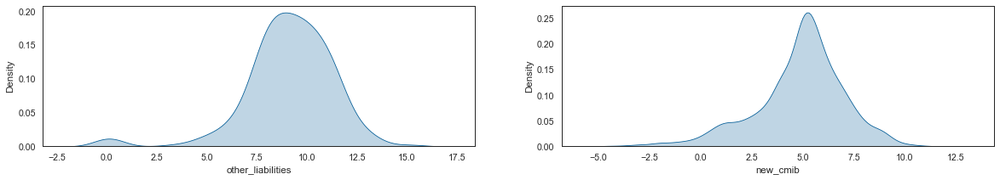

In [140]:
# we plot the features that should be logged

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")

plt.figure(figsize=(20,25))

# create a loop that iterates through all the features and plots their kdeplot accordingly

for i, col in enumerate(log10):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot((np.log(log10[col])), color='#005b96',shade=True, ax = ax)
    
plt.show()

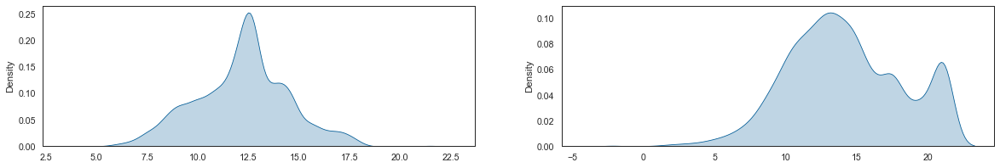

In [141]:
# we plot the features that should be box-coxxed

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# create a loop that iterates through all the features and plots their kdeplot accordingly

for i, col in enumerate(box):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot(pd.Series(stats.boxcox(box[col])[0]), color='#005b96', shade=True, ax = ax)

plt.show()

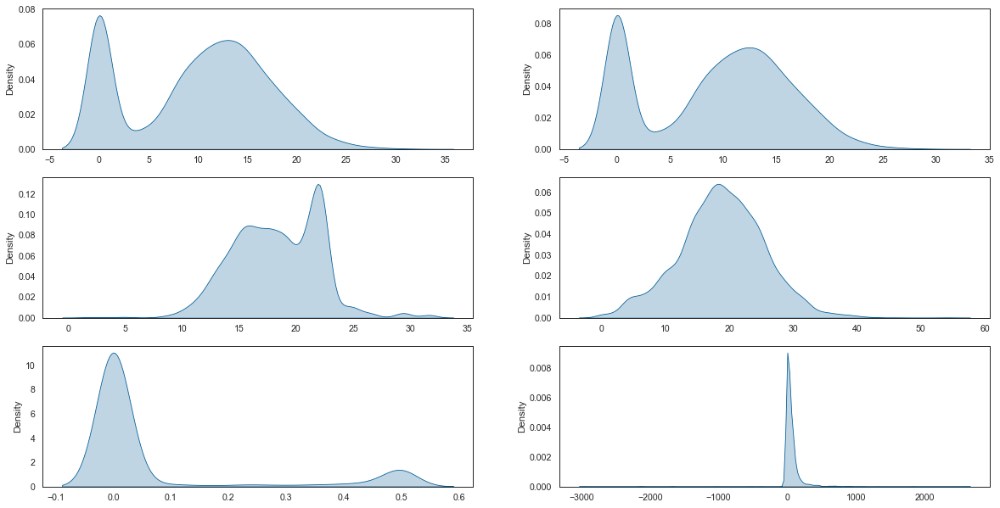

In [142]:
# we plot the features that should be yen-transformed

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# create a loop that iterates through all the features and plots their kdeplot accordingly

for i, col in enumerate(yeo):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot(pd.Series(scipy.stats.yeojohnson(yeo[col])[0]), color='#005b96', shade=True, ax = ax)

plt.show()
    

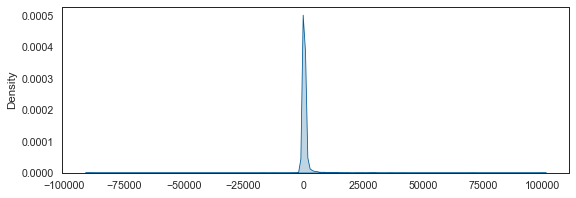

In [143]:
# we plot the new_passive_cc that should be yen-transformed with the constant 

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# plot the kdeplot for active_cc

ax = plt.subplot(7,2, i+1)
sns.kdeplot(pd.Series(scipy.stats.yeojohnson(col_z['new_passive_cc']+0.00001)[0]), color='#005b96', shade=True, ax = ax)

plt.show()

Despite the transformations not being perfect, the distirbutions are fairly normal and are certainly better than how they were as raw data. <br>

We can thus proceed to applying the transformations. <br>

**Zero Transformation**
<br>

As a summary, the features will be transformed as follows: <br>
    - volume_firm -> box-cox <br>
    - liabilities_firm -> box-cox <br>
    - liabilities -> yeo-johnson <br>
    - bank_liabilities -> yeo-johnson <br>
    - other_liabilities -> log10 <br>
    - pl_firm -> yeo-johnson <br>
    - pl -> yeo-johnson <br>
    - new_active_cc -> yeo-johnson <br>
    - new_passive_cc -> constant + yeo-johnson <br>
    - new_commissio_income -> yeo-johnson <br>
    - new_cmib -> log10
    
<br>
<br>
<br>

**Zero Dataset**

In [144]:
# volume_firm

# find the optimal lambda

pt = PowerTransformer(method='box-cox')
pt.fit(tra_zero[['volume_firm']])

# store the lambda 

n_9 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['volume_firm'] = scipy.special.boxcox(tra_zero['volume_firm'], n_9)





# liabilities_firm
# find the optimal lambda

pt = PowerTransformer(method='box-cox')
pt.fit(tra_zero[['liabilities_firm']])

# store the lambda 

n_10 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['liabilities_firm'] = scipy.special.boxcox(tra_zero['liabilities_firm'], n_10)







# liabilities
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['liabilities']])

# store the lambda 

n_11 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['liabilities'] = scipy.stats.yeojohnson(tra_zero['liabilities'], n_11)








# bank_liabilities
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['bank_liabilities']])

# store the lambda 

n_12 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['bank_liabilities'] = scipy.stats.yeojohnson(tra_zero['bank_liabilities'], n_12)







# other_liabilities
# apply the log base 10

tra_zero['other_liabilities'] = np.log(tra_zero['other_liabilities'] + 0.00001) # we apply +0.00001 due to 0 values






# pl_firm
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['pl_firm']])

# store the lambda 

n_14 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['pl_firm'] = scipy.stats.yeojohnson(tra_zero['pl_firm'], n_14)





# pl
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['pl']])

# store the lambda 

n_15 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['pl'] = scipy.stats.yeojohnson(tra_zero['pl'], n_15)





# active_cc
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['new_active_cc']])

# store the lambda 

n_16 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['new_active_cc'] = scipy.stats.yeojohnson(tra_zero['new_active_cc'], n_16)







# passive_cc
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['new_passive_cc']])

# store the lambda 

n_17 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['new_passive_cc'] = scipy.stats.yeojohnson(tra_zero['new_passive_cc'] + 0.00001, n_17)







# commission_income
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_zero[['new_commission_income']])

# store the lambda 

n_18 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_zero['new_commission_income'] = scipy.stats.yeojohnson(tra_zero['new_commission_income'], n_18)







# cmib
# apply the log base 10

tra_zero['new_cmib'] = np.log(tra_zero['new_cmib'] + 0.00001) # add a small constant to avoid issues

<br>

Now we proceed to applying the same methodology to the nonzero dataset.

<br>

In [145]:
print('\nThe following are the best transformations for the nonzero dataset. \n\n')

# we create a loop which applies the transformations to all selected features of the dataset

for i in col_n:
    try:
        l10 = np.log(col_n[i].skew())
    except:
        l10 = 100
    try:
        l2 = np.log2(col_n[i].skew())
    except:
        l2= 100
    try:
        sqrt = np.sqrt(col_n[i].skew())
    except:
        sqrt= 100
    try:
        box = pd.Series(stats.boxcox(col_n[i])[0]).skew()
    except:
        box= 100
    try:
        yeo = pd.Series(scipy.stats.yeojohnson(col_n[i])[0]).skew()
    except:
        yeo= 100
    
    # we create a dictionary with the values and transformations
    
    dic = {'Log10': l10, 'Log2': l2, 'Square Root': sqrt, 'Box-Cox': box, 'Yeo-Johnson': yeo}
    
    # we search for the solution closest to 0, insofar 0 represents a normally distirbuted data
    
    wanted_skewness = 0
   
    transformation, transformation_value = min(dic.items(), key=lambda x: abs(wanted_skewness - x[1]))

    # we print the best transformation and its result
    
    print(i + ': \n'+ transformation + ', ' + str(transformation_value) + '\n')


The following are the best transformations for the nonzero dataset. 


volume_firm: 
Box-Cox, 0.0025969138445838427

volume: 
Box-Cox, 0.010252039337464096

loans_approved: 
Yeo-Johnson, 0.00816921462249647

loans_utilized: 
Yeo-Johnson, -0.0832341519811398

liabilities_firm: 
Yeo-Johnson, 0.03398803692575327

liabilities: 
Yeo-Johnson, -0.09729575818267823

bank_liabilities: 
Yeo-Johnson, -0.11301046954000749

other_liabilities: 
Yeo-Johnson, 1.9273914929297118

pl_firm: 
Yeo-Johnson, -0.07597976240076992

pl: 
Yeo-Johnson, 0.021308223726845855

new_active_cc: 
Log10, 3.103160180963498

new_passive_cc: 
Log10, 4.229928384834317

new_commission_income: 
Yeo-Johnson, -1.2272515999896971

new_cmib: 
Log10, 3.3225184738564235



Now we can visualize the above-stated transformations in order to double-check the distirbution of the nonzero dataset.

In [146]:
# we group the features in their respective transformations 

log10 = col_n[['new_active_cc', 'new_passive_cc', 'new_cmib']]

box = col_n[['volume_firm', 'volume']]

yeo = col_n[['loans_approved', 'loans_utilized', 'liabilities_firm', 'liabilities', 
             'bank_liabilities', 'other_liabilities', 'pl_firm', 'pl','new_commission_income']]

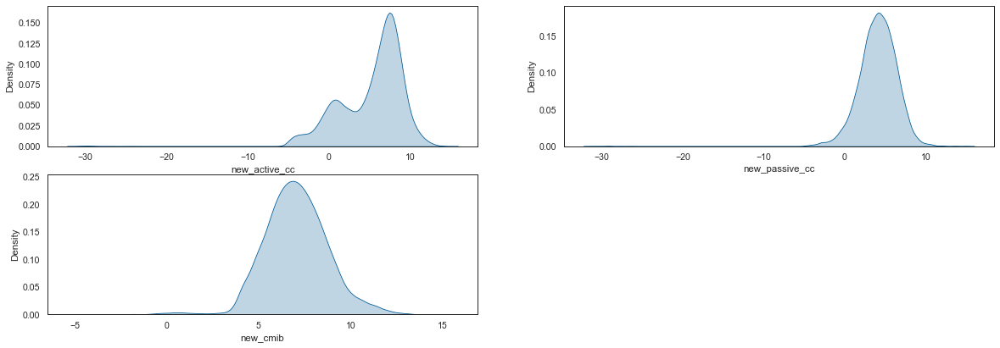

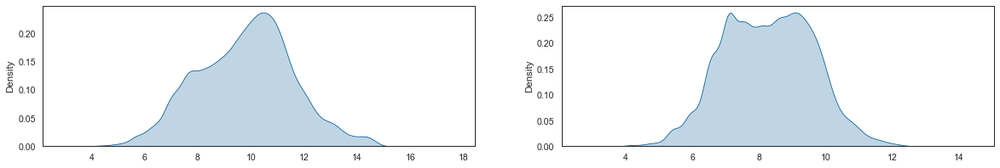

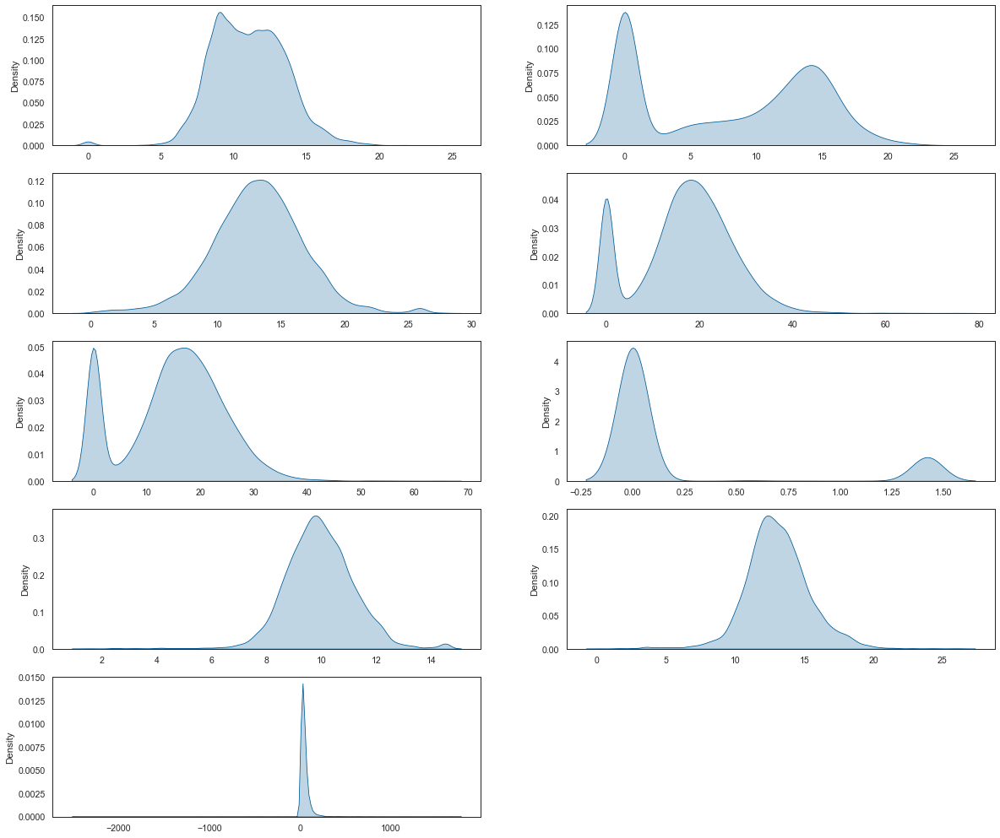

In [147]:
# we plot the features that should be logged

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# we design a loop to create kdeplots for all the features

for i, col in enumerate(log10):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot((np.log(log10[col])), color='#005b96', shade=True, ax = ax)
    
plt.show()

# we plot the features that should be box-coxxed

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# we design a loop to create kdeplots for all the features

for i, col in enumerate(box):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot(pd.Series(stats.boxcox(box[col])[0]), color='#005b96', shade=True, ax = ax)

plt.show()


# we plot the features that should be yen-transformed

# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


plt.figure(figsize=(20,25))

# we design a loop to create kdeplots for all the features

for i, col in enumerate(yeo):
    ax = plt.subplot(7,2, i+1)
    sns.kdeplot(pd.Series(scipy.stats.yeojohnson(yeo[col])[0]), color='#005b96', shade=True, ax = ax)

plt.show()

The observations are more normally distributed, therefore we proceed to applying the transformations to the dataset.

<br>

**Non-Zero Transformation**
<br>

To summarise financial variables of the nonzero dataset shall be transformed as follows: <br>
    - volume_firm -> box-cox <br>
    - volume -> box-cox <br>
    - loans_approved -> yeo-johnson <br>
    - loans_utilized -> yeo-johnson <br>
    - liabilities_firm -> yeo-johnson <br>
    - liabilities ->  yeo-johnson <br>
    - bank_liabilities -> yeo-johnson <br>
    - other_liabilities -> yeo-johnson <br>
    - pl_firm -> yeo-johnson <br>
    - pl -> yeo-johnson <br>
    - new_active_cc -> log10 <br>
    - new_passive_cc -> log10 <br>
    - new_commission_income -> yeo-johnson <br>
    - new_cmib -> log10

<br>

**Non-Zero Dataset**

In [148]:
# volume_firm
# find the optimal lambda

pt = PowerTransformer(method='box-cox')
pt.fit(tra_nonzero[['volume_firm']])

# store the lambda

n_1 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['volume_firm'] = scipy.special.boxcox(tra_nonzero['volume_firm'], n_1)






# volume
# find the optimal lambda

pt = PowerTransformer(method='box-cox')
pt.fit(tra_nonzero[['volume']])

# store the lambda

n_111 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['volume'] = scipy.special.boxcox(tra_nonzero['volume'], n_111)





# loans_approved
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['loans_approved']])

# store the lambda

n_2 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['loans_approved'] = scipy.stats.yeojohnson(tra_nonzero['loans_approved'], n_2)






# loans_utilized
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['loans_utilized']])

# store the lambda

n_3 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['loans_utilized'] = scipy.stats.yeojohnson(tra_nonzero['loans_utilized'], n_3)






# liabilities_firm
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['liabilities_firm']])

# store the lambda

n_4 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['liabilities_firm'] = scipy.stats.yeojohnson(tra_nonzero['liabilities_firm'], n_4)








# liabilities
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['liabilities']])

# store the lambda

n_5 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['liabilities'] = scipy.stats.yeojohnson(tra_nonzero['liabilities'], n_5)








# bank_liabilities
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['bank_liabilities']])

# store the lambda

n_6 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['bank_liabilities'] = scipy.stats.yeojohnson(tra_nonzero['bank_liabilities'], n_6)








# other_liabilities
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['other_liabilities']])

# store the lambda

n_7 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['other_liabilities'] = scipy.stats.yeojohnson(tra_nonzero['other_liabilities'], n_7)






# pl_firm
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['pl_firm']])

# store the lambda

n_777 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['pl_firm'] = scipy.stats.yeojohnson(tra_nonzero['pl_firm'], n_777)







# pl
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['pl']])

# store the lambda

n_8 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['pl'] = scipy.stats.yeojohnson(tra_nonzero['pl'], n_8)





# active_cc
# we apply the log base 10 transformation

tra_nonzero['new_active_cc'] = np.log(tra_nonzero['new_active_cc']+0.00001)  # we apply +0.00001 due to 0 values




# passive_cc
# we apply the log base 10 transformation

tra_nonzero['new_passive_cc'] = np.log(tra_nonzero['new_passive_cc']+0.00001) # we apply +0.00001 due to 0 values







# commission_income
# find the optimal lambda

pt = PowerTransformer(method='yeo-johnson')
pt.fit(tra_nonzero[['new_commission_income']])

# store the lambda

n_888 = pt.lambdas_

# apply the transformation with the most optimal lambda 

tra_nonzero['new_commission_income'] = scipy.stats.yeojohnson(tra_nonzero['new_commission_income'], n_888)







# cmib
# we apply the log base 10 transformation

tra_nonzero['new_cmib'] = np.log(tra_nonzero['new_cmib']+0.00001) # we apply +0.00001 due to 0 values

<br>

Following the normalisation of the data, the KNN Imputer shall be used to to fix any potential NaN caused by the trasnformations.

<br>

In [149]:
# we use the KNN imputer in order to fill any potential missing value

imputer = KNNImputer()

# for the zero dataset

tra_zero = pd.DataFrame(imputer.fit_transform(tra_zero),columns=tra_zero.columns)

# for the nonzero dataset

tra_nonzero = pd.DataFrame(imputer.fit_transform(tra_nonzero),columns=tra_nonzero.columns)

<br>

Now that we have a clear segmentation between the zero and the non-zero values, and that the values have been transformed, we can proceed with further cleaning by assessing collinearity within the dataset.
<br>

## Correlation Matrix  <a class="anchor" id="22"></a>

We design a correlation matrix to remove features which depict a high correlation amongst eachother. By doing this we can achieve to benefits that might help the clustering process. Foremost we limit the dimensions of the dataset, limiting the effect of the dimensionality trap and secondly we remove features that carry little meaning. Specifically if two features are related, that means that one can easily explain the other. Consequuentially by removing one of the two features we would still maintain the information that the features carry but we would have less noise.

<br>

### Zero DataSet <a class="anchor" id="vc"></a>

In [150]:
# Correlation Matrix

# we find the correlation between the features

corr = tra_zero.corr() 

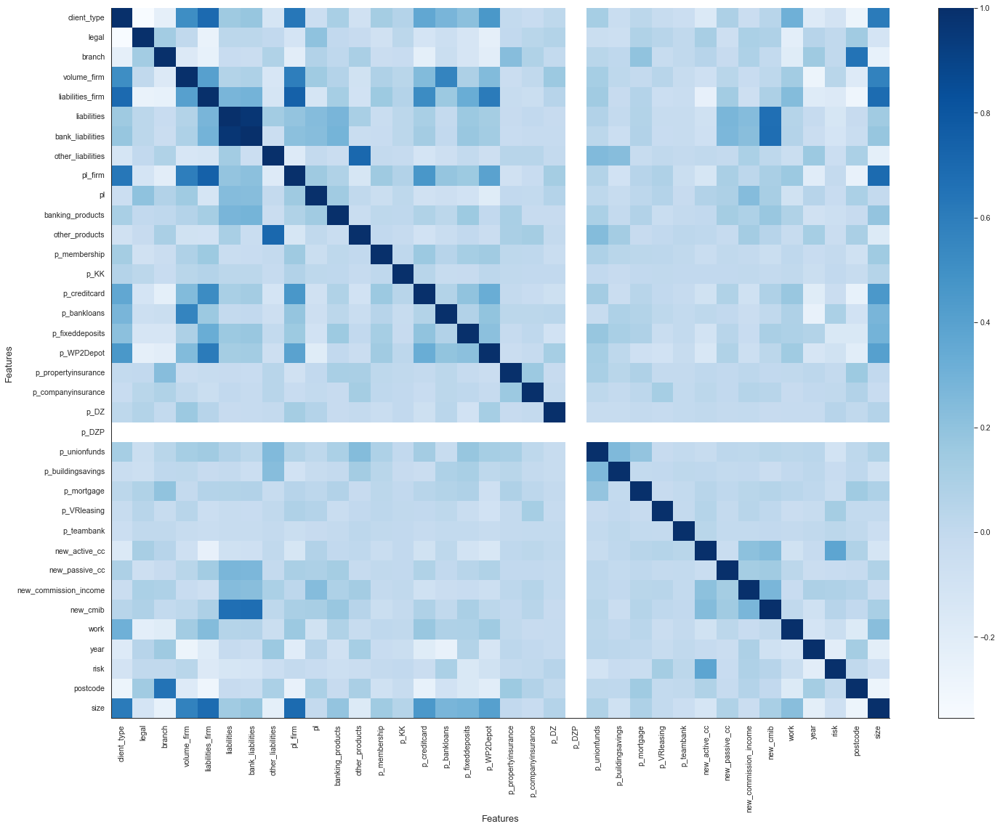

In [151]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(24,18))


# develop a heatmap to show the most correlated features

j = sns.heatmap(corr, cmap="Blues", ax=ax,)

sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Correlation Matrix for Zero Dataset', fontsize = 30, pad = 17)

ax.set_xlabel('Features', fontsize = 13)
ax.set_ylabel('Features', fontsize = 13)

# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Correlation_zero.png', bbox_inches='tight', dmi=1200)

sns.despine()

Consequentially we can remove the following features: branch, liabilities, pl_firm, other_products, p_WP2Depot, p_creditcard, p_bankloans, p_DZP, new_cmib, size. This should avoid noise within the dataset.

In [152]:
# we drop the features that are depicting collinearity with other features in the dataset

final_zero = tra_zero.drop(columns=['branch', 'liabilities','pl_firm', 'other_products', 'p_WP2Depot', 
                                    'p_creditcard','p_bankloans','p_DZP', 'new_cmib', 'size', 'client_type'])

<br>

### Nonzero DataSet <a class="anchor" id="vcc"></a>

We apply the same reasoning to the nonzero dataset. Therefore we commence by visualising the correlation matrix.

In [153]:
#Correlation Matrix

# correlation between the features

corr = tra_nonzero.corr()

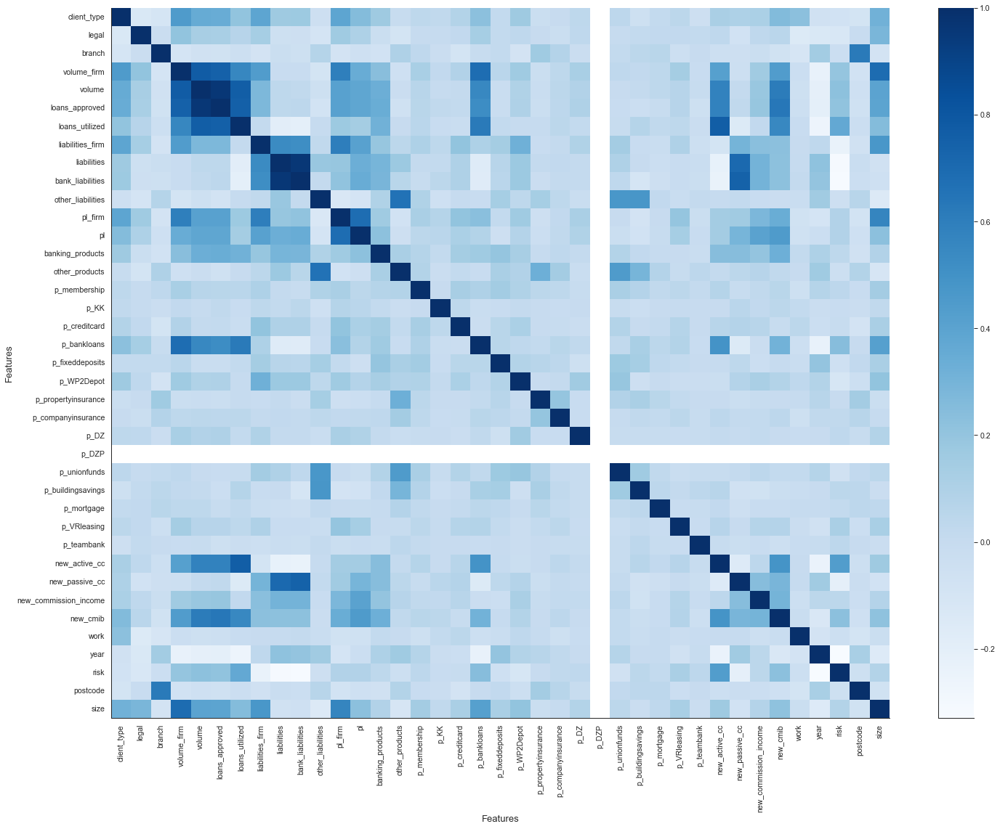

In [154]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(24,18))


# develop a heatmap to check what features are related

j = sns.heatmap(corr, cmap="Blues", ax=ax,)

sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot
#ax.set_title('Correlation MAtrix for Nonzero Dataset', fontsize = 30, pad = 17)

ax.set_xlabel('Features', fontsize = 13)
ax.set_ylabel('Features', fontsize = 13)

# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

#plt.savefig('Correlation_nonzero.png', bbox_inches='tight', dmi=1200)

sns.despine()

Consequentially to mitigate the effects of collinearity we can remove the following features: branch, liabilities, liabilities_firm, volume, volume_firm, pl_firm, loans_utilized, other_products, p_unionfunds, p_buildingsavings, p_bankloans, p_DZP, new_cmib, new_passive_cc, size.

In [155]:
# we drop the features that are depicting collinearity with other features in the dataset

final_nonzero = tra_nonzero.drop(columns=['branch', 'liabilities','liabilities_firm','volume', 'volume_firm', 'pl_firm', 
                                          'loans_utilized', 'other_products', 'p_unionfunds', 'p_buildingsavings',
                                          'p_bankloans', 'p_DZP', 'new_cmib', 'new_passive_cc', 'size'])


## Scale the Data <a class="anchor" id="am"></a>

Now that we have a usable dataset, we can scale the data to aid clutering even further. By scaling the data we mean standardizing the features. This transforms the data so that the mean for each numerical feature is 0 and the standard deviation is 1. Unlike MinMax scaler this does not limit the range of the features but merely diminishes their relative distance. This is a highly beneficial technique in a dataset which depicts financial features with different ranges.

In [156]:
# define the scaler

scaler = StandardScaler()

# select the numerical features 

numer = final_zero[['volume_firm', 'liabilities_firm', 'bank_liabilities', 'other_liabilities',
       'pl', 'banking_products', 'new_active_cc','new_passive_cc', 'new_commission_income']]


# select the categorical features 

cat = final_zero[['legal','p_membership', 'p_KK',
                  'p_fixeddeposits', 'p_propertyinsurance', 'p_companyinsurance', 'p_DZ',
                  'p_unionfunds', 'p_buildingsavings', 'p_mortgage', 'p_VRleasing',
                  'p_teambank', 'work', 'year', 'risk', 'postcode']]

# apply the scaler to the numerical features

numer = pd.DataFrame(scaler.fit_transform(numer))

# concatonate back together with the categorical features 

final_zero = pd.concat([numer, cat], axis=1, join='inner')

In [157]:
# change the name of the columns back to the features' original names

final_zero.rename(columns = {0:'volume_firm', 
                             1: 'liabilities_firm',
                             2:'bank_liabilities',
                             3: 'other_liabilities',
                             4: 'pl',
                             5: 'banking_products',
                             6: 'new_active_cc',
                             7: 'new_passive_cc',
                             8: 'new_commission_income',
                             }, inplace = True)

In [158]:
# select the numerical features 

numer = final_nonzero[['loans_approved', 'bank_liabilities',
                       'other_liabilities', 'pl', 'banking_products','new_active_cc', 'new_commission_income']]


# select the categorical features 

cat = final_nonzero[['client_type', 'legal', 'p_membership', 'p_KK',
                     'p_creditcard', 'p_fixeddeposits', 'p_WP2Depot', 'p_propertyinsurance',
                     'p_companyinsurance', 'p_DZ', 'p_mortgage', 'p_VRleasing', 'p_teambank', 'work',
                     'year', 'risk', 'postcode']]

# apply the scaler to the numerical features

numer = pd.DataFrame(scaler.fit_transform(numer))

# concatonate back together with the categorical features 

final_nonzero = pd.concat([numer, cat], axis=1, join='inner')

In [159]:
# change the name of the columns back to the features' original names

final_nonzero.rename(columns = {0:'loans_approved', 
                                1:'bank_liabilities',
                                2: 'other_liabilities',
                                3: 'pl',
                                4: 'banking_products',
                                5: 'new_active_cc',
                                6: 'new_commission_income',
                                }, inplace = True)

## Check Data Distribution <a class="anchor" id="dd"></a>

### Principal Component Analysis <a class="anchor" id="ddd"></a>

We now visualise the datasets to see whether they portray inherent clusters. The visualisations will be conducted both via PCA and via t-SNE.

In [160]:
# Set the PCA to two components

bbq = PCA(n_components = 2)

# fit and transform the final zero dataset

bbs= bbq.fit_transform(final_zero)

# select the features for the graphing

pc111 = bbs[:,0]
pc222 = bbs[:,1]

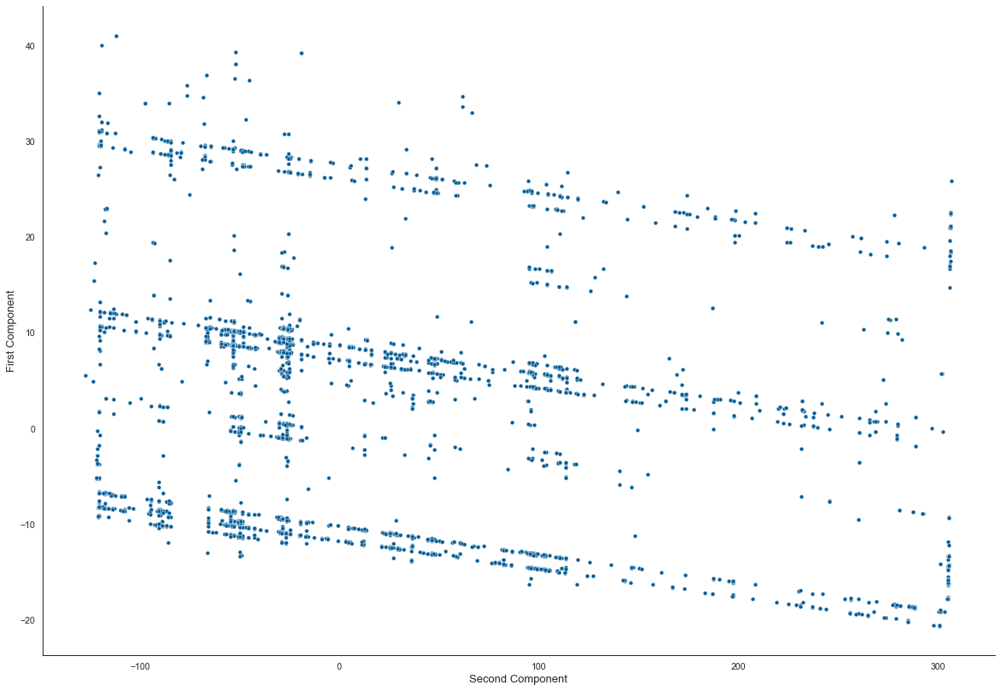

In [161]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(20,14))

# develop a scatterplot of the principal components

sns.scatterplot(x=pc111, y=pc222, color='#005b96')


sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot

#ax.set_title('Zero Dataset PCA projection', fontsize = 30, pad = 17)
ax.set_xlabel('Second Component', fontsize = 13)
ax.set_ylabel('First Component', fontsize = 13)


# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

#plt.savefig('PCA_zero.png', dmi=1200)

In [162]:
# Set the PCA to two components

bbq = PCA(n_components = 2)

# fit and transform the final nonzero dataset

bbs= bbq.fit_transform(final_nonzero)

# select the features for the graphing

pc111 = bbs[:,0]
pc222 = bbs[:,1]

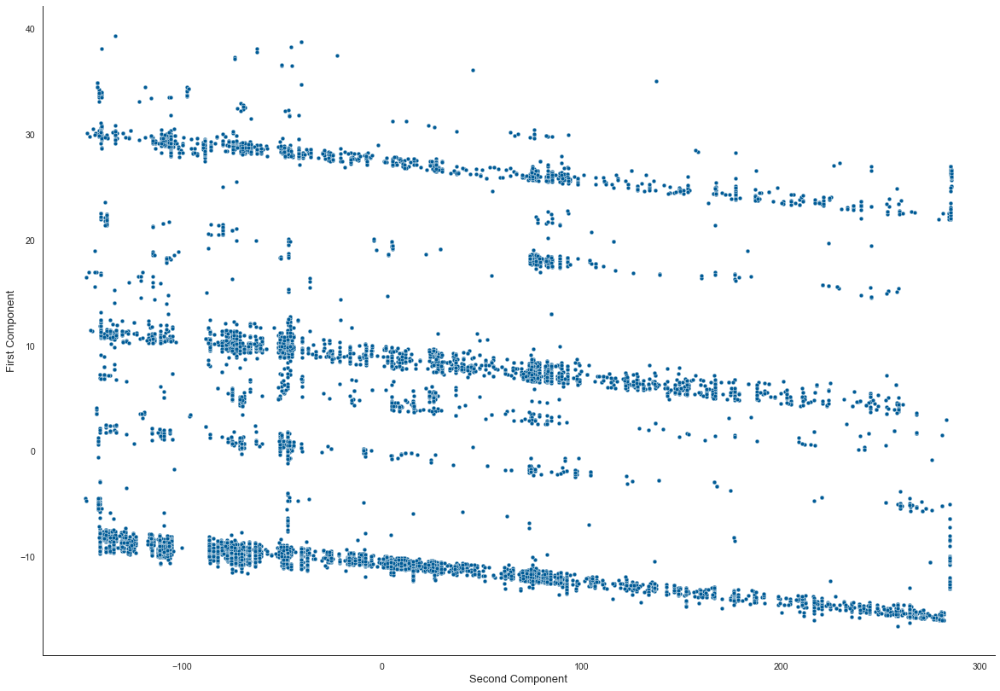

In [163]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(20,14))

# develop a scatterplot of the two principal components

sns.scatterplot(x=pc111, y=pc222, color='#005b96')


sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot

#ax.set_title('Nonzero Dataset PCA projection', fontsize = 30, pad = 17)
ax.set_xlabel('Second Component', fontsize = 13)
ax.set_ylabel('First Component', fontsize = 13)


# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

#plt.savefig('PCA_zero.png', dmi=1200)

### t-SNE <a class="anchor" id="dddd"></a>

As priorly mentioned we also depict the datasets with t-SNE

In [164]:
# define the t-SNE algorithm with two components

tsne = TSNE(n_components=2, verbose=1, random_state=123)

# fit tranform the final zero dataset

z = tsne.fit_transform(final_zero)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5186 samples in 0.001s...
[t-SNE] Computed neighbors for 5186 samples in 0.595s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5186
[t-SNE] Computed conditional probabilities for sample 2000 / 5186
[t-SNE] Computed conditional probabilities for sample 3000 / 5186
[t-SNE] Computed conditional probabilities for sample 4000 / 5186
[t-SNE] Computed conditional probabilities for sample 5000 / 5186
[t-SNE] Computed conditional probabilities for sample 5186 / 5186
[t-SNE] Mean sigma: 1.335460
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.249306
[t-SNE] KL divergence after 1000 iterations: 0.495657


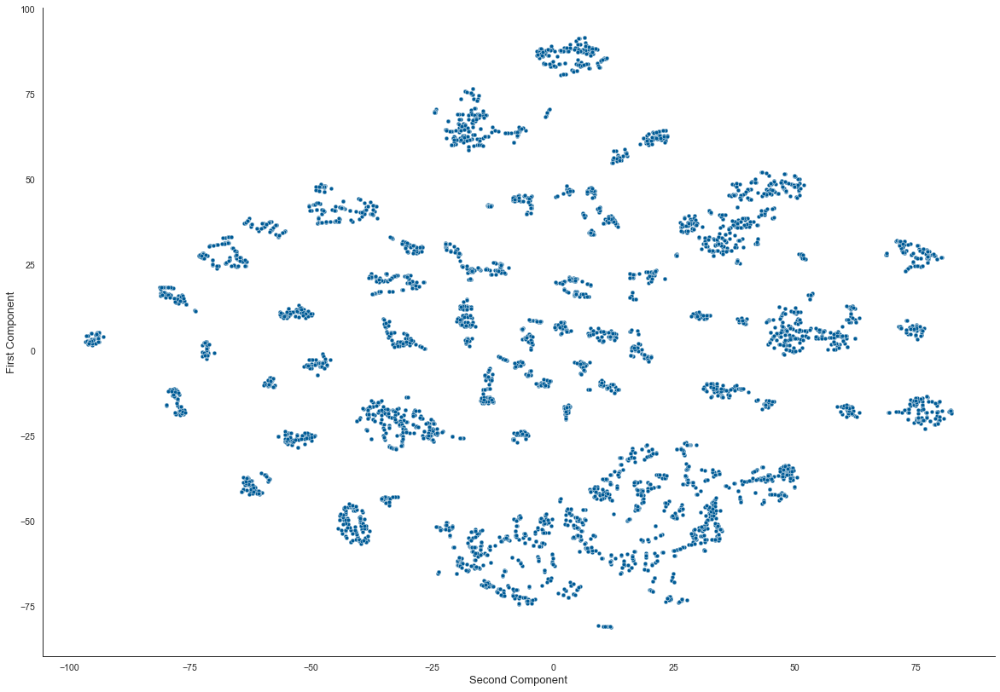

In [165]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(20,14))

# create a scatterplot depicting the two t-SNE components

sns.scatterplot(x=z[:,0], y=z[:,1],data=z, color='#005b96')


sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot

#ax.set_title('Zero Dataset T-SNE projection', fontsize = 30, pad = 17)
ax.set_xlabel('Second Component', fontsize = 13)
ax.set_ylabel('First Component', fontsize = 13)


# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

#plt.savefig('PCA_zero.png', dmi=1200)

In [166]:
# set the t-SNE to have two components

tsne = TSNE(n_components=2, verbose=1, random_state=123)

# fit transform the nonzero dataset

z = tsne.fit_transform(final_nonzero)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13807 samples in 0.002s...
[t-SNE] Computed neighbors for 13807 samples in 0.633s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13807
[t-SNE] Computed conditional probabilities for sample 2000 / 13807
[t-SNE] Computed conditional probabilities for sample 3000 / 13807
[t-SNE] Computed conditional probabilities for sample 4000 / 13807
[t-SNE] Computed conditional probabilities for sample 5000 / 13807
[t-SNE] Computed conditional probabilities for sample 6000 / 13807
[t-SNE] Computed conditional probabilities for sample 7000 / 13807
[t-SNE] Computed conditional probabilities for sample 8000 / 13807
[t-SNE] Computed conditional probabilities for sample 9000 / 13807
[t-SNE] Computed conditional probabilities for sample 10000 / 13807
[t-SNE] Computed conditional probabilities for sample 11000 / 13807
[t-SNE] Computed conditional probabilities for sample 12000 / 13807
[t-SNE] Computed conditional probabilities for sam

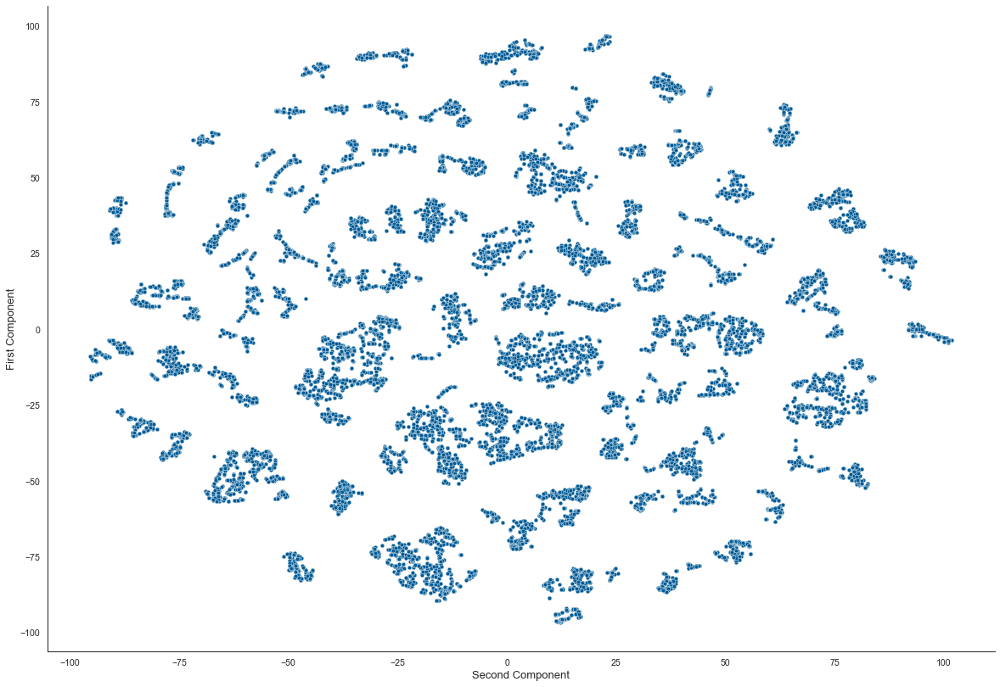

In [167]:
# set the basic format (i.e. the palette for the color and the backgrounds)
sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")


fig, ax = plt.subplots(figsize=(20,14))

# create a scatterplot depicting the two t-SNE components

sns.scatterplot(x=z[:,0], y=z[:,1],data=z, color='#005b96')


sns.set(font_scale = 1)


# Set title, labels and ticks to each subplot

#ax.set_title('Nonzero Dataset T-SNE projection', fontsize = 30, pad = 17)
ax.set_xlabel('Second Component', fontsize = 13)
ax.set_ylabel('First Component', fontsize = 13)


# Adjust the distance between each subplot

plt.subplots_adjust(wspace = 0.8, hspace = 1.5)

sns.despine()

#plt.savefig('PCA_zero.png', dmi=1200)

The graphs portray very good reduced dimensional visualisations of the datasets. It appears that clustering is possible when visualising the datasets in two dimensions because both PCA and t-SNE suggest that there are inherent groups within the zero and nonzero dataset.

## Save Dataset  <a class="anchor" id="22.2"></a>

We now save the dataset to ensure that it is correctly formatted for the modelling phase.

In [168]:
final_zero.to_csv('final_zero.csv')
tra_zero.to_csv('tra_zero.csv')
zero_df.to_csv('zero_df.csv')

final_nonzero.to_csv('final_nonzero.csv')
tra_nonzero.to_csv('tra_nonzero.csv')
nonzero_df.to_csv('nonzero_df.csv')

Within the next section, we shall test whether clustering factually works on a corporate banking dataset. We will apply several clustering algorithms (i.e. K-Means, K-Medoids, FasterPAM, DBSCAN, HDBSCAN, HAC and Fuzzy C-Means) on the dataset and test the results. Furthermore, we shall further adopt dimensional reduction techniques to reduce the noise within the datasets and re-run the models to see whether the accuracy measures are improved. For the purpose of the excercise the following dimension reductin techniques shall be applied: PCA, t-SNE, ICA, UMAP.

Given that this notebook merely acts like a summary of the results, it only depicts the best performing models and does not show the results for all other models. For a more detailed explanation of how the other models were run and what results they produced, the reader is advised to check the different models within their respective brances of the GitHub repository.

As a summary, the research decided to select two best performing models per dataset. The reason behind the choice shall become clearer later. Nonetheless it is important to state that the best performing models for the zero dataset were the K-Means on a PCA reduced dataset and the HAC on a UMAP reduced dataset. When regarding the nonzero dataset, the best performing models were the Fuzzy C-Means on a PCA reduced dataset and the FasterPAM on a UMAP reduced dataset.

It is further import to note that the visualisations of the results are conducted on the tra_zero and tra_nonzero datasets respectively. The datasets portray normalised and standardised features but no feature extraction has been conducted. These datasets are used instead of the original ones due to their lower level of skewness. Specifically, by utilising such datasets it is possible to gain greater insights on the data distribution since the original datasets would merely depict an agglomerate of values in one condensed area and a few scattered outliers. Nonetheless it is also important to note that the tra_zero and tra_nonzero datasets do not alter the original distirbutions of their features, they merely reduce relative distances.

# Data Modelling 

In [169]:
# Import the zero dataset and remove unwanted columns

final_zero = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\final_zero.csv')
final_zero.drop(columns=['Unnamed: 0'], inplace=True)
tra_zero = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\tra_zero.csv')
tra_zero.drop(columns=['Unnamed: 0'], inplace=True)
zero_df = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\zero_df.csv')
zero_df.drop(columns=['Unnamed: 0'], inplace=True)

# Import the nonzero dataset and remove unwanted columns

final_nonzero = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\final_nonzero.csv')
final_nonzero.drop(columns=['Unnamed: 0'], inplace=True)
tra_nonzero = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\tra_nonzero.csv')
tra_nonzero.drop(columns=['Unnamed: 0'], inplace=True)
nonzero_df = pd.read_csv(r'C:\Users\cgirardi\OneDrive - zeb\Desktop\BB\nonzero_df.csv')
nonzero_df.drop(columns=['Unnamed: 0'], inplace=True)

# PCA  Models <a class="anchor" id="2"></a>


Foremost we have to reduce the datasets using Principal Component Analysis to run the following models: K-Means and Fuzzy C-Means <br>

In [170]:
# We define the PCA algorithm with a number of compnents that can explain 90% of the variance

pca = PCA(n_components=0.90)

# Zero Dataset
# we apply pca to the zero dataset

PCA_zero = pca.fit_transform(final_zero)

# Nonzero Dataset
# we apply pca to the non-zero dataset

PCA_nonzero = pca.fit_transform(final_nonzero)

In [171]:
# We then define a PCA with two components for visual purposes

pca_2d = PCA(n_components=2)

# We then define a PCA with three components for visual purposes

pca_3d = PCA(n_components =3)

## Apply the models to the Datasets

<br>

### Sillhoutte: PCA  Zero K-Means  <a class="anchor" id="23.3"></a>

To identify the otpimal number of clusters for the model we adopt the silhoutte score. This shall be derived through the adoption of the clusteval package due to its speed in producing results.

In [172]:
# We define the model and set the parameters to evaluate the GOF

ce_kmeans = clusteval(cluster= 'kmeans', evaluate='silhouette', max_clust=20)


[clusteval] >Fit using kmeans with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|███████████████████████████████████████████████████████| 18/18 [00:31<00:00,  1.75s/it]


[clusteval] >Optimal number clusters detected: [13].
[clusteval] >Fin.


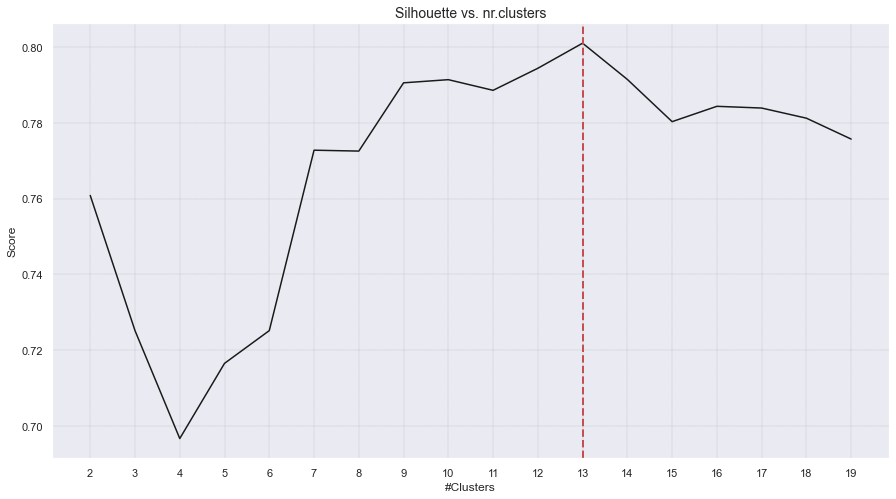

(<Figure size 1080x576 with 1 Axes>,
 <AxesSubplot:title={'center':'Silhouette vs. nr.clusters'}, xlabel='#Clusters', ylabel='Score'>)

In [173]:
# Fit the array to find optimal number of clusters

ce_kmeans.fit(PCA_zero)

# Make plot of the silhouette

ce_kmeans.plot()

The former model selected was the K-Means. This model performed best on the Zero Dataset, efficiently segmenting the clients within 13 categories.

In [174]:
# we define the model and the respective parameters

k_model_PCA_zero = KMeans(algorithm='elkan', copy_x=True, init='k-means++', max_iter=1000, 
                 n_clusters=13, n_init=100, random_state=9, tol=0.0001, verbose=0)

# Fit the function to the PCA zero dataset

k_model_PCA_zero.fit(PCA_zero)
k_model_PCA_zero.cluster_centers_

# Assign the labels to the respective rows and further view the cluster segmentation 

final_zero['Cluster_k_PCA'] = k_model_PCA_zero.labels_
tra_zero['Cluster_k_PCA'] = k_model_PCA_zero.labels_

zero_df["Cluster_k_PCA"] = k_model_PCA_zero.labels_
print('Distribution of Clusters: \n')
print(zero_df['Cluster_k_PCA'].value_counts())

Distribution of Clusters: 

5     2015
0     1034
7      409
6      346
3      276
2      226
4      197
8      188
11     178
12      99
1       82
10      70
9       66
Name: Cluster_k_PCA, dtype: int64


The model produced the following results.

In [175]:
print('The PCA performance scores are the following: \n' )
print('13 Clusters')
print('Silhouette: ' + str(silhouette_score(PCA_zero, k_model_PCA_zero.labels_ , metric='euclidean')))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(PCA_zero, k_model_PCA_zero.labels_ )))
print('Davies Bouldin: ' + str(davies_bouldin_score(PCA_zero, k_model_PCA_zero.labels_)))

The PCA performance scores are the following: 

13 Clusters
Silhouette: 0.8010363750858038
Calinski Harabasz: 147964.2415017467
Davies Bouldin: 0.3693626996831586


As can be seen, both the Silhouette and the Calinski Harabasz scores are extremely high, entailing good inter-cluster similarities and robust intra-cluster differences. We then visualise the clusters in a PCA reduced plot.

#### Visualisation  <a class="anchor" id="5"></a>

In [176]:
# we remove the clusters from a new dataset

tt = tra_zero.drop(columns=['Cluster_k_PCA'])

# we create two dfs, one for 2 components and one for 3

PCs_2d = pd.DataFrame(pca_2d.fit_transform(tt))
PCs_3d = pd.DataFrame(pca_3d.fit_transform(tt))


# PC1_2d: The first component. PC2_2d: The second component, etc-

PCs_2d.columns = ["PC1_2d", "PC2_2d"]

PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

# we create a new df

tra_zero1 = tra_zero.copy()

# we concatonate all dfs together to then derive visuals

tra_zero1 = pd.concat([tra_zero1,PCs_2d,PCs_3d], axis=1, join='inner')

In [177]:
# we create a new variable for each cluster in the dataset so we create two empty lists

cluster = []
idd = []

# we then create a loop to iterate through the values

for i in tra_zero1["Cluster_k_PCA"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n) # for each id we create a new variable
    m = str(id_) +  ' = ' + 'tra_zero1[tra_zero1["Cluster_k_PCA"] == ' + str(n) + ']' # we then define the variable 
    idd.append(id_) # we append its id to the list
    cluster.append(m) # we append the variable to the list

# we then create a loop to execute all of the new variables created
    
for i in cluster:
    exec(i)

    
# we create two new lists, one to contain the different PCA plots, the other to store the trace (i.e. id of the plot)
    
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
# we create a dictionary to ensure that all traces are correctly defined  
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a

# we execute the dictionary and create the individual plots  
    
for key, value in commands.items():
    exec (f'{key}={value}')            
   

In [178]:
# we retrieve all the new features

for i in l:
    print(i)

tracecluster_5
tracecluster_0
tracecluster_7
tracecluster_6
tracecluster_3
tracecluster_2
tracecluster_4
tracecluster_8
tracecluster_11
tracecluster_12
tracecluster_1
tracecluster_10
tracecluster_9


In [179]:
# we set a title for the graph

title = "Visualizing Clusters in Two Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_5,
tracecluster_0,
tracecluster_7,
tracecluster_6,
tracecluster_3,
tracecluster_2,
tracecluster_4,
tracecluster_8,
tracecluster_11,
tracecluster_12,
tracecluster_1,
tracecluster_10,
tracecluster_9]), layout = layout)

pyo.iplot(fig)

# we save the dataset
    
#fig.write_image("Kmeans_orig_2_Z.png", scale=2)

In [180]:
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter3d(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], z =' + i + '["PC3_3d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}')     

In [181]:
for i in l:
    print(i)

tracecluster_5
tracecluster_0
tracecluster_7
tracecluster_6
tracecluster_3
tracecluster_2
tracecluster_4
tracecluster_8
tracecluster_11
tracecluster_12
tracecluster_1
tracecluster_10
tracecluster_9


In [182]:
# we set a title for the graph

title = "Visualizing Clusters in Three Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_5,
tracecluster_0,
tracecluster_7,
tracecluster_6,
tracecluster_3,
tracecluster_2,
tracecluster_4,
tracecluster_8,
tracecluster_11,
tracecluster_12,
tracecluster_1,
tracecluster_10,
tracecluster_9]), layout = layout)

pyo.iplot(fig)

# we save the dataset

#fig.write_image("Kmeans_orig_3_Z.png", scale=2)

As can be seen by the two dimensional and three dimensional plots, the clusters are well separated and densely distributed. Therefore, this represents an extremely efficient solution. The images are contained within the GitHub branch PCA KMeans.

#### Customer Distribution  <a class="anchor" id="6"></a>

Next we determine the distribution of customers by visualising the means of said clients within the most significant features

In [183]:
# select the most relevant features for illustrative purposes

feat_1 = ['legal', 'volume_firm', 'loans_utilized', 'liabilities',
       'bank_liabilities', 'pl','banking_products', 'other_products',
       'new_commission_income', 'new_cmib', 'year', 'risk', 'postcode',
       'size','Cluster_k_PCA']

In [184]:
# Group the observations by cluster and depict the means

desc_1 = zero_df[feat_1].groupby('Cluster_k_PCA').mean().T
desc_1.iloc[:,:7]

Cluster_k_PCA,0,1,2,3,4,5,6
legal,1.577756e+01,19.731707,23.115044,1.423913e+01,1.887310e+01,6.739454e+00,1.400289e+01
volume_firm,5.174833e+07,821783.490854,942302.290664,2.402643e+06,7.800669e+06,3.094152e+06,1.442815e+06
loans_utilized,1.343448e+02,5.290854,16.449204,2.655543e+00,2.400152e+00,4.684903e+01,8.151540e+01
liabilities,9.582019e+04,197341.389268,47662.082080,5.892485e+04,5.884377e+04,1.798706e+05,3.748035e+04
bank_liabilities,9.194069e+04,195947.369390,46223.608186,5.330703e+04,5.773078e+04,1.783458e+05,3.455197e+04
pl,6.433767e+05,535263.636488,197108.271168,3.537058e+05,2.468958e+06,3.102929e+05,2.354348e+05
banking_products,7.656673e+00,1.280488,1.924779,1.619565e+00,1.116751e+00,2.893300e+00,3.375723e+00
other_products,5.029014e-02,0.036585,0.132743,3.297101e-01,1.167513e-01,9.429280e-02,2.947977e-01
new_commission_income,1.806852e+02,336.947927,53.283717,1.802248e+02,2.198842e+02,1.141621e+02,1.349348e+02
new_cmib,5.327247e+02,730.881829,347.100708,3.449345e+02,5.410113e+02,9.321050e+02,3.196665e+02


The means of the respective clusters are well defined and differ in range. Consequentially the clusters factually represent different categories of clients. When observing the most important features, the financial features, it can be seen that the model did an extremely good job in classifying individuals.

##### Distribution of Financial Features  <a class="anchor" id="7"></a>

Next we visualise the feature distribution. Since  bank is primarily concerned with the financial characteristics of the clients, these shall be depicted first.

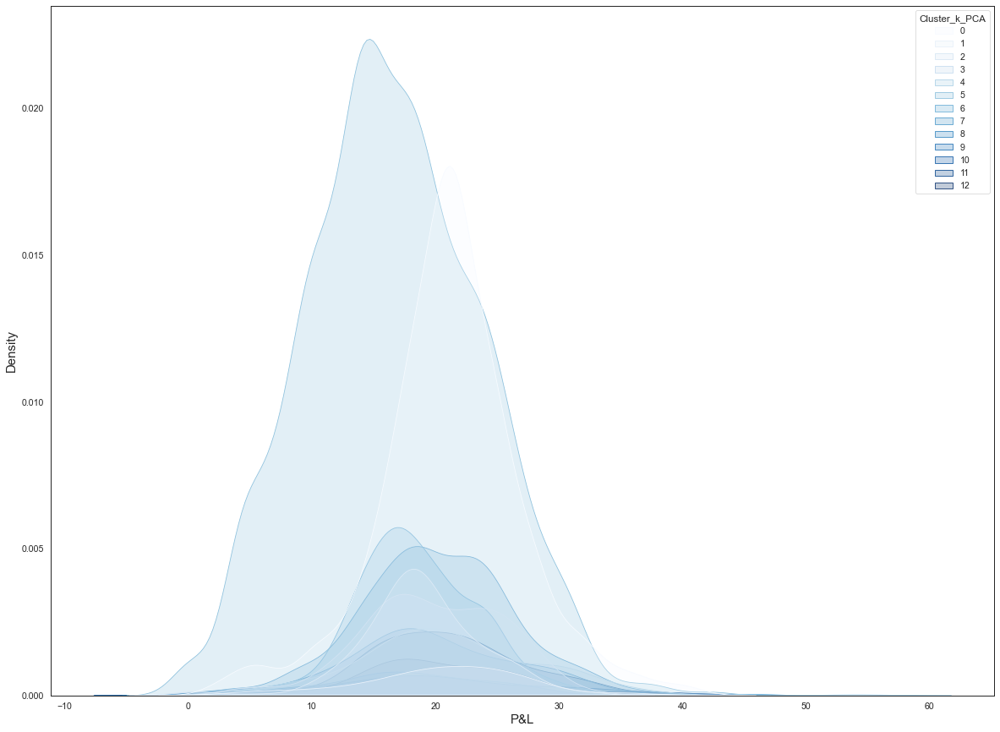

In [185]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_zero, x="pl", hue="Cluster_k_PCA", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('P&L', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

#plt.savefig('PL_kmean.png', dmi=1200)

plt.show()

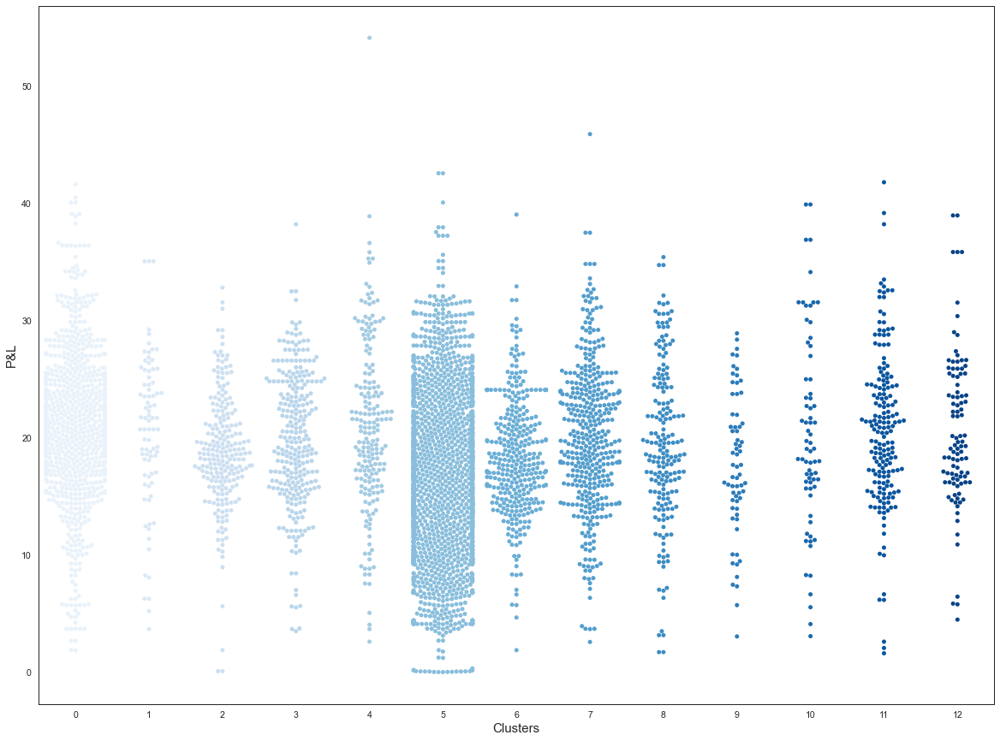

In [186]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_zero, x="Cluster_k_PCA", y="pl",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('P&L', fontsize = 15)

#plt.savefig('PL_kmean2.png', dmi=1200)

plt.show()

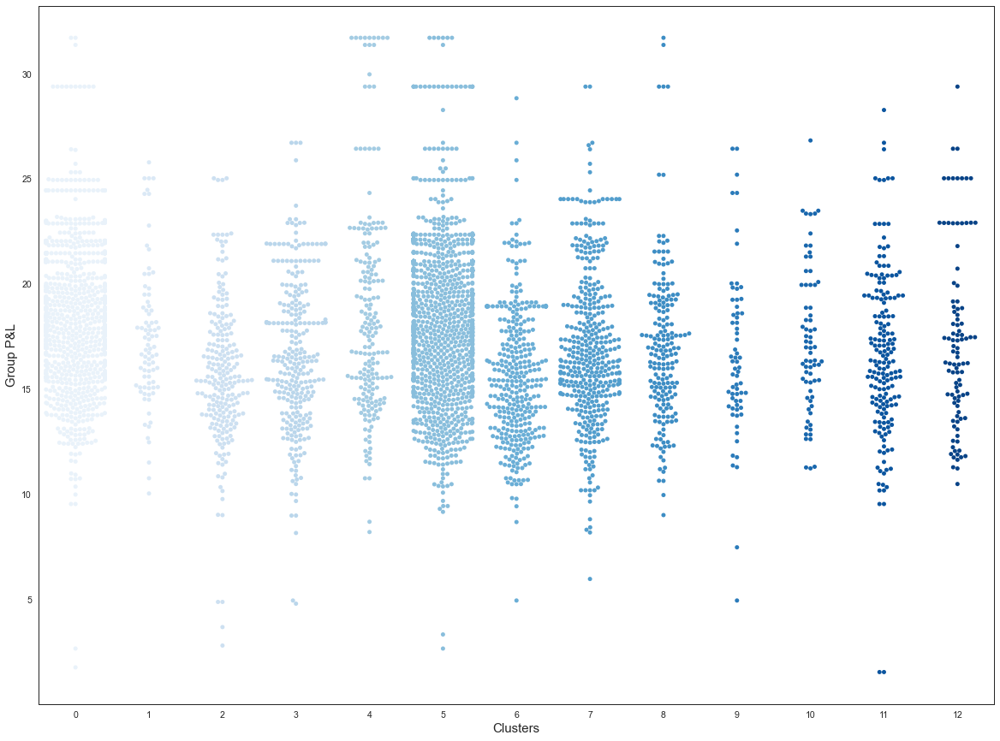

In [187]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_zero, x="Cluster_k_PCA", y="pl_firm",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot 

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Group P&L', fontsize = 15)

plt.show()

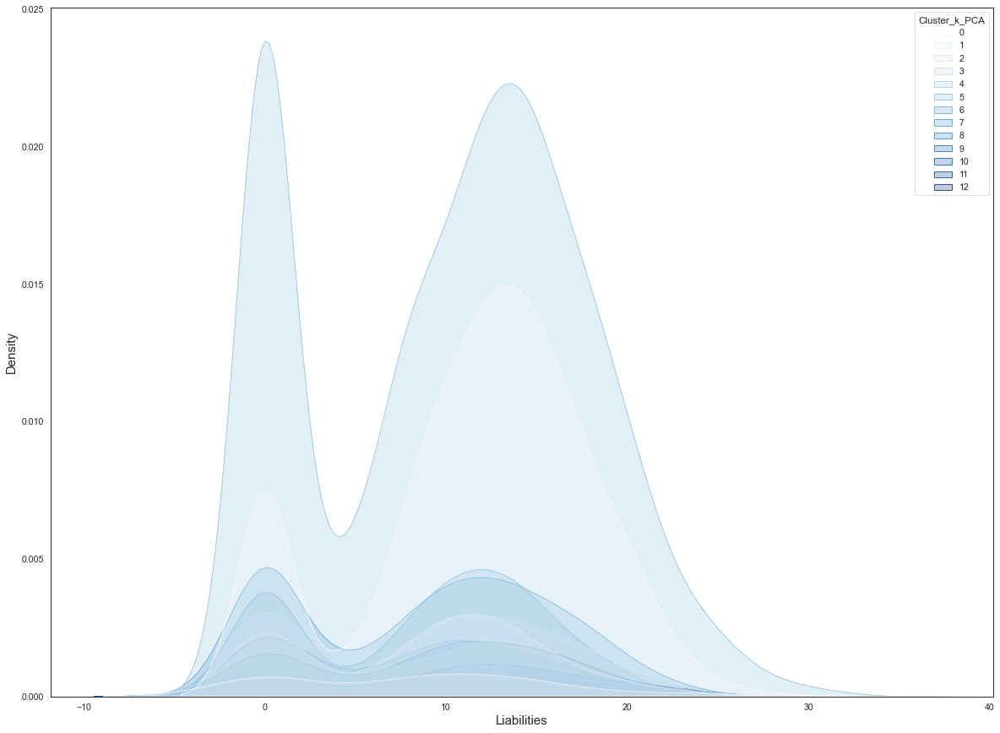

In [188]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_zero, x="liabilities", hue="Cluster_k_PCA", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Liabilities', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

plt.show()

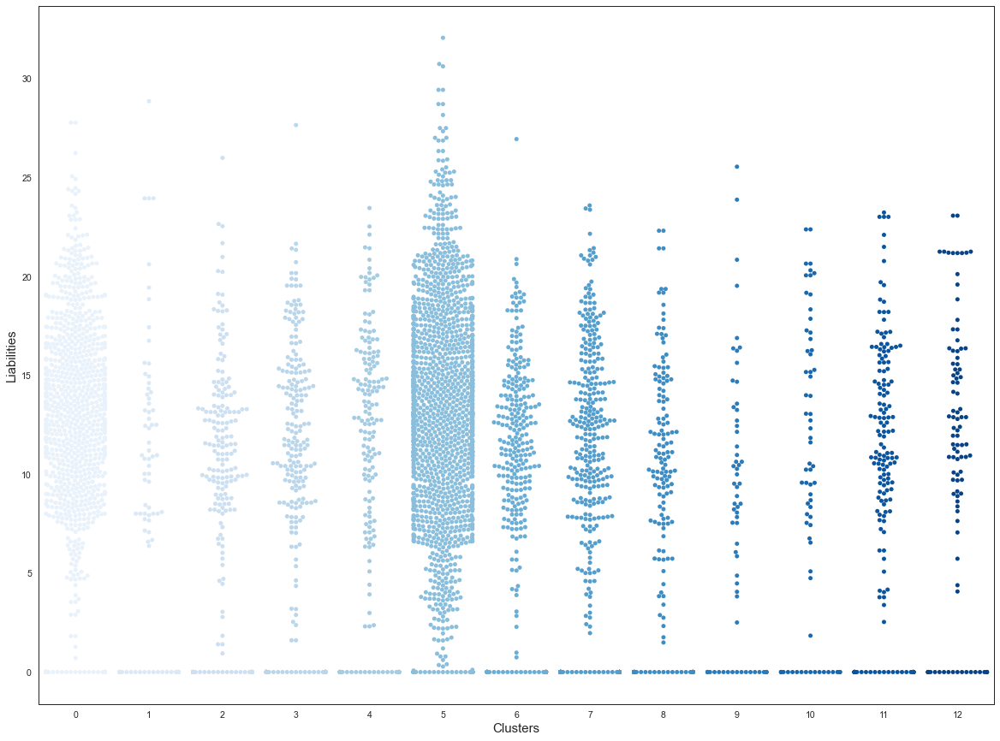

In [189]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_zero, x="Cluster_k_PCA", y="liabilities",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Liabilities', fontsize = 15)

plt.show()

#### Distribution of Non-Financial Features   <a class="anchor" id="8"></a>

Next we depict the most important non-financial features. These provide a different angle to understand the types of clients present within the clusters

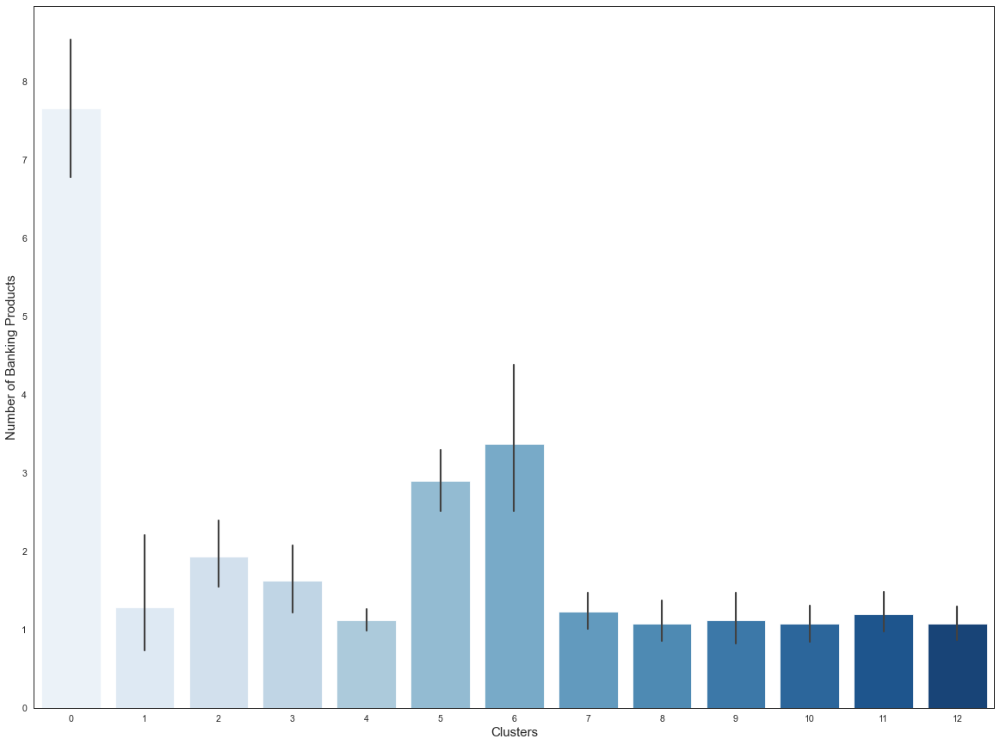

In [190]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


# create the barplot and set the font

j= sns.barplot(x ='Cluster_k_PCA', y ='banking_products', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Banking Products', fontsize = 15)

plt.show()



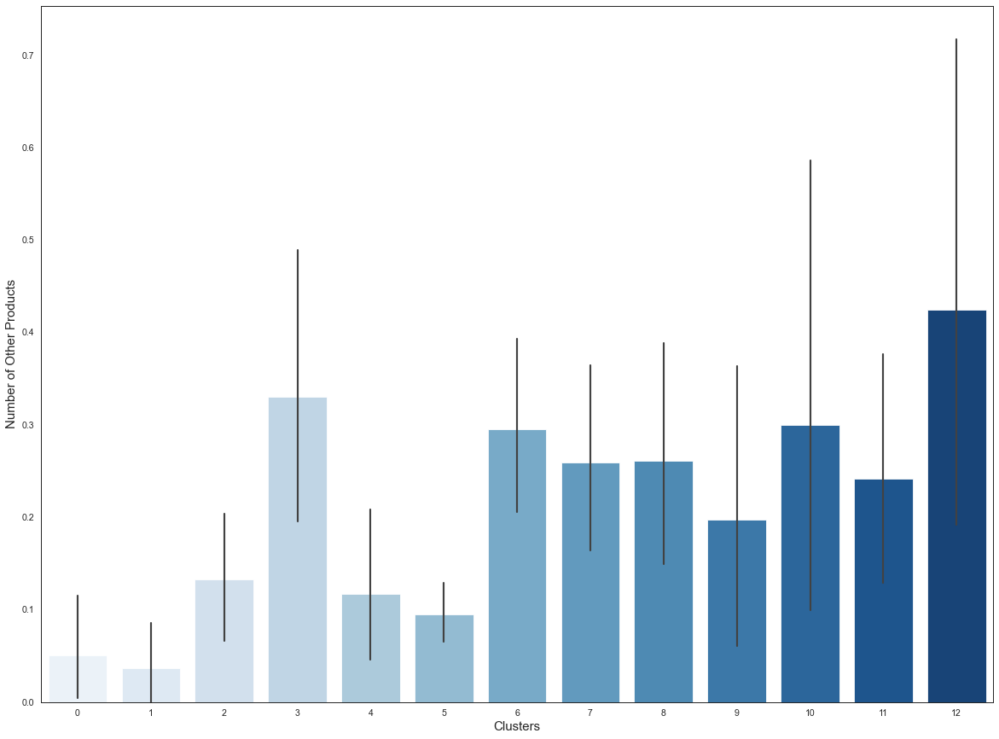

In [191]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_k_PCA', y ='other_products', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Other Products', fontsize = 15)

plt.show()

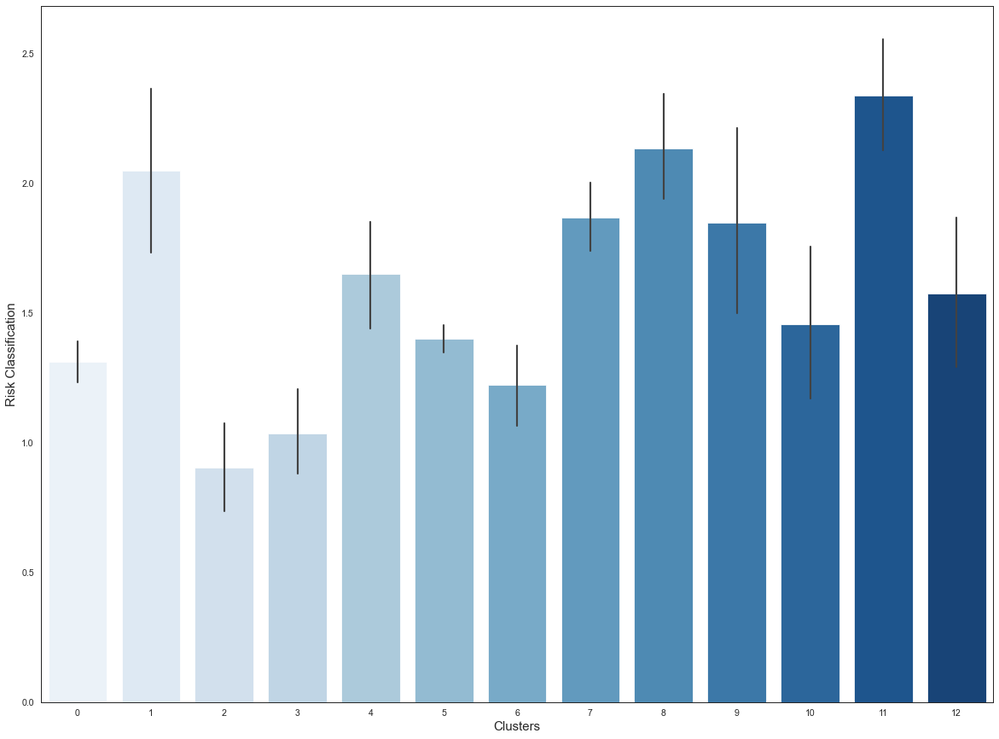

In [192]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


# create the barplot and set the font

j= sns.barplot(x ='Cluster_k_PCA', y ='risk', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Risk Classification', fontsize = 15)

plt.show()

### Nonzero Dataset    <a class="anchor" id="9"></a>

Next we consider the Fuzzy C-Means model on the nonzero dataset. This model also performed extremely well, segmenting a very large dataset in 11 categories. Furthermore, the model maintained very high scores for intra-cluster difference, suggesting that despite the very densely distributed categories, the algorithm was very efficient in selecting the clients.

#### Fuzzy C-Means

Foremost we hypertune the model and identify the optimal number of clusters through the adoption of the Silhouette Score.

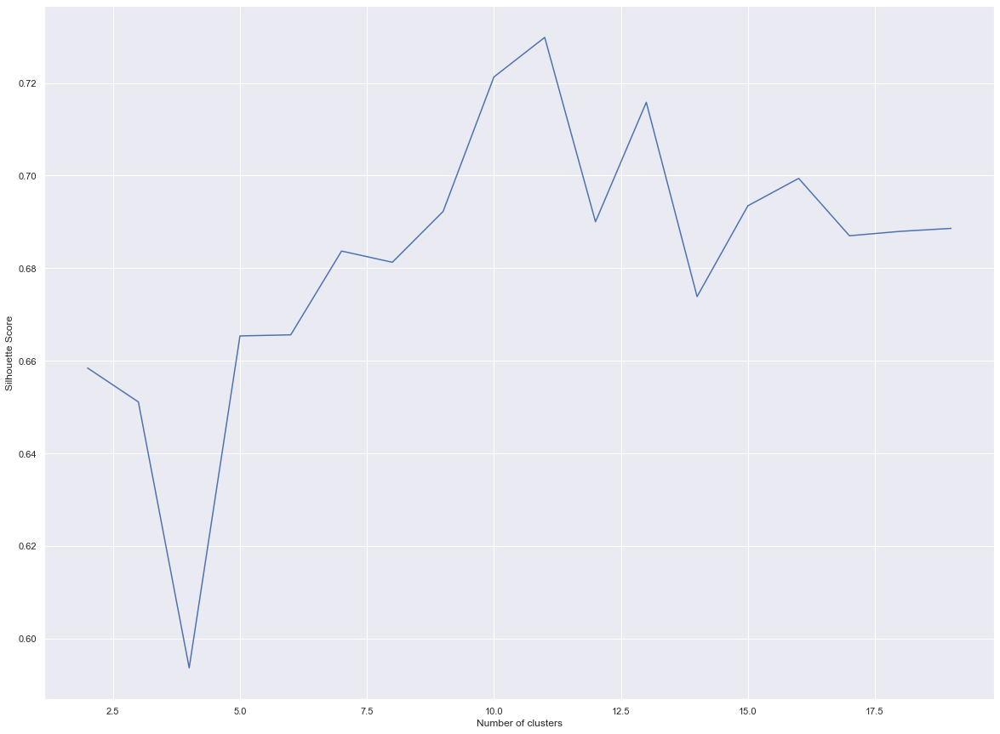

In [193]:
plt.figure(figsize=(20,15))

results = {}
for i in range(2,20):
    m = FCM(n_clusters=i, m=2.0, random_state=9)
    labelss = m.fit(PCA_nonzero)
    labels = m.predict(PCA_nonzero)
    sil_index = silhouette_score(PCA_nonzero, labels)
    results.update({i: sil_index})
    
plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

In [194]:
# we define the model and the respective parameters

fcm_PCA_nonzero_25 = FCM(n_clusters=11, m=2.0, max_iter=1000, random_state=9)

# Fit the function to the zero dataset and retrieve the labels

fcm_PCA_nonzero_25.fit(PCA_nonzero)

labelss25_PCA = fcm_PCA_nonzero_25.predict(PCA_nonzero)

# Assign the labels to the respective rows and further view the cluster segmentation 

final_nonzero["Cluster_f25"] = labelss25_PCA
tra_nonzero["Cluster_f25"] = labelss25_PCA

nonzero_df["Cluster_f25"] = labelss25_PCA
print('Values for when m = 2.5')
print('\n')
print(nonzero_df['Cluster_f25'].value_counts())

Values for when m = 2.5


2     2641
7     2093
10    1830
6     1510
0     1384
9      883
1      794
3      786
4      763
5      708
8      415
Name: Cluster_f25, dtype: int64


In [195]:
print('The PCA performance scores are the following: \n' )
print('M: 2.0')
print('Silhouette: ' + str(silhouette_score(PCA_nonzero, labelss25_PCA, metric='euclidean')))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(PCA_nonzero, labelss25_PCA)))
print('Davies Bouldin: ' + str(davies_bouldin_score(PCA_nonzero, labelss25_PCA)))

The PCA performance scores are the following: 

M: 2.0
Silhouette: 0.7298449543841496
Calinski Harabasz: 236808.48191542868
Davies Bouldin: 0.38441522730652283


#### Visualisation  <a class="anchor" id="10"></a>

We then plot the results in a two and three dimensional plot utilising Principal Component Analysis.

In [196]:
# we remove the clusters from a new dataset

tt = tra_nonzero.drop(columns=['Cluster_f25'])

# we create two dfs, one for 2 components and one for 3

PCs_2d = pd.DataFrame(pca_2d.fit_transform(tt))
PCs_3d = pd.DataFrame(pca_3d.fit_transform(tt))


# PC1_2d: The first component. PC2_2d: The second component, etc-

PCs_2d.columns = ["PC1_2d", "PC2_2d"]

PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

# we create a new df

tra_nonzero1=tra_nonzero.copy()

# we concatonate all dfs together to then derive visuals

tra_nonzero1 = pd.concat([tra_nonzero1,PCs_2d,PCs_3d], axis=1, join='inner')

In [197]:
# we create a new variable for each cluster in the dataset so we create two empty lists

cluster = []
idd = []

# we then create a loop to iterate through the values

for i in tra_nonzero1["Cluster_f25"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n) # for each id we create a new variable
    m = str(id_) +  ' = ' + 'tra_nonzero1[tra_nonzero1["Cluster_f25"] == ' + str(n) + ']' # we then define the variable 
    idd.append(id_) # we append its id to the list
    cluster.append(m) # we append the variable to the list

# we then create a loop to execute all of the new variables created
    
for i in cluster:
    exec(i)

    
# we create two new lists, one to contain the different PCA plots, the other to store the trace (i.e. id of the plot)
    
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
# we create a dictionary to ensure that all traces are correctly defined  
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a

# we execute the dictionary and create the individual plots  
    
for key, value in commands.items():
    exec (f'{key}={value}')            
   

In [198]:
# we retrieve all the new features

for i in l:
    print(i)

tracecluster_2
tracecluster_7
tracecluster_10
tracecluster_6
tracecluster_0
tracecluster_9
tracecluster_1
tracecluster_3
tracecluster_4
tracecluster_5
tracecluster_8


In [199]:
# we set a title for the graph

title = "Visualizing Clusters in Two Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_0,
tracecluster_3,
tracecluster_10,
tracecluster_2,
tracecluster_6,
tracecluster_9,
tracecluster_5,
tracecluster_1,
tracecluster_4,
tracecluster_8,
tracecluster_7]), layout = layout)

pyo.iplot(fig)

# we save the dataset

#fig.write_image("Kmeans_orig_2_N.png", scale=2)

In [200]:
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter3d(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], z =' + i + '["PC3_3d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}')     

In [201]:
for i in l:
    print(i)

tracecluster_2
tracecluster_7
tracecluster_10
tracecluster_6
tracecluster_0
tracecluster_9
tracecluster_1
tracecluster_3
tracecluster_4
tracecluster_5
tracecluster_8


In [202]:
# we set a title for the graph

title = "Visualizing Clusters in Three Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_0,
tracecluster_3,
tracecluster_10,
tracecluster_2,
tracecluster_6,
tracecluster_9,
tracecluster_5,
tracecluster_1,
tracecluster_4,
tracecluster_8,
tracecluster_7]), layout = layout)

pyo.iplot(fig)

# we save the dataset

#fig.write_image("Kmeans_orig_3_N.png", scale=2)

The segmentation amongst the features of the nonzero dataset is even more prominent than that of the zero dataset. Within both two and three dimensional plots the clients are segmented extremely well with very few outliers scattered around. N.B. the images can be found under the Github branch PCA Fuzzy C-Means.

#### Customer Distribution  <a class="anchor" id="11"></a>

In [203]:
# we select the most important features

feat_2 = ['legal', 'volume', 'loans_utilized', 'liabilities',
       'bank_liabilities', 'pl','banking_products', 'other_products',
       'new_commission_income', 'new_cmib', 'year', 'risk', 'postcode',
       'size','Cluster_f25']

# we depict the clusters and their averages per feature 

desc_2 = nonzero_df[feat_2].groupby('Cluster_f25').mean().T
desc_2.iloc[:,:7]    

Cluster_f25,0,1,2,3,4,5,6
legal,10.645954,8.648615e+00,8.383188e+00,1.439567e+01,9.568807e+00,1.565113e+01,8.386093e+00
volume,127185.038923,1.839576e+05,2.803639e+05,4.984706e+05,2.404736e+05,4.130357e+05,2.513345e+05
loans_utilized,90888.955903,1.121925e+05,1.514686e+05,2.092515e+05,1.804085e+05,1.837363e+05,1.749290e+05
liabilities,95221.166568,5.320489e+04,2.023376e+05,2.265425e+05,8.945303e+04,1.313082e+05,1.682064e+05
bank_liabilities,90127.742775,4.807327e+04,1.963089e+05,2.216333e+05,8.519798e+04,1.274548e+05,1.611769e+05
pl,711812.845669,2.043393e+06,3.488018e+06,7.776810e+06,2.331195e+06,1.708946e+06,4.873817e+06
banking_products,3.491329,3.428212e+00,3.970087e+00,3.554707e+00,3.399738e+00,3.716102e+00,3.831788e+00
other_products,0.793353,6.498741e-01,5.554714e-01,4.605598e-01,4.823067e-01,4.463277e-01,7.145695e-01
new_commission_income,428.322789,5.500042e+02,6.894046e+02,8.619630e+02,8.684580e+02,8.785031e+02,5.279851e+02
new_cmib,1701.612240,3.588196e+03,3.251321e+03,6.150380e+03,6.894199e+03,5.169032e+03,4.651224e+03


The difference in averages is naturally less prominent within this dataset, given by the vast size of observations contained within each segment. Nonetheless, the models do an excellent job in separating clusters with average low values for each feature (i.e. 1 and 6) from clusters with extremely high values (i.e. 5 and 3). Once again, this proves that the application of clusters within a corporate enviornment is highly feasible.

<br>
<br>

##### Distribution of Financial Features   <a class="anchor" id="12"></a>

Next we observe the distribution of the financial features within the clusters. Contrary to the prior dataset, the nonzero dataset contains volume. This is the most significant value for a firm, indicating the utilization of credit products by clients.

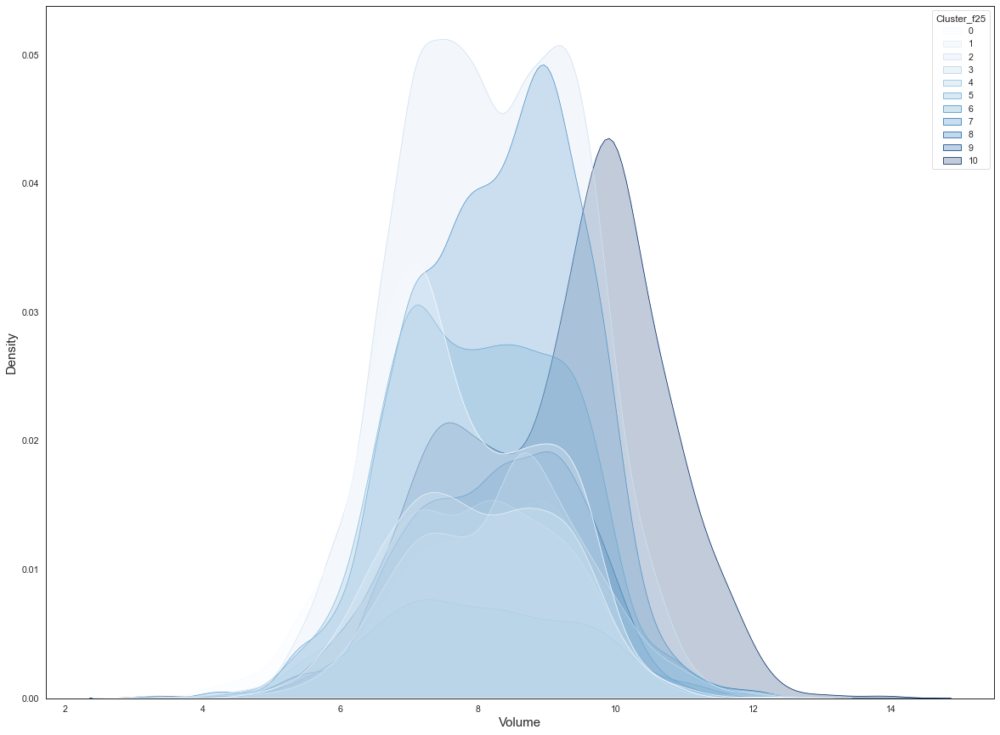

In [204]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_nonzero, x="volume", hue="Cluster_f25", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Volume', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

#plt.savefig('Volume_fuzzy.png', dmi=1200)

plt.show()

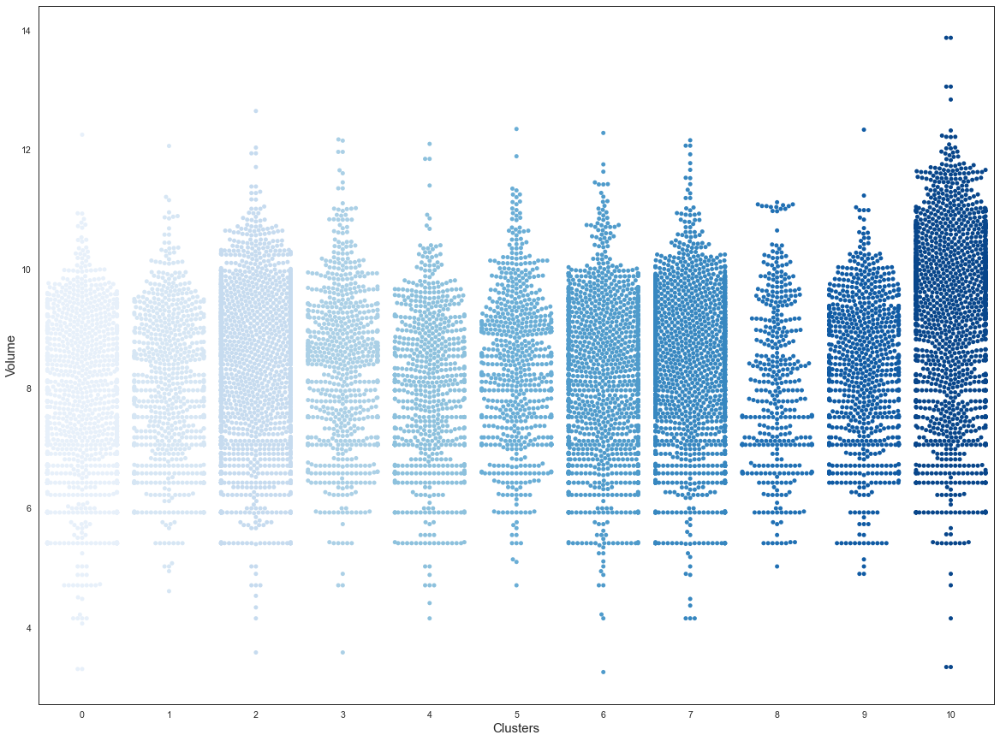

In [205]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_nonzero, x="Cluster_f25", y="volume",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Volume', fontsize = 15)

#plt.savefig('Volume_fuzzy2', dmi=1200)

plt.show()

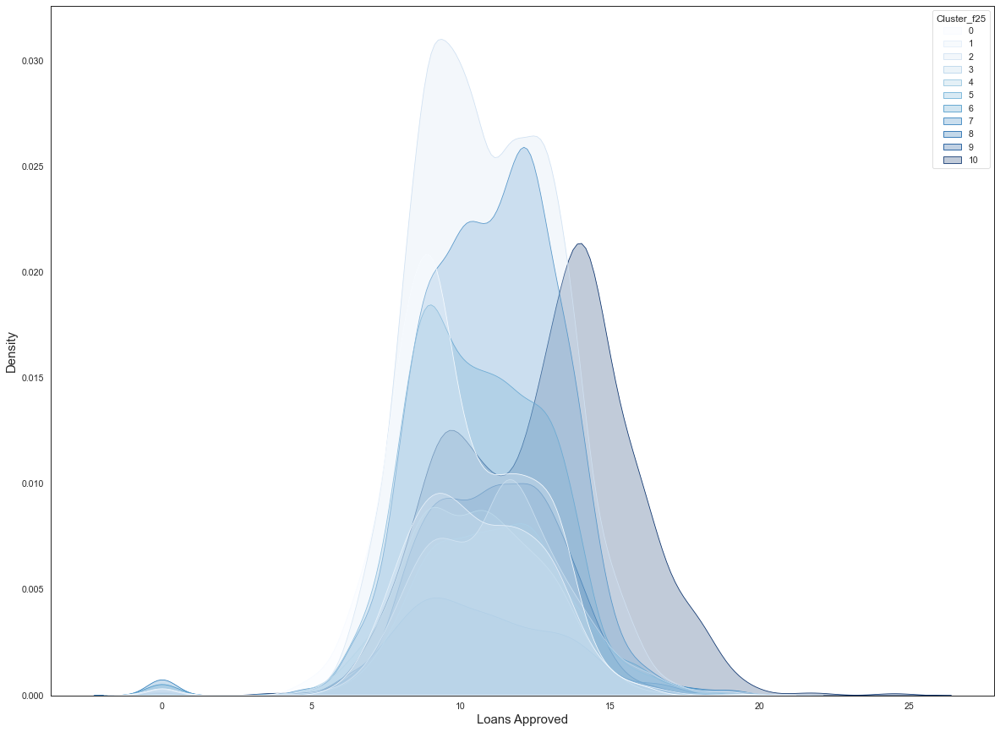

In [206]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_nonzero, x="loans_approved", hue="Cluster_f25", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Loans Approved', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

plt.show()

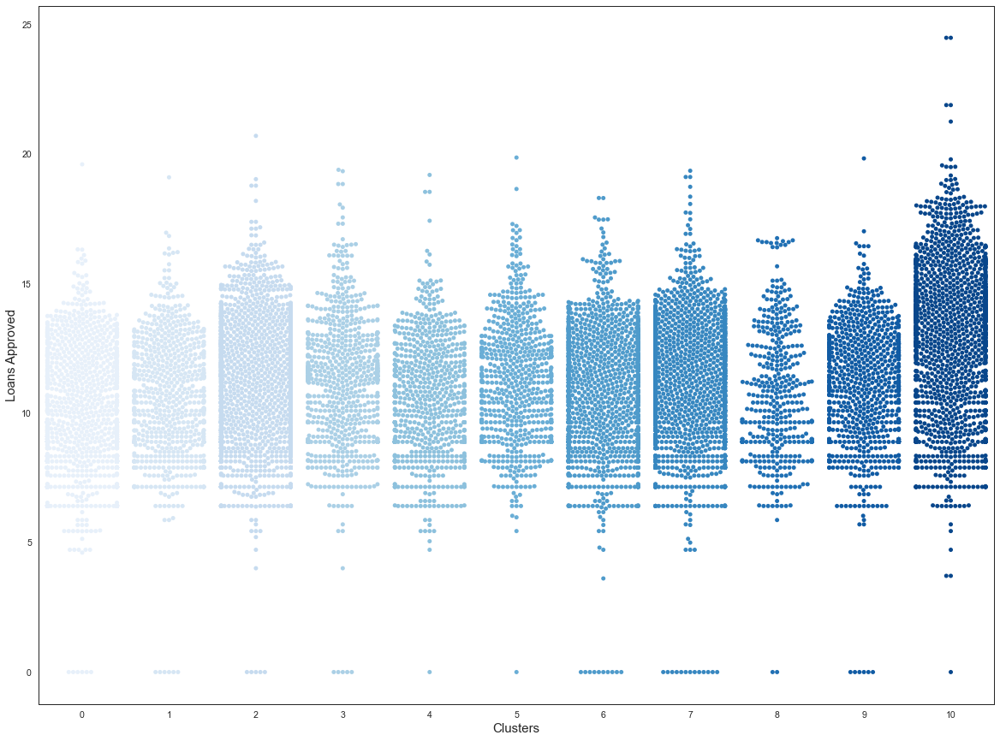

In [207]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_nonzero, x="Cluster_f25", y="loans_approved",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Loans Approved', fontsize = 15)

plt.show()

##### Distribution of Non-Financial Features <a class="anchor" id="13"></a>

Next we assess the non-financial features to complement the financial analysis and identify further intra-cluster differences

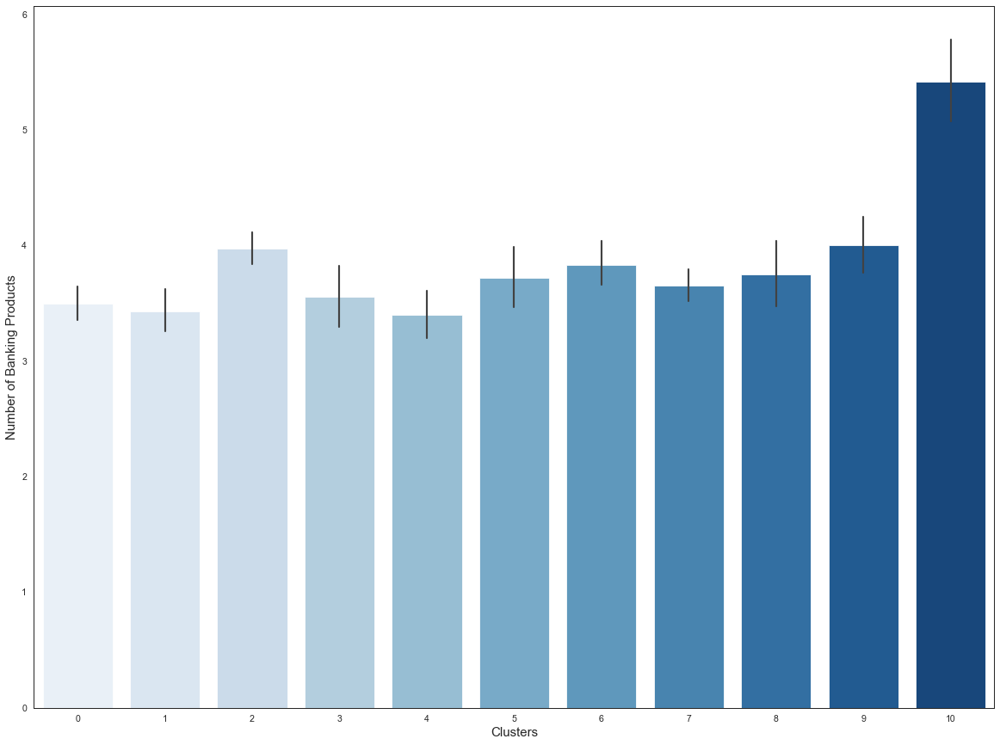

In [208]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_f25', y ='banking_products', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Banking Products', fontsize = 15)

plt.show()

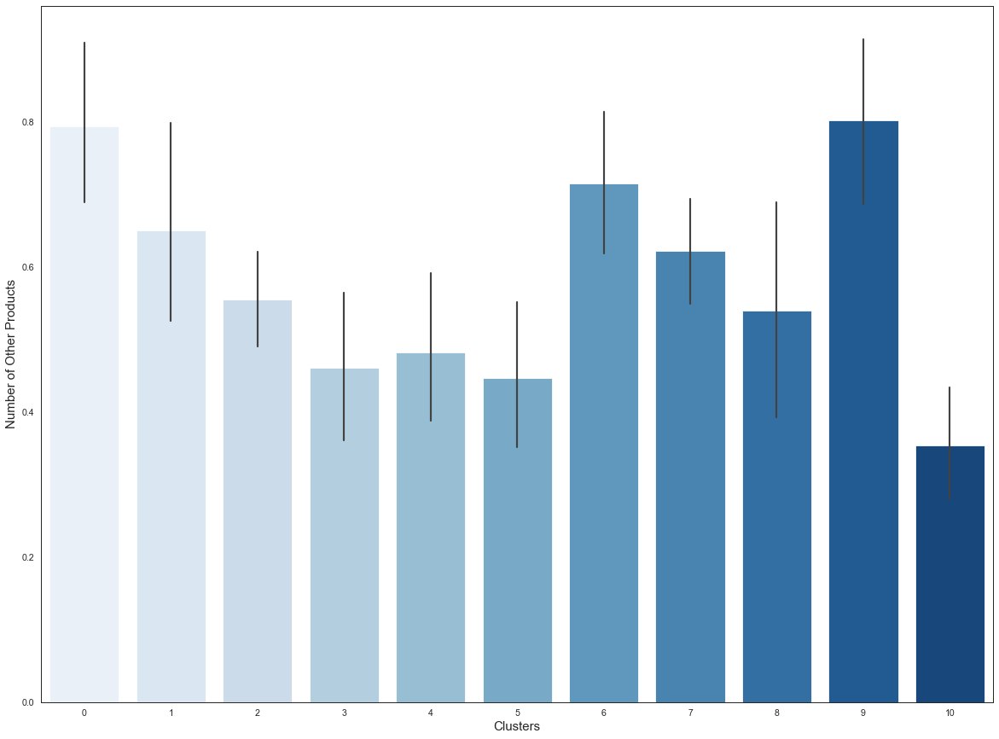

In [209]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_f25', y ='other_products', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Other Products', fontsize = 15)

plt.show()

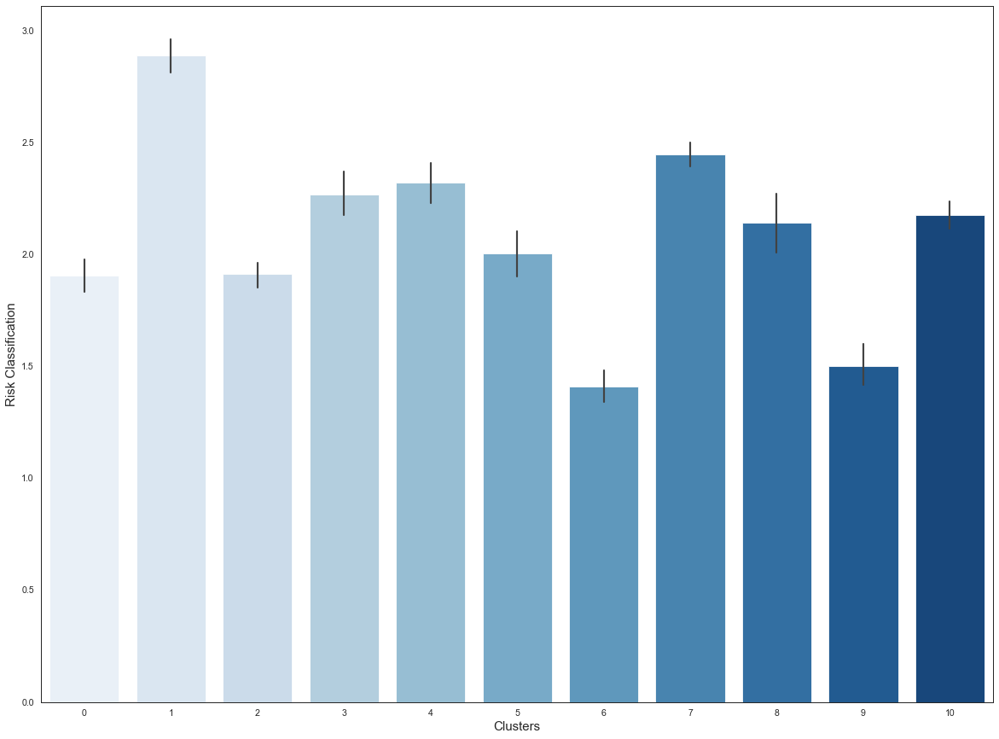

In [210]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_f25', y ='risk', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Risk Classification', fontsize = 15)

plt.show()

## Summary of Results

Both algorithms are capable of segmenting the clients quite efficiently while maintaing a high level of generalisability. As demonstrated by the averages of the clusters of the different models, K-Means does a superior job in diversifying the segments, however, this is also due to the lower number of observations contained within the dataset. When it comes to the financial features, K-Means is not fully capable of classiying clients based on the different levels of P&L. While it does recognize a few peaks in the distributions, most of the points are located in proximity. This entails that the algorithm should not be adopted for the classification of clients for the purpose of financial product developmnet. Nonetheless K-Means does an excellent job at identifying different product demands per cluster and different risk levels within the clusters. Fuzzy C-Means, on the other hand, is capable of doing a better job indiscerning amongst clients with different levels of volume, especially with loans approved. Specifically, it does recognise different distirbutions which is quite surprising. Nonetheless, the distirbutions are all still very close, entailing that Fuzzy C-Means should also not be used for product development. When observing the distribution of product demand and risk, Fuzzy C-Means does an exceptional job in recognizing inherent differences in the clusters, just like K-Means. This thus entails that the algorithms should be adopted for the purposes of marketing and customer experiences rather than financial processes. Specifically, by discerning between client product demands and risk levels, the alogorithms can design improved marketing campaings and customer journeys, improvinf the overall efficiency of the bank.

## UMAP Models <a class="anchor" id="14"></a>

Next we observe the models that were adopted on a UMAP reduced dataset, namely Agglomerative Clustering and FasterPAM.

Foremost we have to reduce the dimensions adopting a UMAP technique to vsualise the models. <br>

In [211]:
# we define the UMAP algorithm

um = UMAP.UMAP(n_neighbors=100, n_components=2, metric='euclidean', 
               n_epochs=1000, learning_rate=1.0, init='random', 
               min_dist=0.1, spread=1.0)

# Zero Dataset
# we apply UMAP to the zero dataset

U_zero = um.fit_transform(final_zero)

# Nonzero Dataset
# we apply UMAP to the zero dataset

U_nonzero = um.fit_transform(final_nonzero)

In [212]:
# We select a UMAP with two components to visualise the clusters

umm_2d = UMAP.UMAP(n_components=2)

### Zero Dataset <a class="anchor" id="15"></a>

#### HAC

Foremost we consider the first model, HAC, which was applied on a zero dataset. This model provided greater data-specificity than the K-Means model, by selecting a higher number of clusters (i.e. 19). Depsite greater diversity within the segments, the model depicted extremely robust results.

Next we hypertune the model and identify the optimal number of clusters through the adoption of the Silhouette Score.

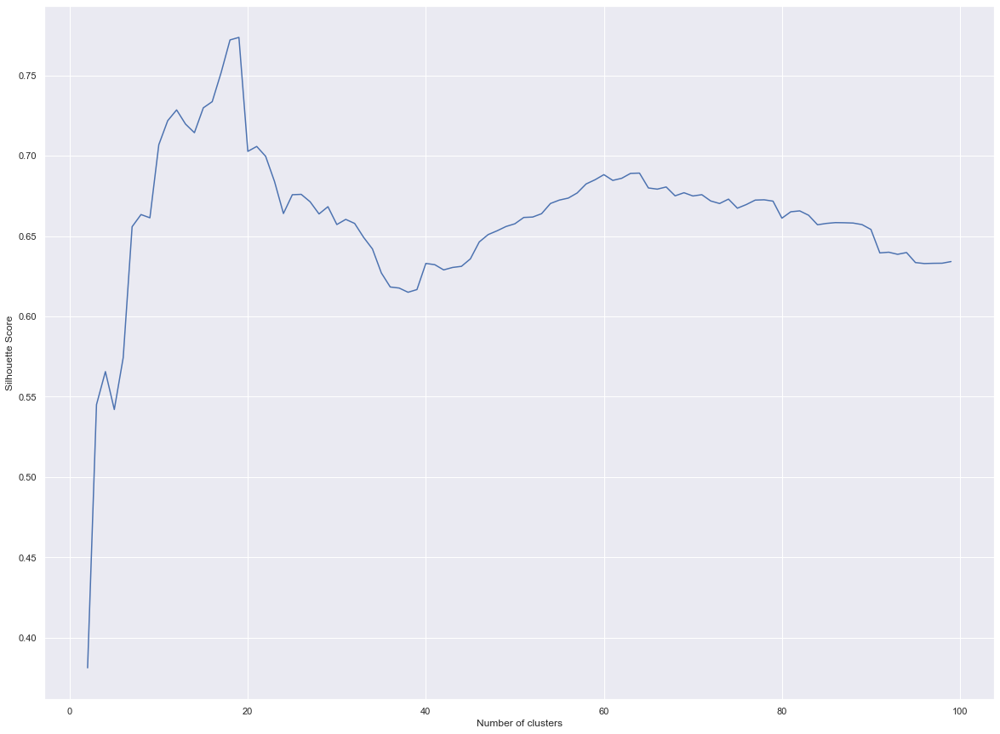

In [213]:
plt.figure(figsize=(20,15))

results = {}
for i in range(2,100):
    m = AgglomerativeClustering(n_clusters = i, affinity = 'euclidean', linkage ='average')
    labelss = m.fit(U_zero)
    labels = m.labels_
    sil_index = silhouette_score(U_zero, labels)
    results.update({i: sil_index})
    
plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

In [214]:
# set the model and the respective parameters

hc_U_zero = AgglomerativeClustering(n_clusters = 19, affinity = 'euclidean', linkage ='average')

# Fit the function to the UMAP zero dataset

hc_U_zero.fit(U_zero)

# Assign the labels to the respective rows and further view the cluster segmentation 

final_zero['Cluster_h_U'] = hc_U_zero.labels_
tra_zero['Cluster_h_U'] = hc_U_zero.labels_

zero_df["Cluster_h_U"] = hc_U_zero.labels_
print('Distribution of Clusters: \n')
print(zero_df['Cluster_h_U'].value_counts())

Distribution of Clusters: 

0     1218
6      559
3      415
2      384
8      362
14     358
4      347
5      345
1      283
7      204
15     164
16     139
10     104
11      69
9       67
12      61
13      45
17      43
18      19
Name: Cluster_h_U, dtype: int64


In [215]:
print('The UMAP performance scores are the following: \n' )
print('Silhouette: ' + str(silhouette_score(U_zero, hc_U_zero.labels_ , metric='euclidean')))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(U_zero, hc_U_zero.labels_ )))
print('Davies Bouldin: ' + str(davies_bouldin_score(U_zero, hc_U_zero.labels_)))

The UMAP performance scores are the following: 

Silhouette: 0.77368426
Calinski Harabasz: 35375.088081112444
Davies Bouldin: 0.2620658689841576


As can be seen the results in the original notebook are higher bu 0.01. Once again, this might be due to the application of UMAP. Nonetheles the results still portray good quality clusters. The next step is to visualise the clusters to determine their density.

#### Visualisation <a class="anchor" id="16"></a>

In [216]:
tt = tra_zero.drop(columns=['Cluster_h_U'])

U_2d = pd.DataFrame(umm_2d.fit_transform(tt))


# U1_2d: The first component by UMAP
# U2_2d: The second component by UMAP


U_2d.columns = ["U1_2d", "U2_2d"]


tra_zero1=tra_zero.copy()

tra_zero1 = pd.concat([tra_zero1, U_2d], axis=1, join='inner')

In [217]:
cluster = []
idd = []
for i in tra_zero1["Cluster_h_U"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n)
    m = str(id_) +  ' = ' + 'tra_zero1[tra_zero1["Cluster_h_U"] == ' + str(n) + ']'
    idd.append(id_)
    cluster.append(m)
    
for i in cluster:
    exec(i)

nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["U1_2d"], y =' + i + '["U2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)

commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}')            

In [218]:
for i in l:
    print(i)

tracecluster_0
tracecluster_6
tracecluster_3
tracecluster_2
tracecluster_8
tracecluster_14
tracecluster_4
tracecluster_5
tracecluster_1
tracecluster_7
tracecluster_15
tracecluster_16
tracecluster_10
tracecluster_11
tracecluster_9
tracecluster_12
tracecluster_13
tracecluster_17
tracecluster_18


In [219]:
layout = dict(
              xaxis= dict(title= 'U1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'U2',ticklen= 5,zeroline= False)
             )

fig = go.Figure(dict(data = [tracecluster_2,
tracecluster_0,
tracecluster_1,
tracecluster_16,
tracecluster_4,
tracecluster_6,
tracecluster_7,
tracecluster_18,
tracecluster_5,
tracecluster_10,
tracecluster_11,
tracecluster_13,
tracecluster_3,
tracecluster_17,
tracecluster_8,
tracecluster_15,
tracecluster_14,
tracecluster_9,
tracecluster_12], layout = layout))

pyo.iplot(fig)

#fig.write_image("HAC.png", scale= 2)

While the colors do not make the graph easy to interpret, the clusters are still visible and apperently well separated within the two dimensional plot. N.B. the figures can be found in the Github branch UMAP HAC.

#### Customer Distribution  <a class="anchor" id="17"></a>

In [220]:
# # we select random clusters to check their averages

# random.sample(range(0, 18),7)

In [221]:
# we select important features to determine their resepctive averages

feat_3 = ['legal','volume_firm','loans_utilized','liabilities','bank_liabilities', 'pl',
          'banking_products', 'other_products','new_commission_income','new_cmib', 'year',
          'risk', 'postcode','size', 'Cluster_h_U']

# we group by cluster and portray the averages

desc_3 = zero_df[feat_3].groupby('Cluster_h_U', as_index = True).mean().T
desc_3[[7, 3, 10, 0, 1, 12, 11]]

Cluster_h_U,7,3,10,0,1,12,11
legal,1.919118e+01,1.486024e+01,1.098077e+01,5.911330e-02,2.359717e+01,2.950820e-01,9.130435e-01
volume_firm,5.672383e+06,4.846535e+06,5.934236e+06,1.041122e+06,2.655382e+06,1.097573e+06,2.773124e+06
loans_utilized,2.270466e+01,3.780222e+01,5.070481e+00,5.821021e+01,4.908375e+00,1.624590e-01,1.252609e+00
liabilities,1.759151e+05,4.595596e+04,5.000195e+04,2.255972e+05,1.522874e+05,2.077855e+04,1.192041e+05
bank_liabilities,1.740375e+05,4.360340e+04,5.000195e+04,2.253382e+05,1.458382e+05,1.869737e+04,1.173479e+05
pl,1.254103e+06,6.443414e+05,3.169969e+05,1.211114e+05,4.147776e+05,1.457401e+05,5.915304e+05
banking_products,1.534314e+00,1.226506e+00,4.442308e+00,3.844828e+00,1.653710e+00,1.819672e+00,6.492754e+00
other_products,9.313725e-02,2.578313e-01,0.000000e+00,3.201970e-02,4.098940e-01,2.786885e-01,3.478261e-01
new_commission_income,2.774591e+02,1.762998e+02,1.587195e+02,4.247994e+01,1.913390e+02,1.402598e+02,3.519057e+02
new_cmib,1.055709e+03,5.311882e+02,4.270778e+02,9.785269e+02,4.529520e+02,2.189902e+02,1.440420e+03


The averages seem well distributed, with different clusters having dissimiliar ranges. The first noticeable characteristic is that HAC introduces more central customers. While K-Means and Fuzzy C-MEans primarily displayed clusters with extreme values on either side of the spectrum, HAC does a better jon indiverifying cetnral clients too.

##### Distribution of Financial Features   <a class="anchor" id="18"></a>

Now we check the distribution of financial features to determine how important financial characteristics are in the segmentations.

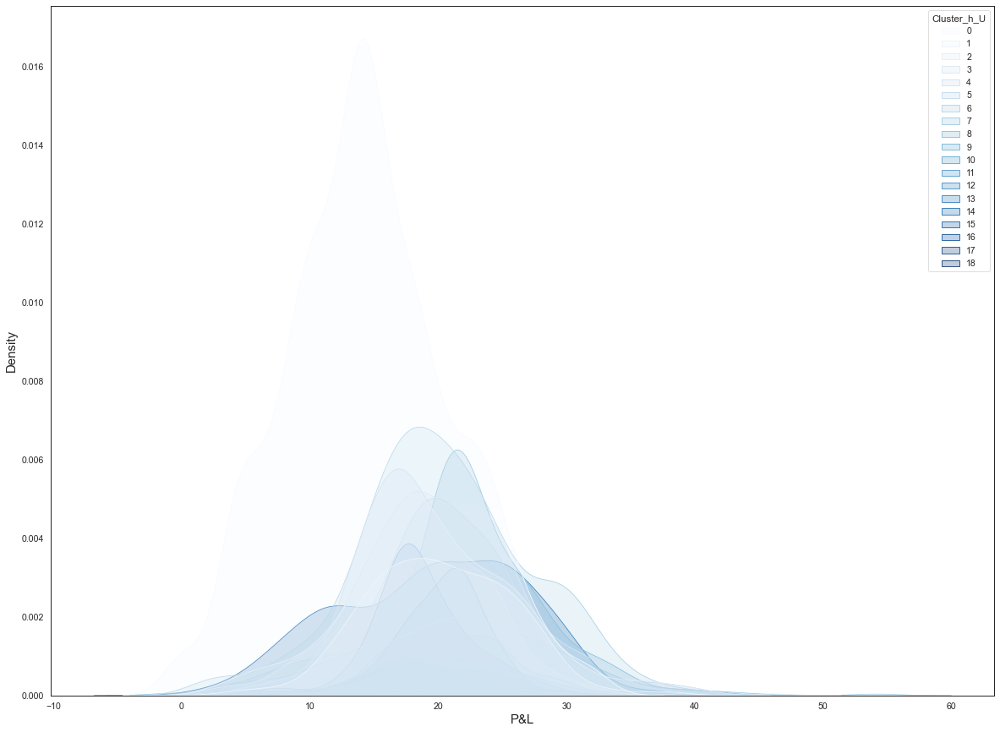

In [222]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_zero, x="pl", hue="Cluster_h_U", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('P&L', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

#plt.savefig('PL_hac.png', dmi=1200)


plt.show()

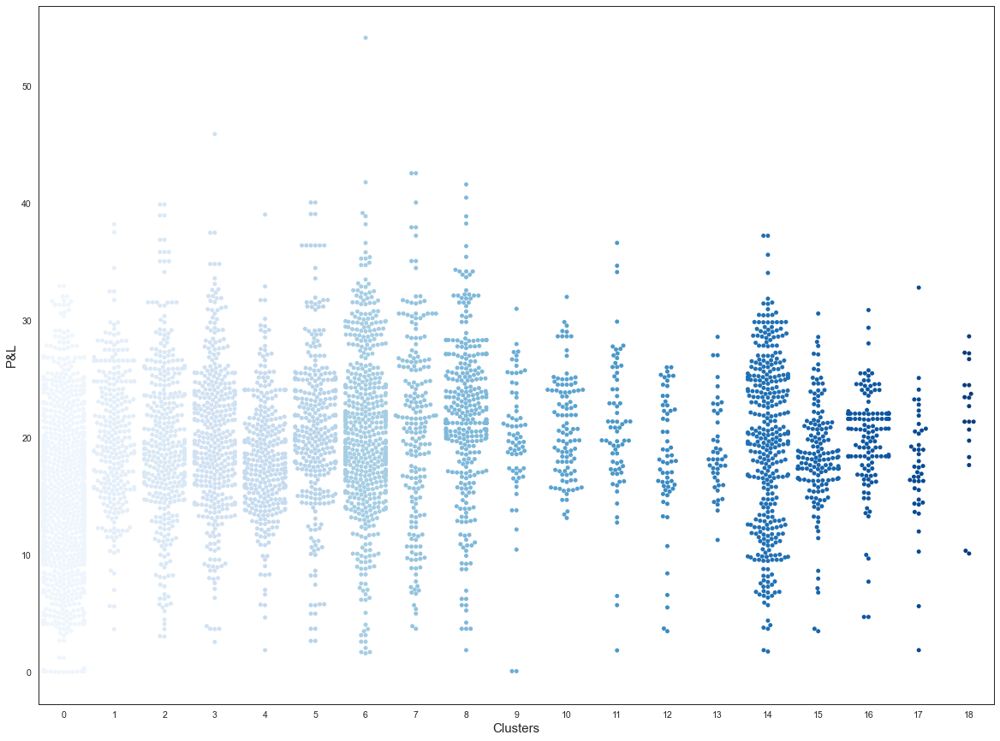

In [223]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_zero, x="Cluster_h_U", y="pl",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('P&L', fontsize = 15)

#plt.savefig('PL2_hac.png', dmi=1200)


plt.show()

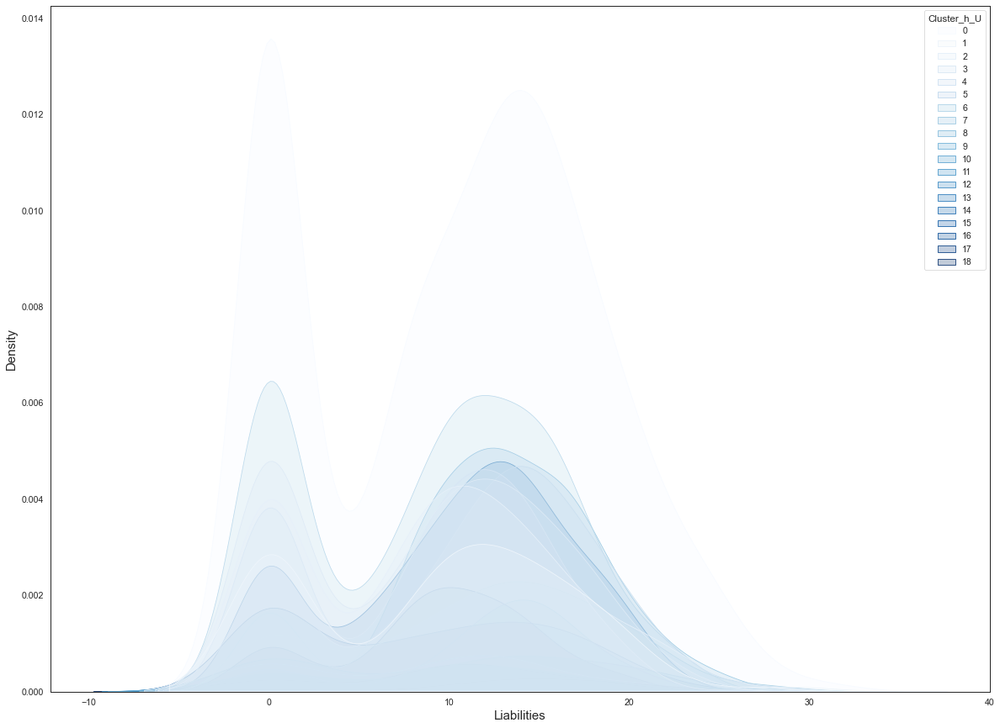

In [224]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_zero, x="liabilities", hue="Cluster_h_U", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Liabilities', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

plt.show()

#### Distribution of Non-Financial Features    <a class="anchor" id="19"></a>

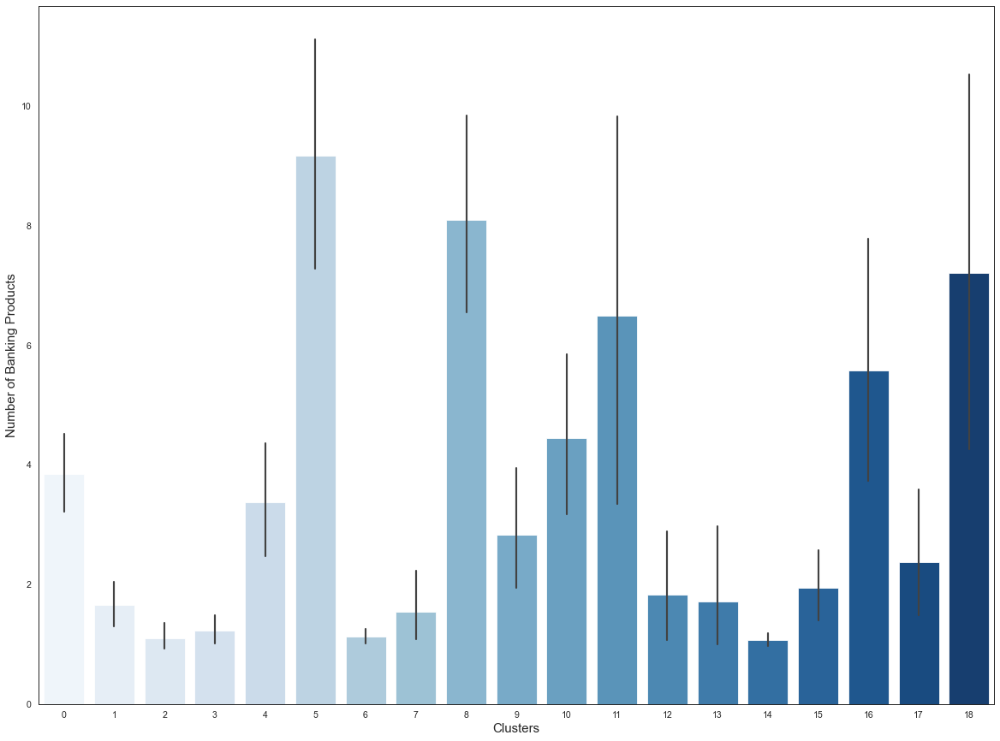

In [225]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_h_U', y ='banking_products', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Banking Products', fontsize = 15)

plt.show()



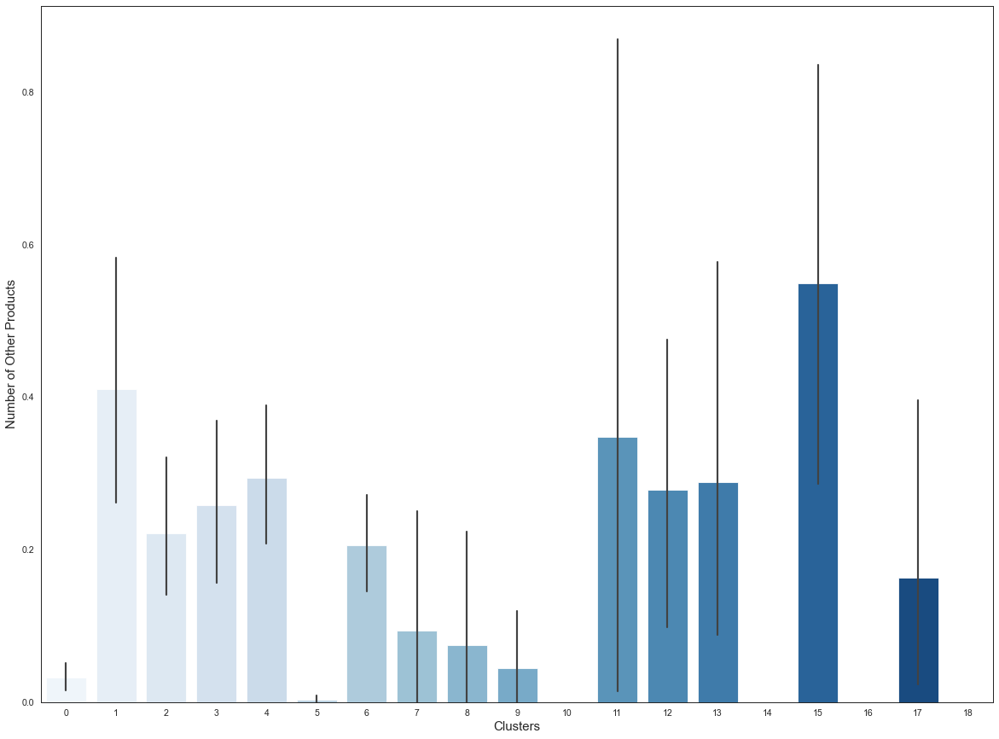

In [226]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_h_U', y ='other_products', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Other Products', fontsize = 15)

plt.show()

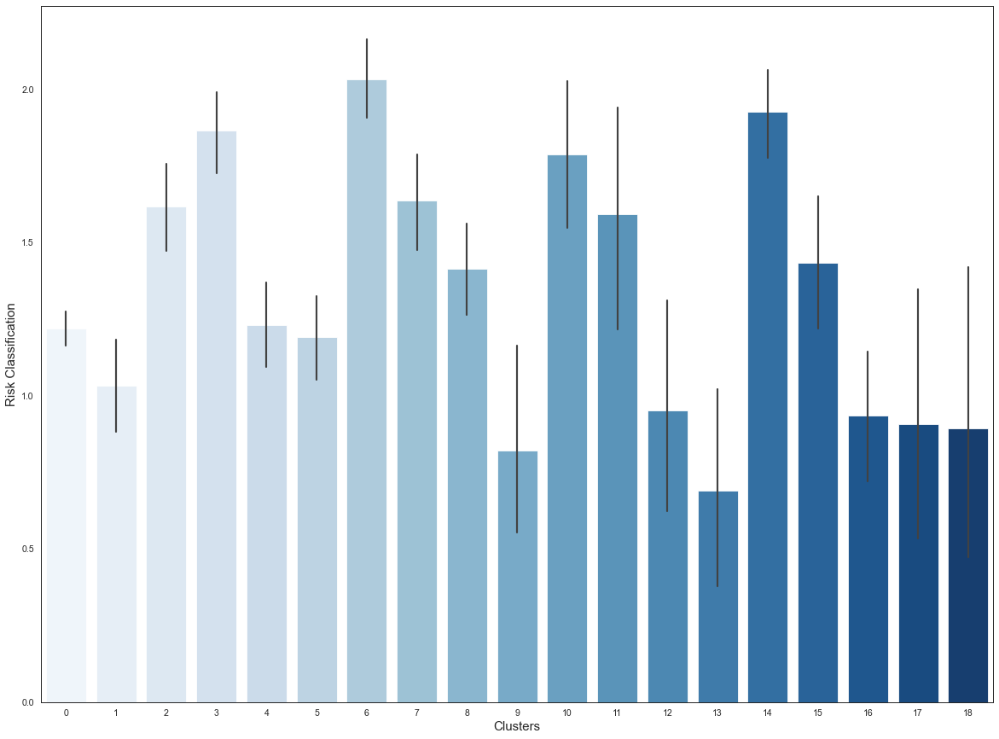

In [227]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_h_U', y ='risk', data = tra_zero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Risk Classification', fontsize = 15)

plt.show()

### Nonzero Dataset  <a class="anchor" id="19"></a>

Lastly we consider the FasterPAM algorithm. The aformentioned was extremely robust in diversifying amongst clients, allowing to create 40 clusters. This high level of specificity was achieved while maintaining very strong scores for Silhouette, Calinski Harabasz and Davies Bouldin.

#### FasterPAM

In order to plot the features we must first fit the algorithm to the dataset.

In [228]:
# develop a dissimilarity matrix using minkowski for fasterpam 

mat_n = pairwise_distances(U_nonzero, metric='minkowski')

Next we hypertune the model and identify the optimal number of clusters through the adoption of the Silhouette Score.

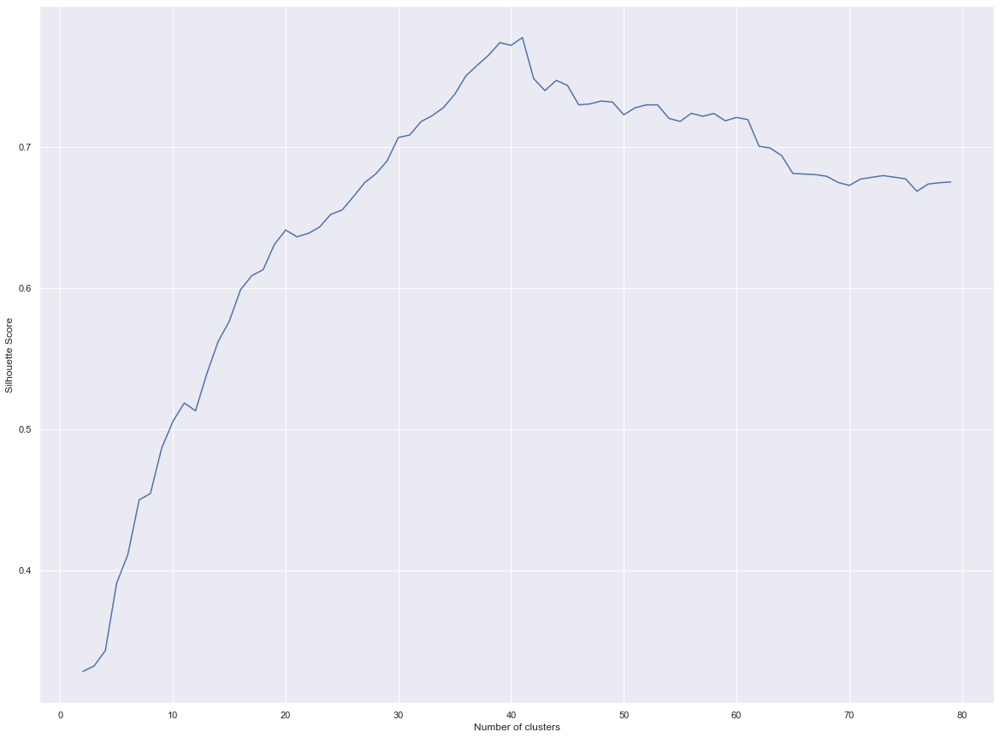

In [229]:
plt.figure(figsize=(20,15))

results = {}
for i in range(2,80):
    m = fasterpam(mat_n , medoids = i, max_iter = 2000, init ='random', random_state=9)
    labels = m.labels
    sil_index = silhouette_score(mat_n, labels)
    results.update({i: sil_index})
    
plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

Within this notebook, the most efficient result is that of implementing 41 clusters. However, the dissertation suggests implementing 40 clusters. This is because the original Notebooks suggest 41 as the most optimal number.This discrepancy might be due to how UMAP applies transformations within the dataset. Nonetheless, it can be argued that there is little difference between the two choices. As a result this notebook will use 40 clusters for illustrative purposes.

In [230]:
# we define the function for K-Modes

fast_nonzero_U = fasterpam(mat_n, medoids = 40, max_iter = 2000, init ='random', random_state = 9)


# Assign the labels to the respective rows and further view the cluster segmentation 

final_nonzero['Cluster_fast_U'] = fast_nonzero_U.labels

tra_nonzero['Cluster_fast_U'] = fast_nonzero_U.labels

nonzero_df["Cluster_fast_U"] = fast_nonzero_U.labels

print('Distribution of Clusters: \n')
print(nonzero_df['Cluster_fast_U'].value_counts())

Distribution of Clusters: 

24    976
17    744
7     653
14    598
1     557
18    543
33    523
35    484
28    479
16    474
5     472
21    402
23    400
9     398
0     383
30    382
36    381
6     349
4     318
38    311
2     298
10    275
3     264
13    262
34    262
37    256
26    250
27    232
39    218
11    216
32    206
31    188
29    173
15    151
12    145
8     143
22    131
20    121
19    114
25     75
Name: Cluster_fast_U, dtype: int64


In [231]:
print('The UMAP performance scores are the following: \n' )
print('Silhouette: ' + str(silhouette_score(U_nonzero, fast_nonzero_U.labels , metric='euclidean')))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(U_nonzero, fast_nonzero_U.labels)))
print('Davies Bouldin: ' + str(davies_bouldin_score(U_nonzero, fast_nonzero_U.labels)))

The UMAP performance scores are the following: 

Silhouette: 0.7652388
Calinski Harabasz: 108935.53370566665
Davies Bouldin: 0.3340828370210838


#### Visualisation  <a class="anchor" id="21"></a>

Next we depict the clusters in a two dimensional plot in order to see their distributions.

In [232]:
tt = tra_nonzero.drop(columns=['Cluster_fast_U'])

U_2d = pd.DataFrame(umm_2d.fit_transform(tt))


# U1_2d: The first component by UMAP
# U2_2d: The second component by UMAP


U_2d.columns = ["U1_2d", "U2_2d"]


tra_nonzero1=tra_nonzero.copy()

tra_nonzero1 = pd.concat([tra_nonzero1, U_2d], axis=1, join='inner')

In [233]:
cluster = []
idd = []
for i in tra_nonzero1["Cluster_fast_U"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n)
    m = str(id_) +  ' = ' + 'tra_nonzero1[tra_nonzero1["Cluster_fast_U"] == ' + str(n) + ']'
    idd.append(id_)
    cluster.append(m)
    
for i in cluster:
    exec(i)

nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["U1_2d"], y =' + i + '["U2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)

commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}') 

In [234]:
for i in l:
    print(i)

tracecluster_24
tracecluster_17
tracecluster_7
tracecluster_14
tracecluster_1
tracecluster_18
tracecluster_33
tracecluster_35
tracecluster_28
tracecluster_16
tracecluster_5
tracecluster_21
tracecluster_23
tracecluster_9
tracecluster_0
tracecluster_30
tracecluster_36
tracecluster_6
tracecluster_4
tracecluster_38
tracecluster_2
tracecluster_10
tracecluster_3
tracecluster_13
tracecluster_34
tracecluster_37
tracecluster_26
tracecluster_27
tracecluster_39
tracecluster_11
tracecluster_32
tracecluster_31
tracecluster_29
tracecluster_15
tracecluster_12
tracecluster_8
tracecluster_22
tracecluster_20
tracecluster_19
tracecluster_25


In [235]:
layout = dict(
              xaxis= dict(title= 'U1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'U2',ticklen= 5,zeroline= False)
             )

fig = go.Figure(dict(data = [tracecluster_24,
tracecluster_30,
tracecluster_33,
tracecluster_14,
tracecluster_5,
tracecluster_18,
tracecluster_7,
tracecluster_31,
tracecluster_2,
tracecluster_3,
tracecluster_19,
tracecluster_28,
tracecluster_38,
tracecluster_22,
tracecluster_17,
tracecluster_29,
tracecluster_6,
tracecluster_1,
tracecluster_36,
tracecluster_4,
tracecluster_0,
tracecluster_13,
tracecluster_23,
tracecluster_39,
tracecluster_10,
tracecluster_34,
tracecluster_32,
tracecluster_27,
tracecluster_35,
tracecluster_37,
tracecluster_20,
tracecluster_11,
tracecluster_25,
tracecluster_15,
tracecluster_21,
tracecluster_12,
tracecluster_8,
tracecluster_26,
tracecluster_16,
tracecluster_9], layout = layout))

pyo.iplot(fig)

#fig.write_image("Kmeadoids.png", scale= 2)

It can be seen that UMAP does an incredibly good job in reducing the dimensions of the dataset. Specifically it diversifies between 6 major groups and uses those to create further segmentations. Once again the color spectrum is too limited to provide an optimal visualisation but the clusters appear clearly diversifies and well densely populated. N.B. the figures can be found under the Github branch UMAP K-Medoid.

#### Customer Distribution  <a class="anchor" id="22"></a>

In [236]:
# # we select random clusters to depict cluster averages

# random.sample(range(0, 40),7)

In [237]:
# we select the most important features

feat_4 = ['legal','volume','loans_utilized', 'liabilities','bank_liabilities', 'pl', 'banking_products', 
          'other_products', 'new_commission_income','new_cmib', 'year', 'risk', 'postcode','size', 'Cluster_fast_U']

# we group by cluster and portray the averages

desc_4 = nonzero_df[feat_4].groupby('Cluster_fast_U', as_index = True).mean().T
desc_4[[33, 8, 22, 26, 6, 34, 30]]

Cluster_fast_U,33,8,22,26,6,34,30
legal,0.254302,8.741259e-01,8.854962e-01,3.030000e+01,1.893123e+01,1.098092e+01,2.004712e+01
volume,91419.948776,2.104281e+05,2.704899e+06,5.732660e+05,1.167517e+06,1.255014e+06,3.218142e+06
loans_utilized,75049.094417,1.868056e+05,6.647478e+05,2.583317e+05,5.085332e+05,1.110576e+06,2.522612e+06
liabilities,75207.306463,2.878681e+04,1.598810e+05,1.157706e+05,3.346835e+05,3.329766e+04,2.096673e+05
bank_liabilities,65461.625946,2.792682e+04,1.565871e+05,1.124843e+05,3.346835e+05,3.211154e+04,2.079565e+05
pl,289431.432948,8.119606e+06,3.504127e+05,2.033709e+06,1.902315e+07,3.469470e+05,8.692693e+06
banking_products,3.541109,4.279720e+00,4.954198e+00,3.224000e+00,3.366762e+00,4.564885e+00,6.369110e+00
other_products,0.988528,5.104895e-01,7.938931e-01,5.000000e-01,0.000000e+00,6.488550e-02,7.853403e-02
new_commission_income,317.055201,2.379678e+02,3.651751e+02,4.348176e+02,2.107246e+03,3.242452e+02,1.396044e+03
new_cmib,2421.896042,1.822201e+03,8.368423e+03,2.763830e+03,1.243767e+04,3.903237e+03,3.256580e+04


The averages in this case are more specific than those of the HAC method. Specifically, the clusters are well defined and 'central' groups are clearly visible. This indicates that the algorithm does an exceptional job in diversifying the clients of the bank. This segmentation is highly valuable because such clear differences in mean can be adopted within many processes of a bank.

##### Distribution of Financial Features <a class="anchor" id="23"></a>

Next we check the distribution of the financial features, once again volume is quite an important feature in a banking context, as a result the algorithm shall do a good job in separating clients with different credit needs.

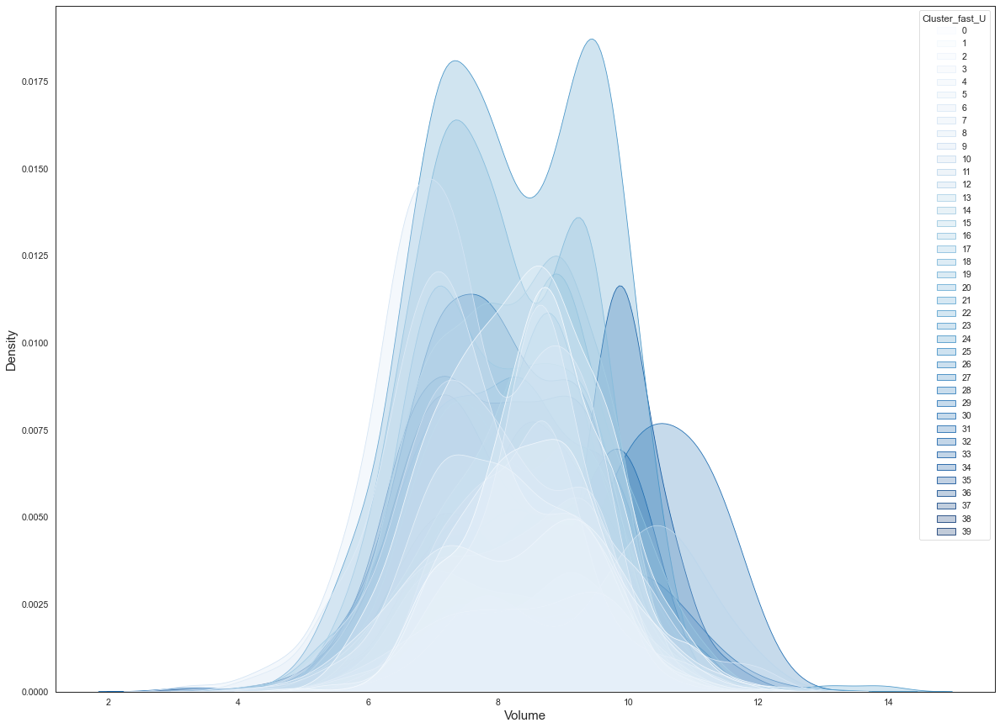

In [238]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_nonzero, x="volume", hue="Cluster_fast_U", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Volume', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

#plt.savefig('Volume_fast.png', dmi=1200)

plt.show()

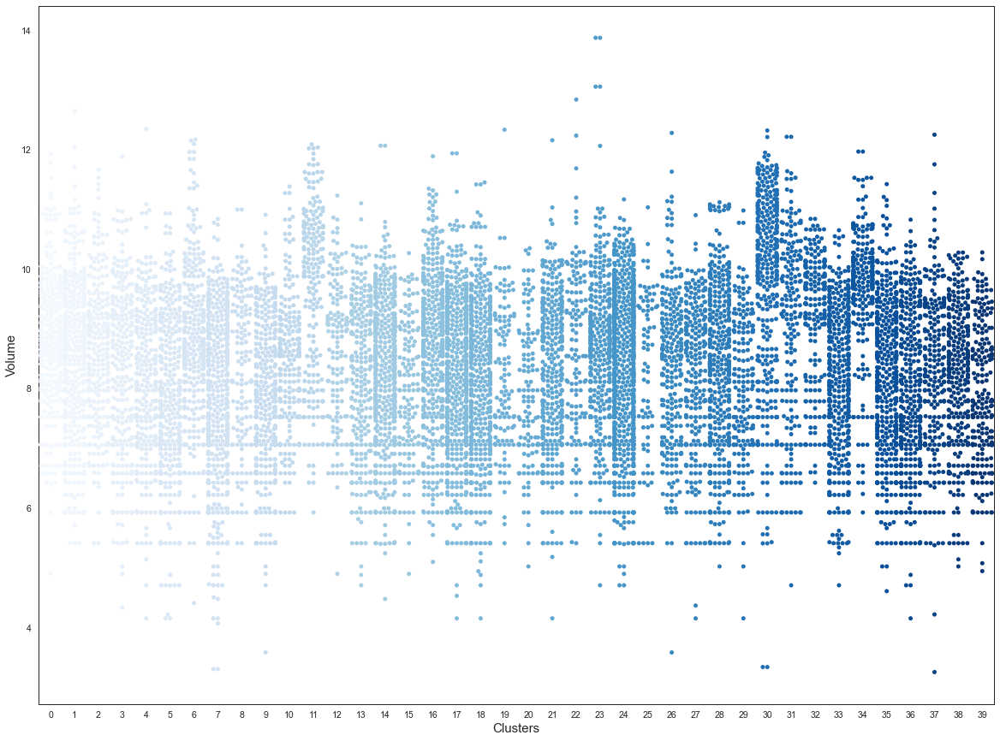

In [239]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_nonzero, x="Cluster_fast_U", y="volume",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Volume', fontsize = 15)

#plt.savefig('Volume2_fast.png', dmi=1200)

plt.show()

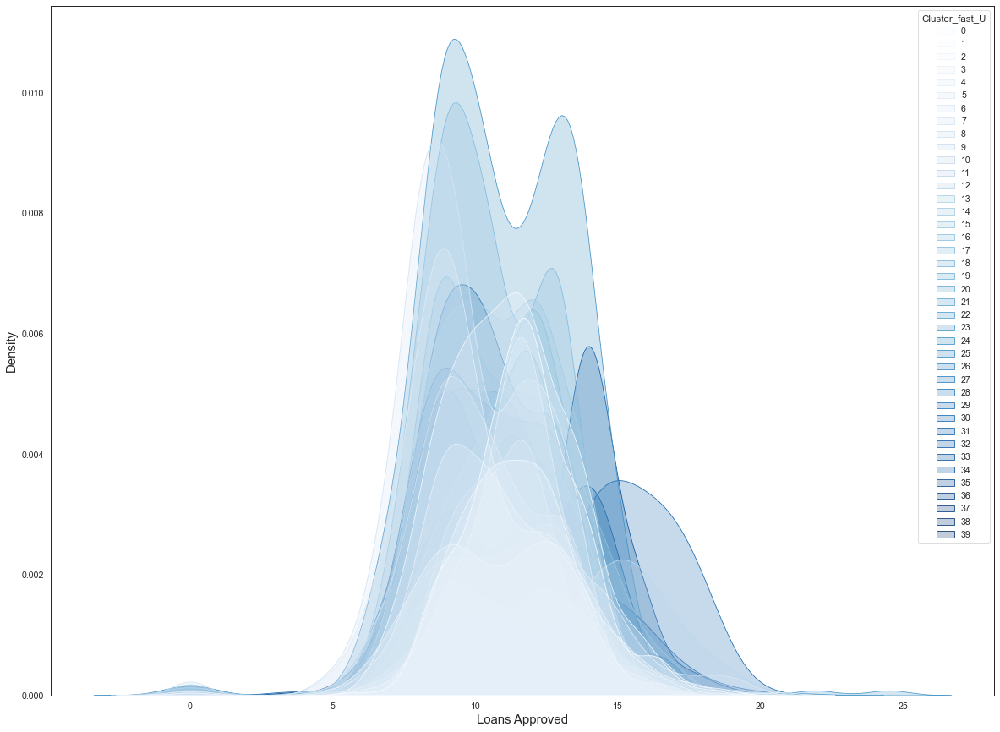

In [240]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the kdeplot and set the font

j= sns.kdeplot(data=tra_nonzero, x="loans_approved", hue="Cluster_fast_U", palette=('Blues'), shade=True)
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Loans Approved', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15)

plt.show()

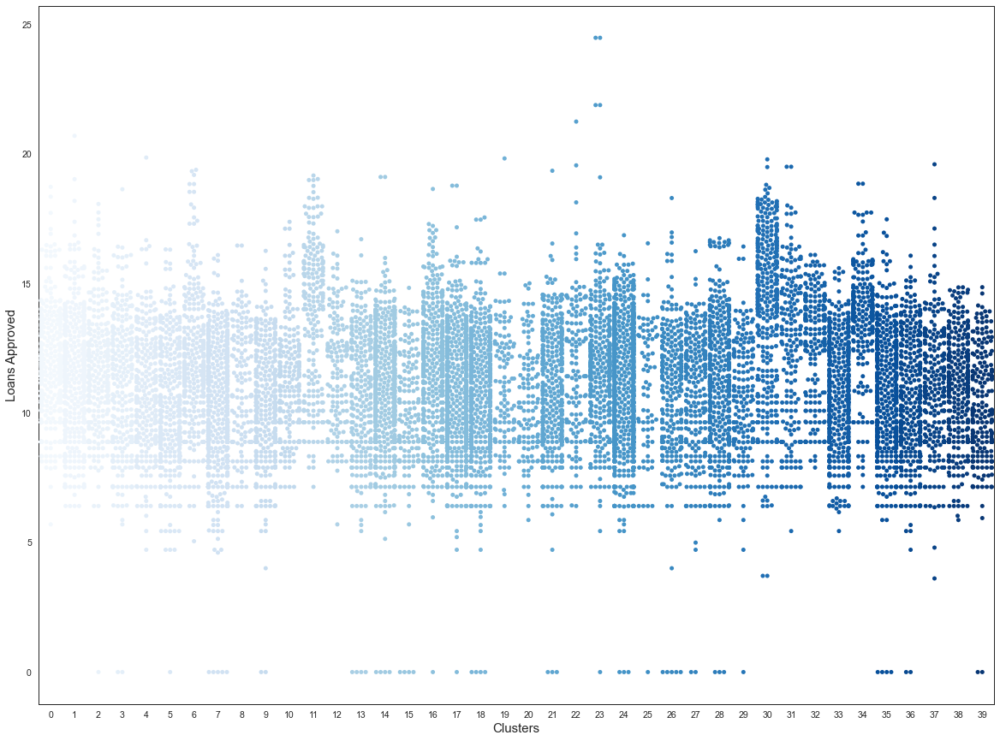

In [241]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_nonzero, x="Cluster_fast_U", y="loans_approved",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Loans Approved', fontsize = 15)

plt.show()

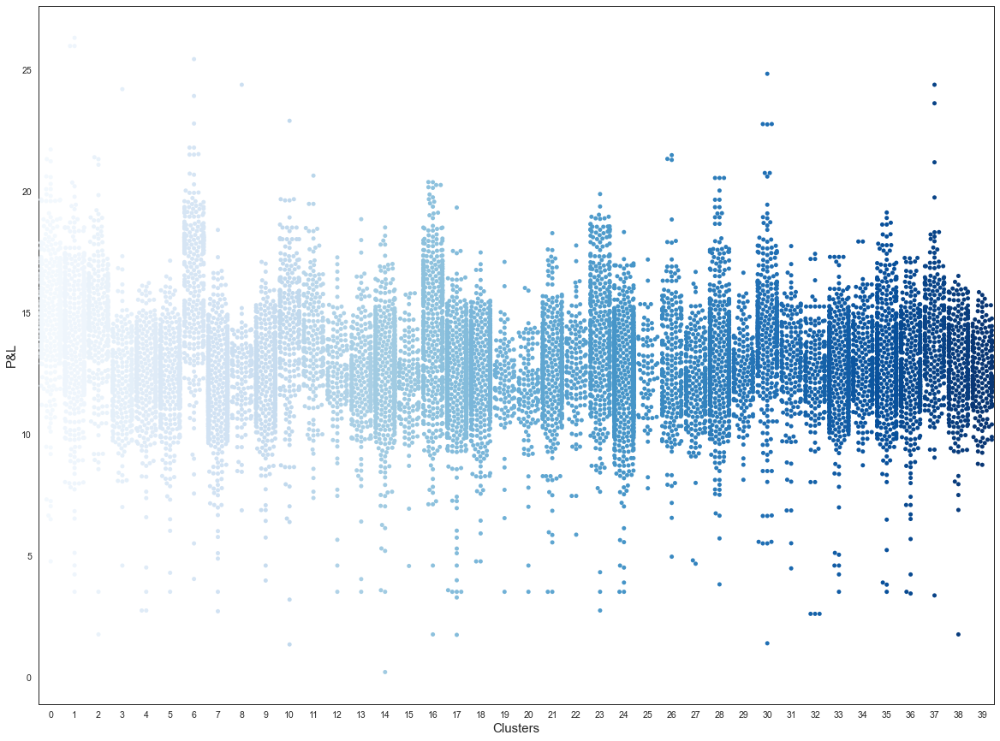

In [242]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the swarmplot and set the font

j= sns.swarmplot(data=tra_nonzero, x="Cluster_fast_U", y="pl",  palette=('Blues'))
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('P&L', fontsize = 15)

plt.show()

##### Distribution of Non-Financial Features <a class="anchor" id="24"></a>

Next we compplement the research with an analysis of non-financial features.

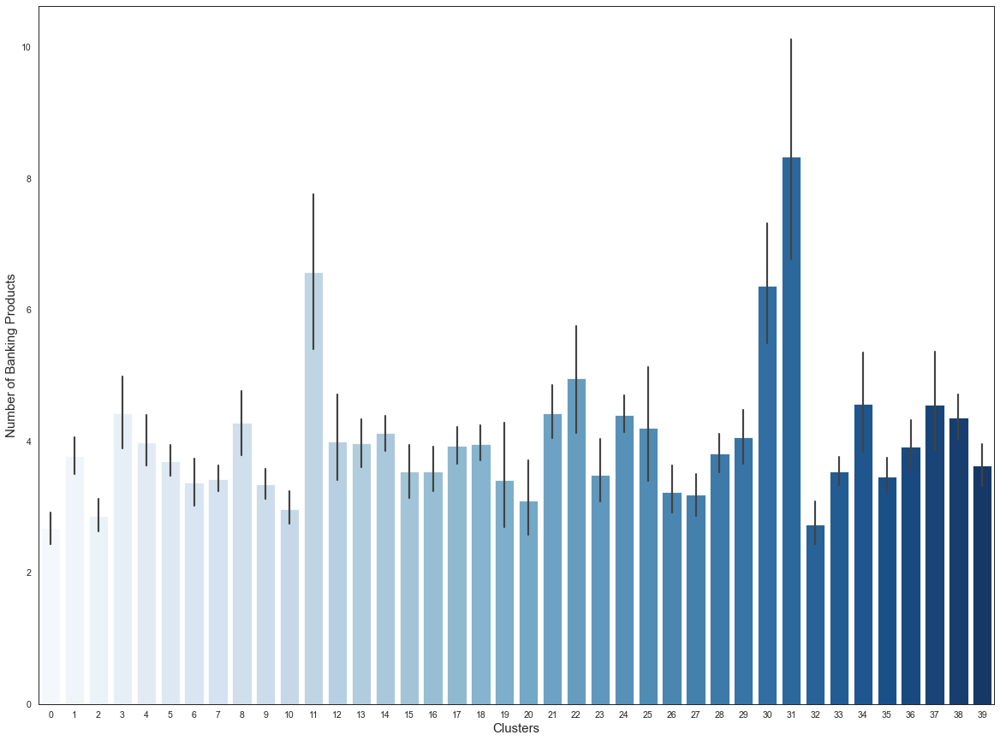

In [243]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_fast_U', y ='banking_products', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Banking Products', fontsize = 15)

#plt.savefig('Bank_fast.png', dmi=1200)

plt.show()

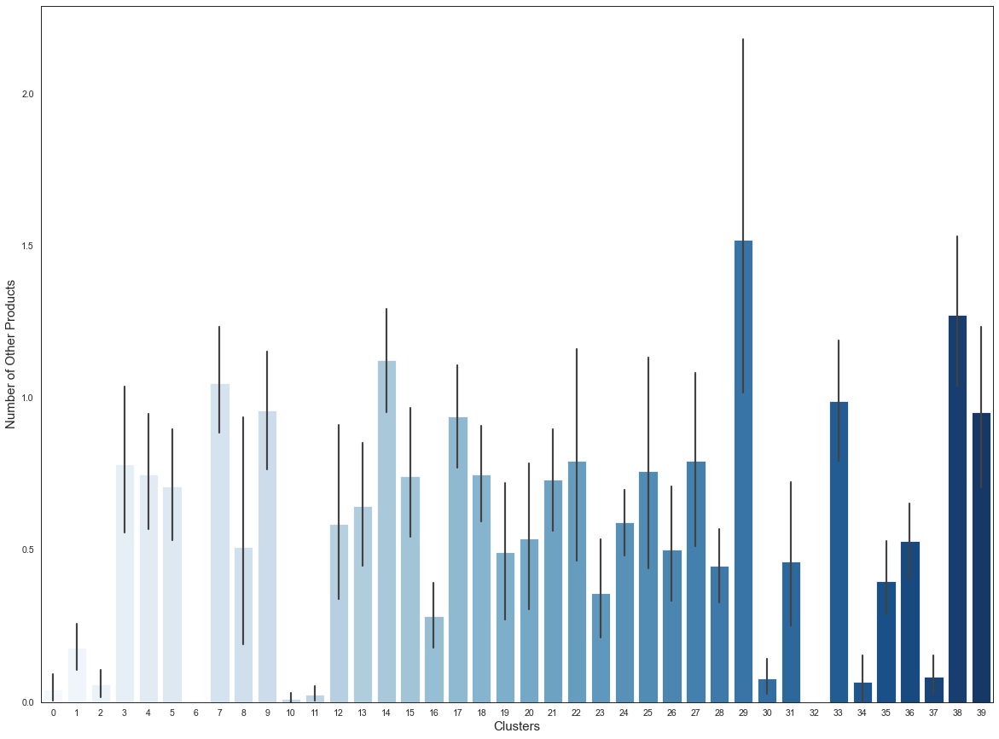

In [244]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_fast_U', y ='other_products', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Number of Other Products', fontsize = 15)

#plt.savefig('Other_fast.png', dmi=1200)

plt.show()

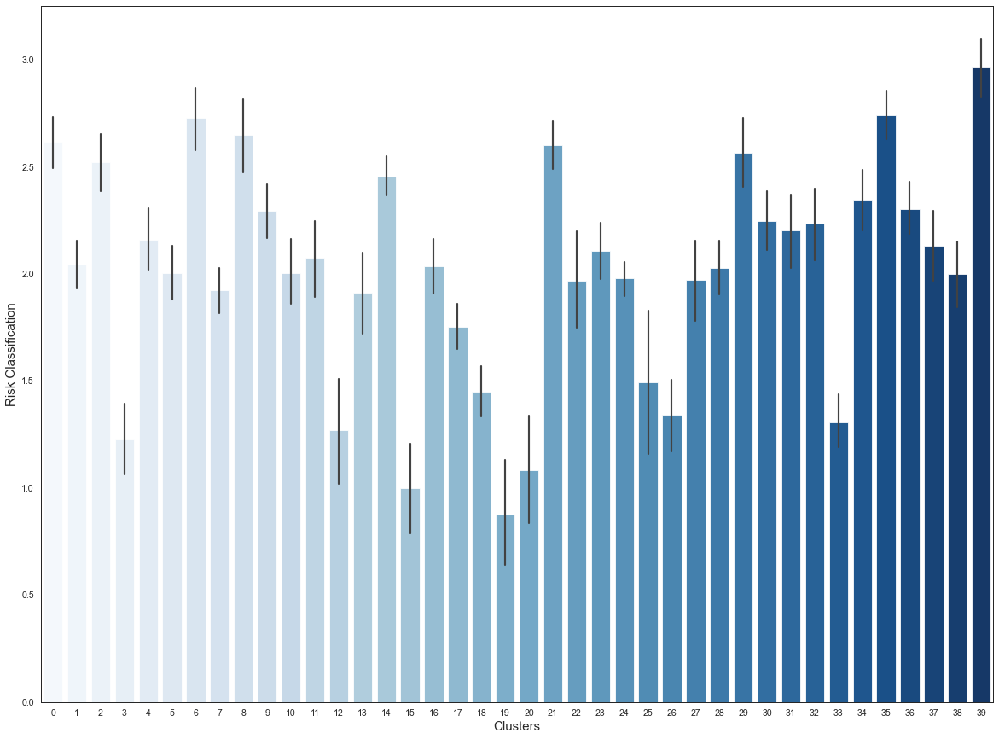

In [245]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")
#sns.set_palette("BrBG_r")

# set the size of the plot

fig, ax = plt.subplots(figsize=(20,15))


#create the barplot and set the font

j= sns.barplot(x ='Cluster_fast_U', y ='risk', data = tra_nonzero, palette ='Blues')
sns.set(font_scale = 1)

# Set title, labels and ticks to each subplot

ax.set_xlabel('Clusters', fontsize = 15)
ax.set_ylabel('Risk Classification', fontsize = 15)

#plt.savefig('Risky.png', dmi=1200)

plt.show()

<br>
<br>
<br>

<br>

### Summary of the Results <a class="anchor" id="24"></a> 


When assessing the two models, it is clear that both perform an exceptional job in segmenting the clients. Unlike the prior clusters, HAC and FasterPAM introduce more central features and do not only take into account clients from extreme sides of the spectrums. Specifically, when observing the distribution of averages per cluster it is visible that both depict clusters which are very different in their nature with differen and clear multidimensional demands. Moreover, both models clearly take into account the financial needs of the clients, developing clusters accordingly. When observing the distributions of P&L for the HAC model, the plots suggest that the clusters do not have anologous distirbutions and the different peaks suggest the firms within different clusters have specific financial characteristics. On top of that HAC does an excellent job in discerning amonsgt client liabilities too. As a result it can determine how liable different clusters and what prospected risks this might entail for the bank. When regarding the FasterPAM algorithm, this provides an even more detailed account of financial than HAC does. Precisly, the algorithm creates an optimal separation of clients based on credit (i.e. loans) with visibly different peaks. This is true even for loans approves and utilised. Furthermore, the algorithm suggests that the clusters have different P&L statements too, entailing very different financial healths. Consequentially this entails that FasterPAM can efficiently aid in predicting the credit requirements of the different clusters by determining what credit products (i.e. securities, bonds, etc.) are best suited for the clients according to howliable they are and how stable they can be in the near future. Lastly, both algorithms perform quite well with the non-financial features too, separating clients based on product utilisation and risk levels. As a result, this level of specificity in segmenting the clients suggests that both models should be adopted within a banking enviornment in order to aid core financial processes. Specifically, both algorithms can help financial analysts and relationship managers in developing credit and non-credit products, in pricing them accordingly and in understanding potential risks (i.e. credit, liquidity, etc.) and threats posed by the clients. These can further help in designining an encompassive portfolio strategy for each cluster, based on their respective strategic directions.